In [ ]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import matplotlib.font_manager as fm
import matplotlib as mpl
from matplotlib import rc
from scipy.stats import mannwhitneyu
import datetime
import json
import pickle
from tqdm import tqdm
import warnings
import lightgbm as lgb
import math
import random
import pdb
import re
from collections import defaultdict
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import *
from sklearn.model_selection import KFold
from imblearn.over_sampling import SMOTE

warnings.filterwarnings(action='ignore')




def make_datetime(x):
    # string 타입의 Time column을 datetime 타입으로 변경
    x     = str(x)
    year  = int(x[:4])
    month = int(x[4:6])
    day   = int(x[6:8])
    hour  = int(x[8:10])
    #mim  = int(x[10:12])
    #sec  = int(x[12:])
    return dt.datetime(year, month, day, hour)

def string2num(x):
    # (,)( )과 같은 불필요한 데이터 정제
    x = re.sub(r"[^0-9]+", '', str(x))
    if x =='':
        return 0
    else:
        return int(x)

def split_time(x):
    x = str(x)
    year = x[:4]
    month = x[4:6]
    day = x[6:8]
    hour = x[8:10]
    minute = x[10:12]
    second = x[12:14]
    return year, month, day, hour, minute, second

def make_time_cols(df_):
    years, months, days, hours, minutes, seconds, dates = [], [], [], [], [], [], []
    times = df_['time'].tolist()
    for i in range(len(times)):
        x = times[i]
        year, month, day, hour, minute, second = split_time(x)
        years.append(int(year))
        months.append(int(month))
        days.append(int(day))
        hours.append(int(hour))
        minutes.append(int(minute))
        seconds.append(int(second))
        dates.append(datetime.datetime.strptime(str(x), "%Y%m%d%H%M%S"))
    
    df_['year'] = years
    df_['month'] = months
    df_['day'] = days
    df_['hour']=hours
    df_['minute'] = minutes
    df_['second']= seconds
    df_['date'] = dates
    return df_


def add_time_cols(df_):
    df_ = make_time_cols(df_)
    df_['weeknum'] = df_['date'].apply(lambda x: x.weekday())
    df_['weekend'] = df_['weeknum'].apply(lambda x: 1 if x >=5 else 0)
    df_['md'] = df_['month'].apply(lambda x: str(x).zfill(2)) + df_['day'].apply(lambda x: str(x).zfill(2))
    return df_

In [ ]:
default_path = os.getcwd()
data_path = os.path.join(default_path,'data')

In [ ]:
def processing_train_test(data_path, option='train'):
    """
    raw file들에 data 객체를 넣어주고 quality의 경우 fwver값이 nan인 경우 수정함
    
    input
    ----------------------------
    data_path : data가 있는 path
    option : train or test
    """
    if option == 'train':
        err_name = 'train_err_data'
        qua_name = 'train_quality_data'
        prob_name = 'train_problem_data'
    elif option == 'test':
        err_name = 'test_err_data'
        qua_name = 'test_quality_data'
    
    df_err = pd.read_csv(data_path+f'/{err_name}.csv')
    df_err['errcode'] = df_err['errcode'].astype('str')
    df_qua = pd.read_csv(data_path+f'/{qua_name}.csv')
    
    # quality 값들에서 쉼표 없애고 숫자 형태로 만드는 과정
    for i in range(13):
        df_qua[f'quality_{i}'] = df_qua[f'quality_{i}'].apply(lambda x: re.sub(r"[^-0-9]+", '', str(x)) if type(x) == str else x)
        df_qua[f'quality_{i}'] = df_qua[f'quality_{i}'].astype(float)
    
    # 타입 변환
    df_err['errcode'] = df_err['errcode'].astype(str)
    df_err['fwver'] = df_err['fwver'].astype(str)
    df_err['model_nm'] = df_err['model_nm'].astype(str)
    
    df_qua['fwver'] = df_qua['fwver'].astype(str)
    
    
    files = [f'{err_name}_c', f'{qua_name}_c']
    temp_dfs = [df_err, df_qua]
    
    if option == 'train':
        files.append(f'{prob_name}_c')
        
        df_prob = pd.read_csv(data_path+f'/{prob_name}.csv')
        temp_dfs.append(df_prob)
    
    for i in range(len(files)):
        file = files[i]
        if not os.path.isfile(f'{data_path}/{file}.csv'):
            temp_dfs[i] = add_time_cols(temp_dfs[i])
            
            # quality data 처리
            if 'quality_data' in file:
                temp_dfs[i]['md'] = temp_dfs[i]['md'].astype(int)
                
                # 나온 결과들을 가지고 quality 데이터의 fwver 수정함
                qua_result_df = processing_quality_data_fwver(temp_dfs[0], temp_dfs[i])
                for j in range(len(qua_result_df)):
                    t_user_id = qua_result_df.iloc[j]['user_id']
                    t_date = qua_result_df.iloc[j]['date']
                    t_fwver = qua_result_df.iloc[j]['fwver']
                    
                    target_inds = temp_dfs[i][(temp_dfs[i]['user_id']==t_user_id)&(df_qua['date']==t_date)].index.tolist()
                    temp_dfs[i].loc[target_inds,'fwver'] = t_fwver
            
            
            temp_dfs[i].to_csv(f'{data_path}/{file}.csv', index=False)
            temp_dfs[i] = pd.read_csv(f'{data_path}/{file}.csv', parse_dates=['date'])
        
        # i번째 파일까지만 만들어진 경우 : 만들어진 파일을 불러옴
        else:
            temp_dfs[i] = pd.read_csv(f'{data_path}/{file}.csv', parse_dates=['date'])

In [14]:
def processing_quality_data_fwver(err_df, qua_df):
    """
    quality 데이터 처리, error 데이터에 없고 quality data에만 있는 user의 경우를 찾아 fwver 값을 다시 넣음
    
    input
    ---------------------
    err_df : error 데이터
    qua_df : quality 데이터
    
    """
    
    # 각 user_id 중 quality data와 error data의 fwver가 다른 경우 검사 대상으로 함
    errs = []
    
    g_temp_qua = qua_df.groupby(['date','md','fwver','user_id']).size().to_frame('size').reset_index()
    errs = np.unique(g_temp_qua[g_temp_qua['fwver']=='nan']['user_id']).tolist()
    
    result_qua_df = pd.DataFrame({'user_id':[],'date':[],'fwver':[]})
    
    # 각 id에 대해 검사함
    for id_ in tqdm(errs):
        
        # 각 id에서 error data의 fwver, quality data의 unique한 fwver를 구함
        temp_err = err_df[err_df['user_id']==id_]

        temp_qua = g_temp_qua[(g_temp_qua['user_id']==id_)]
        fwver_err = np.unique(temp_err['fwver'])
        fwver_qua = np.unique(temp_qua['fwver'])
        
        if len(fwver_err) == 0:
            if len(fwver_qua) == 1 and fwver_qua[0] == 'nan':
                continue
        
        # quality의 fwver에 nan이 존재할 경우
        dates = np.unique(temp_qua['date'])
        for date in dates:
            
            # 현재 fwver이 nan인 quality의 date보다 이전 시기에 있던 error의 fwver를 분석
            t_temp_qua = temp_qua[temp_qua['date']==date]
            t_temp_err = temp_err[temp_err['date']<date].sort_values('date').reset_index(drop=True)
            
            # 만약 error 데이터에서도 해당 date 이전에 fwver이 1개였다면 해당 quality data의 fwver은 지금 나온 error의 fwver로 교체
            if len(t_temp_err) > 0 :
                result_qua_df = result_qua_df.append({'user_id':id_, 'date':date, 
                                                      'fwver':t_temp_err.iloc[-1]['fwver']},
                                                    ignore_index=True)
            
            # 만약 일치하는 error 데이터가 아예 없을 경우
            else :
                # 해당 quality 데이터의 date 이후 기준, 가장 근접한 error date를 기준으로 fwver로 만듦
                t_temp_err = temp_err[temp_err['date']>date].sort_values('date').reset_index(drop=True)
                t_temp_err_fwver = np.unique(t_temp_err['fwver'])
                

                result_qua_df = result_qua_df.append({'user_id':id_, 'date':date, 
                                                      'fwver':t_temp_err.iloc[0]['fwver']},
                                                    ignore_index=True)

    
    return result_qua_df




def processing_not_fwver_in_errors_but_quality(err_df, qua_df):
    """
    특정 user에 대해 err에는 없으나 quality 데이터에서 새로운 fwver이 나온 기록이 있을 경우 찾아주는 함수
    
    input
    ---------------------
    err_df : error 데이터
    qua_df : quality 데이터
    
    """
    

    errs = []
    
    g_temp_qua = qua_df.groupby(['date','md','fwver','user_id']).size().to_frame('size').reset_index()
    
    # 해당하는 user_id의 quality fwver와 error fwver의 합집합(unique) 개수와 error fwver의 개수가 
    # 일치하지 않을 경우 검사 대상에 추가함  
    for id_ in tqdm(np.unique(g_temp_qua['user_id'])):
        fwver_err = np.unique(err_df[err_df['user_id']==id_]['fwver'])
        len_err_fwver = len(fwver_err)
        
        fwver_qua = np.unique(g_temp_qua[g_temp_qua['user_id']==id_]['fwver'])

        try:
            if len(np.union1d(fwver_err, fwver_qua)) != len_err_fwver :

                errs.append(id_)
        except:
            pdb.set_trace()
         
    return errs




def processing_temp_change_df(err_df, qua_df, temp_list):
    """
    특정 user에 대해 err에는 없으나 quality 데이터에서 새로운 fwver이 나온 기록이 있을 경우
    
    input
    ---------------------------------------
    
    err_df : err data
    
    qua_df : quality data
    
    temp_list : processing_not_fwver_in_errors_but_quality 함수로 나온 결과값
    """
    
    temp_change_df = pd.DataFrame({'id':[],'upgrade':[],'downgrade':[],
                                  'change_model':[],'change_version':[],
                                  'change_all':[], 'model':[], 'version':[]})
    
    model_fwver_df = err_df.groupby(['model_nm','fwver']).size().to_frame('size').reset_index().drop('size',axis=1)
    
    for id_ in tqdm(temp_list):
        temp_err = err_df[err_df['user_id']==id_]
        temp_qua = qua_df[qua_df['user_id']==id_]
        fwver_err = np.unique(temp_err['fwver'])
        fwver_qua = np.unique(temp_qua['fwver'])
        
        # quality error의 fwver을 순서대로 나열함
        fwvers = []
        t_temp_err = temp_err[temp_err['user_id']==id_][['date','fwver']].sort_values('date').reset_index(drop=True)
        fwvers = t_temp_err.drop('date',axis=1).drop_duplicates()['fwver'].tolist()
        
        t_temp_qua = temp_qua[temp_qua['user_id']==id_][['date','fwver']].sort_values('date').reset_index(drop=True)
        qua_fwvers = t_temp_qua.drop('date',axis=1).drop_duplicates()['fwver'].tolist()
        
        # 만약 quality data의 fwver이 error data의 fwver를 포함하는 경우 quality로 fwver 값을 취급함
        if len(np.intersect1d(fwvers, qua_fwvers)) == len(fwvers):
            fwvers = qua_fwvers[:]
            
        # 서로 교차하는 경우
        else:
            
            target_fwver_qua = np.setdiff1d(fwver_qua, fwvers)
            
            for fwver in target_fwver_qua:
                
                if fwver in fwvers:
                    continue
                
                # error data에 포함되지 않은 fwver이 quality에서 최초로 나온 날
                date = temp_qua[temp_qua['fwver']==fwver].iloc[0]['date']
                
                # 특정 quality fwver을 error에서 나온 fwver의 날짜와 비교함
                for i in range(len(fwvers)):
                    fwver_err = fwvers[i]

                    # 만약 error에서 나온 fwver의 마지막 날보다 quality data에서 나온 fwver값이 작으면 그 값 사이에 fwver를 넣음
                    err_date = temp_err[temp_err['fwver']==fwver_err].iloc[-1]['date']
                    if date < err_date:
                        fwvers = fwvers[:i] + [fwver] + fwvers[i:]
                        break
                        
            # 다 처리했는데도 남은경우 : 맨 끝에 있는 값들이므로 뒤에 넣음
            if len(np.setdiff1d(fwver_qua, fwvers)) > 0:
                for fwver in np.setdiff1d(fwver_qua, fwvers):
                    if fwver != 'nan':
                        fwvers.append(fwver)
        
        
        upgrade = 0
        downgrade = 0
        change_model = 0
        change_version = 0
        change_all = 0
        
        # 만약 past version이 09.17.1431인 경우 : train err에서 아예 없던 version이므로 model_100이라는 새로운 데이터로 전환함
        past_version = fwvers[0]
        
        if past_version == '09.17.1431':

            past_model = 'model_100'
        else:
            past_model = model_fwver_df[model_fwver_df['fwver']==past_version]['model_nm'].squeeze()
        
        models = []
        models.append(past_model)
        for i in range(1,len(fwvers)):

            cur_version = fwvers[i]
            if cur_version == '09.17.1431':
                cur_model = 'model_100'
            else:
                cur_model = model_fwver_df[model_fwver_df['fwver']==cur_version]['model_nm'].squeeze()
            
            
            if past_model != cur_model:
                models.append(cur_model)
                change_model +=1
                change_all +=1


            if past_version != cur_version:
                change_version +=1

                past_version_f = past_version.split('.')
                past_version_f = float(past_version_f[0] + '.' + ''.join(past_version_f[1:]))

                cur_version_f = cur_version.split('.')
                cur_version_f = float(cur_version_f[0] + '.' + ''.join(cur_version_f[1:]))

                if past_model == cur_model and past_version_f > cur_version_f:
                    downgrade +=1
                elif past_model == cur_model and past_version_f < cur_version_f:
                    upgrade +=1
                change_all +=1  

            past_version = cur_version
            past_model = cur_model
        
        fwvers = '_'.join(fwvers)
        models = '_'.join(models)

        temp_change_df = temp_change_df.append({'id':id_,'upgrade':upgrade,'downgrade':downgrade,
                                  'change_model':change_model,'change_version':change_version,
                                  'change_all':change_all, 'version':fwvers, 'model':models}, ignore_index=True)
    return temp_change_df

In [15]:
def make_change_dict(err_df, qua_df, data_path, option = 'train'):

    change_dict = {}
    change_dict['id'] = []
    change_dict['upgrade'] = []
    change_dict['downgrade'] = []
    change_dict['change_model'] = []
    change_dict['change_version'] = []
    change_dict['change_all'] = []
    change_dict['model'] = []
    change_dict['version'] = []
    all_ids = np.unique(err_df['user_id'])
    
    if not os.path.isfile(f"{data_path}/{option}_upgrade_dict.json"):
        for id_ in tqdm(all_ids):
            temp_df = err_df[err_df['user_id']==id_].sort_values('date').reset_index(drop=True)
            
            unique_model = np.unique(temp_df['model_nm'])
            unique_version = np.unique(temp_df['fwver'])
            
            if len(unique_model) != 1 or len(unique_version)!=1:
                
                past_version = temp_df.loc[0,'fwver']
                past_model = temp_df.loc[0,'model_nm']
                upgrade = 0
                downgrade = 0
                change_model = 0
                change_version = 0
                change_all = 0

                for i in range(1,len(temp_df)):
                    cur_version = temp_df.loc[i,'fwver']
                    cur_model = temp_df.loc[i,'model_nm']

                    if past_model != cur_model:
                        change_model +=1
                        change_all +=1

                        
                    if past_version != cur_version:
                        change_version +=1
                        
                        past_version_f = past_version.split('.')
                        past_version_f = float(past_version_f[0] + '.' + ''.join(past_version_f[1:]))

                        cur_version_f = cur_version.split('.')
                        cur_version_f = float(cur_version_f[0] + '.' + ''.join(cur_version_f[1:]))
                        if past_model == cur_model and past_version_f > cur_version_f:
                            downgrade +=1
                        elif past_model == cur_model and past_version_f < cur_version_f:
                            upgrade +=1
                        change_all +=1  
                        
                    past_version = cur_version
                    past_model = cur_model
                
                versions = '_'.join(temp_df['fwver'].drop_duplicates().tolist())
                models = '_'.join(temp_df['model_nm'].drop_duplicates().tolist())
                
                change_dict['id'].append(id_)
                change_dict['upgrade'].append(upgrade)
                change_dict['downgrade'].append(downgrade)
                change_dict['change_model'].append(change_model)
                change_dict['change_version'].append(change_version)
                change_dict['change_all'].append(change_all)
                change_dict['version'].append(versions)
                change_dict['model'].append(models)
        

        temp_list = processing_not_fwver_in_errors_but_quality(err_df, qua_df)

        temp_change_df = processing_temp_change_df(err_df, qua_df, temp_list)
        
        change_dict['id'] =list(map(int, change_dict['id']))
        
        for i in range(len(temp_change_df)):
            t_id = int(temp_change_df.iloc[i]['id'])
            upgrade = temp_change_df.iloc[i]['upgrade']
            downgrade = temp_change_df.iloc[i]['downgrade']
            change_model = temp_change_df.iloc[i]['change_model']
            change_version = temp_change_df.iloc[i]['change_version']
            change_all = temp_change_df.iloc[i]['change_all']
            versions = temp_change_df.iloc[i]['version']
            models = temp_change_df.iloc[i]['model']
            
            try:
                t_ind = change_dict['id'].index(t_id)
                change_dict['id'][t_ind] = t_id
                change_dict['upgrade'][t_ind] = upgrade
                change_dict['downgrade'][t_ind] = downgrade
                change_dict['change_model'][t_ind] = change_model
                change_dict['change_version'][t_ind] = change_version
                change_dict['change_all'][t_ind] = change_all
                change_dict['version'][t_ind] = versions
                change_dict['model'][t_ind] = models
                
            except ValueError :
                change_dict['id'].append(t_id)
                change_dict['upgrade'].append(upgrade)
                change_dict['downgrade'].append(downgrade)
                change_dict['change_model'].append(change_model)
                change_dict['change_version'].append(change_version)
                change_dict['change_all'].append(change_all)
                change_dict['version'].append(versions)
                change_dict['model'].append(models)
            
            
        
        with open(f"{data_path}/{option}_upgrade_dict.json", "w") as f:
            json.dump(change_dict, f)
    else:
        pass

def assign_hour_cluster(x):
    if x in [19, 20,21,22,23,0,1]:
        return 0
    elif x in [2,3,4,5,6]:
        return 1
    else :
        return 2
    
def assign_week(x):
    if int(str(x)[1]) == 0 or x == 1101:
        return -1
    elif int(str(x)[1]) == 1:
        return (int(str(x)[2:]) -2)//7 
    else:
        if x <= 1202:
            return 4
        else:
            return 5

In [16]:
processing_train_test(data_path, 'train')
processing_train_test(data_path, 'test')

100%|██████████| 51/51 [00:05<00:00,  9.32it/s]


In [17]:
train_err = pd.read_csv(data_path+'/train_err_data_c.csv', parse_dates=['date'])
train_err['hour_cluster'] = train_err['hour'].apply(lambda x: assign_hour_cluster(x))
train_err['week_cluster'] = train_err['md'].apply(lambda x: assign_week(x))

test_err = pd.read_csv(data_path+'/test_err_data_c.csv', parse_dates=['date'])
test_err['hour_cluster'] = test_err['hour'].apply(lambda x: assign_hour_cluster(x))
test_err['week_cluster'] = test_err['md'].apply(lambda x: assign_week(x))

train_qua = pd.read_csv(data_path+'/train_quality_data_c.csv', parse_dates=['date'])
test_qua = pd.read_csv(data_path+'/test_quality_data_c.csv', parse_dates=['date'])

train_qua = train_qua.fillna(0)
test_qua = test_qua.fillna(0)

train_qua['hour_cluster'] = train_qua['hour'].apply(lambda x: assign_hour_cluster(x))
train_qua['week_cluster'] = train_qua['md'].apply(lambda x: assign_week(x))

test_qua['hour_cluster'] = test_qua['hour'].apply(lambda x: assign_hour_cluster(x))
test_qua['week_cluster'] = test_qua['md'].apply(lambda x: assign_week(x))

In [18]:

if not os.path.isfile(f"{data_path}/train_upgrade_dict.json"):
    make_change_dict(train_err, train_qua, data_path, option = 'train')

if not os.path.isfile(f"{data_path}/test_upgrade_dict.json"):
    make_change_dict(test_err, test_qua, data_path, option = 'test')

In [19]:
with open(f"{data_path}/train_upgrade_dict.json", "r") as f:
    train_change_dict = json.load(f)
with open(f"{data_path}/test_upgrade_dict.json", "r") as f:
    test_change_dict = json.load(f)

In [20]:
def extract_change_df(change_dict):

    change_df = pd.DataFrame({'user_id':change_dict['id'], 'upgrade':change_dict['upgrade'],
                         'downgrade':change_dict['downgrade'], 'change_model':change_dict['change_model'],
                         'change_version':change_dict['change_version'],
                         'change_all':change_dict['change_all'], 
                             'model':change_dict['model'],
                             'version':change_dict['version']})
    return change_df

In [21]:
train_ids = np.unique(train_err['user_id'])

In [22]:
train_change_df = extract_change_df(train_change_dict)
test_change_df = extract_change_df(test_change_dict)

In [23]:
"""
if 'err' not in train_err.columns:
    train_err['err'] = train_err['errtype'].astype(str)+ '_' + train_err['errcode'].astype(str)
errcode_delete_cols = make_delete_errcode_dict(train_err)

if 'err' not in test_err.columns:
    test_err['err'] = test_err['errtype'].astype(str)+ '_' + test_err['errcode'].astype(str)
"""

"\nif 'err' not in train_err.columns:\n    train_err['err'] = train_err['errtype'].astype(str)+ '_' + train_err['errcode'].astype(str)\nerrcode_delete_cols = make_delete_errcode_dict(train_err)\n\nif 'err' not in test_err.columns:\n    test_err['err'] = test_err['errtype'].astype(str)+ '_' + test_err['errcode'].astype(str)\n"

In [24]:
"""
ok_err_list = np.intersect1d(np.unique(train_err['err']), np.unique(test_err['err']))
ok_err_list = np.setdiff1d(ok_err_list, errcode_delete_cols)
"""

"\nok_err_list = np.intersect1d(np.unique(train_err['err']), np.unique(test_err['err']))\nok_err_list = np.setdiff1d(ok_err_list, errcode_delete_cols)\n"

In [25]:
"""
train_err['err'] = train_err['err'].apply(lambda x : x if x in ok_err_list else 'nan_nan')
test_err['err'] = test_err['err'].apply(lambda x : x if x in ok_err_list else 'nan_nan')
"""

"\ntrain_err['err'] = train_err['err'].apply(lambda x : x if x in ok_err_list else 'nan_nan')\ntest_err['err'] = test_err['err'].apply(lambda x : x if x in ok_err_list else 'nan_nan')\n"

## 모델링

In [26]:
def processing_qua(qua_df):
    quality_cols = [f'quality_{i}' for i in range(13)]
    temp_size_qua = qua_df.groupby(['user_id','date']).sum().reset_index()
    temp_size_qua = temp_size_qua.groupby(['user_id']).size().to_frame('quality_num').reset_index()
    temp_size_qua['quality_num'] = temp_size_qua['quality_num'].apply(lambda x: 1 if x != 0 else 0)
    
    temp_mean_qua = qua_df.copy()
    temp_mean_qua = temp_mean_qua.fillna(0)
    temp_mean_qua = temp_mean_qua.groupby(['user_id']).mean().reset_index()[['user_id']+quality_cols]
    f_qua_df = pd.merge(temp_size_qua, temp_mean_qua, on='user_id', how='left')
    return f_qua_df

def make_pivot_table(err_df, col, appear_option = False, test_err_df=None, test_option=False):
    err_pivot = err_df.groupby(['user_id',col]).size().to_frame('size').reset_index()
    err_pivot= pd.pivot_table(err_pivot, index='user_id', columns=[col], values='size').add_prefix(f'col_{col}_')
    err_pivot.index.name = None
    err_pivot.columns.name = None
    err_pivot = err_pivot.fillna(0)
    err_pivot['user_id'] = err_pivot.index.tolist()
    err_pivot = err_pivot.reset_index(drop=True)
    if test_option == True:
        test_unique_values = np.unique(test_err_df[col])
        need_cols = np.setdiff1d(test_unique_values, np.unique(err_df[col]))
        for t_col in need_cols:
            err_pivot[f'col_{col}_{t_col}'] = 0
            
    if appear_option == True:
        for t_col in err_pivot:
            if t_col =='user_id':
                continue
            err_pivot[t_col] = err_pivot[t_col].apply(lambda x: 1 if x != 0 else 0)
    
    return err_pivot


def make_quality_pivot_table(qua_df, date_col, operation1='sum', operation2='mean'):
    quality_cols = ['quality_%s'%(i) for i in range(13)]
    if operation1 == 'sum':
        g_qua_df = qua_df.groupby(['user_id','date',date_col]).sum().reset_index()
    elif operation1 == 'mean':
        g_qua_df = qua_df.groupby(['user_id','date',date_col]).mean().reset_index()
    elif operation1 == 'max':
        g_qua_df = qua_df.groupby(['user_id','date',date_col]).max().reset_index()
    elif operation1 == 'min':
        g_qua_df = qua_df.groupby(['user_id','date',date_col]).min().reset_index()
    elif operation1 == 'std':
        g_qua_df = qua_df.groupby(['user_id','date',date_col]).std().reset_index()

    if operation2 == 'sum':
        t_g_qua_df = g_qua_df.groupby(['user_id',date_col]).sum().reset_index().fillna(0)

    elif operation2 == 'mean':
        t_g_qua_df = g_qua_df.groupby(['user_id',date_col]).mean().reset_index().fillna(0)

    elif operation2 == 'min':
        
        t_g_qua_df = g_qua_df.groupby(['user_id',date_col]).min().reset_index().fillna(0)
    
    elif operation2 == 'max':
        t_g_qua_df = g_qua_df.groupby(['user_id',date_col]).max().reset_index().fillna(0)
    elif operation2 == 'std':
        t_g_qua_df = g_qua_df.groupby(['user_id',date_col]).std().reset_index().fillna(0)
    return t_g_qua_df[['user_id',date_col]+quality_cols]

In [27]:
# 모델 추출
def make_model_df(train_err, col):
    temp_df = train_err.groupby([col,'user_id']).sum().reset_index()
    temp_df = temp_df.groupby([col,'user_id']).size().to_frame('size').reset_index()
    model_pivot = pd.pivot_table(temp_df, index='user_id', columns=col, values='size').fillna(0)
    model_pivot.index.name = None
    model_pivot.columns.name = None
    model_pivot['user_id'] = model_pivot.index.tolist()
    model_pivot = model_pivot.reset_index(drop=True)
    return model_pivot
#model_pivot = make_model_df(train_err, 'model_nm')


def processing_col(test_df, train_df):
    not_train_cols = np.setdiff1d(test_df.columns, train_df.columns)
    add_train_cols = np.setdiff1d(train_df.columns, test_df.columns)
    
    for col in not_train_cols:
        test_df = test_df.drop(col, axis=1)
    for col in add_train_cols:
        test_df[col] = 0
    return test_df


def processing_outliers(err_df, num=5):
    
    # 전체 error기준으로 처리
    all_error_df = err_df.groupby(['user_id']).size().to_frame('size').reset_index()
    mean = np.mean(all_error_df['size'])
    std = np.std(all_error_df['size'])

    all_err_ids = all_error_df[all_error_df['size']>=mean+num*std]['user_id'].tolist()
    
    
    t1 = err_df.groupby(['user_id','errtype']).size().to_frame('size').reset_index()
    f_ids = []
    for i in np.unique(err_df['errtype']):
        t_t1 = t1[t1['errtype']==i]
        mean = np.mean(t_t1['size'])
        std = np.std(t_t1['size'])

        t_ids = t_t1[t_t1['size']>=mean+num*std]['user_id'].tolist()

        f_ids += t_ids
    err_df = err_df[~err_df['user_id'].isin(f_ids)].reset_index(drop=True)
    #err_df = err_df[~err_df['user_id'].isin(all_err_ids)].reset_index(drop=True)
    
    
    return err_df

In [28]:
def check_quality_in_error(err_df, err_qua):
    
    """
    quality 검사를 할 때 검사 중에 error가 포함된 id를 추출함
    """
    
    targets = []
    targets_ids = []
    for t_id in tqdm(np.unique(err_df['user_id'])):
        temp_qua = err_qua[err_qua['user_id']==t_id].reset_index(drop=True)
        temp_err = err_df[err_df['user_id']==t_id].reset_index(drop=True)
        dates = np.unique(temp_qua['date'])
        for date in dates:
            t_temp_qua = temp_qua[temp_qua['date']==date]
            start = date
            end = date + pd.Timedelta(datetime.timedelta(minutes=10*len(t_temp_qua)-1))
            length = len(temp_err[(temp_err['date']>=start)&(temp_err['date']<=end)])
            if  length > 0:
                fwver = t_temp_qua.iloc[0]['fwver']
                targets.append((t_id, pd.to_datetime(date), length, fwver))
                targets_ids.append(t_id)
    
    return targets, targets_ids

def processing_quality_data(err_df, qua_df):
    
    """
    quality 검사 중간에 포함된 error에 대해 각 id별 평균 포함 개수를 구함
    """
    
    targets, _ = check_quality_in_error(err_df, qua_df)
    length_dict = defaultdict(int)
    size_dict = defaultdict(int)
    for i in range(len(targets)):
        id_, _, length, _ = targets[i]
        length_dict[id_] +=length
        size_dict[id_] +=1

    for key in size_dict.keys():

        length_dict[key] /= size_dict[key]
    
    user_df = pd.DataFrame({'user_id':np.unique(err_df['user_id'])})
    result_df = pd.DataFrame({'user_id':[i for i in length_dict.keys()], 'ok_err_size':[i for i in length_dict.values()]})
    result_df = pd.merge(user_df, result_df, on='user_id', how='left').fillna(0)
    

    # 각 등장횟수 추가
    temp_df = qua_df.groupby(['user_id','date','weeknum']).mean().reset_index()
    temp_df = temp_df.groupby(['user_id','weeknum']).size().to_frame('size').reset_index()

    temp_pivot = pd.pivot_table(temp_df, values='size', columns='weeknum', index='user_id').fillna(0).add_prefix('weeknum_size_')
    temp_pivot.index.name = None
    temp_pivot.columns.name = None
    temp_pivot['user_id'] = temp_pivot.index.tolist()
    temp_pivot = temp_pivot.reset_index(drop=True)
    result_df = pd.merge(result_df, temp_pivot, on='user_id', how='left').fillna(0)
    
    # 주간 quality 값
    temp_df = qua_df.groupby(['user_id','date','weeknum']).sum().reset_index()
    temp_df = temp_df.groupby(['user_id','weeknum']).mean().reset_index()
    quality_cols = ['quality_%s'%i for i in range(13)]
    for q_col in quality_cols:
        
        temp_pivot = pd.pivot_table(temp_df, index='user_id', values=q_col, columns='weeknum').fillna(0)
        temp_pivot.columns = ['%s_weeknum_%s'%(q_col, i) for i in range(7)]
        temp_pivot.index.name = None
        temp_pivot.columns.name = None
        temp_pivot['user_id'] = temp_pivot.index.tolist()
        temp_pivot = temp_pivot.reset_index(drop=True)
        result_df = pd.merge(result_df, temp_pivot, on='user_id', how='left').fillna(0)
    
    
    # week_cluster, hour_cluster 값 추가
        # week
    week_cluster_df = make_quality_pivot_table(qua_df, 'week_cluster', operation1='sum', operation2='mean')
    for t_num in np.unique(week_cluster_df['week_cluster']):
        temp_df = week_cluster_df[week_cluster_df['week_cluster']==t_num]
        temp_df = temp_df[['user_id']+quality_cols]
        temp_df.columns = ['user_id'] + [f'week_cluster_%s_%s'%(t_num,i) for i in quality_cols]
        result_df = pd.merge(result_df, temp_df, on='user_id', how='left').fillna(0)
    
        # hour
    hour_cluster_df = make_quality_pivot_table(qua_df, 'hour_cluster', operation1='sum', operation2='mean')
    for t_num in np.unique(hour_cluster_df['hour_cluster']):
        temp_df = hour_cluster_df[hour_cluster_df['hour_cluster']==t_num]
        temp_df = temp_df[['user_id']+quality_cols]
        temp_df.columns = ['user_id'] + [f'hour_cluster_%s_%s'%(t_num,i) for i in quality_cols]
        result_df = pd.merge(result_df, temp_df, on='user_id', how='left').fillna(0)

    
    return result_df






def processing_err_unit_ratio(err_df, date_col='hour', col='errtype', unique_col_list = ''):
    """
    시간별, 주간별 각 user의 error 비율값을 구함
    """
    
    col_df = ''
    if unique_col_list == '':
        target_errs = np.unique(err_df[col])
    else:
        target_errs = unique_col_list
        

    col_df = pd.DataFrame({date_col:np.unique(err_df[date_col])})

    key_col_err = err_df.groupby(['user_id',date_col,col]).size().to_frame('size').reset_index()
    result_df = pd.DataFrame({'user_id':np.unique(err_df['user_id'])})
    
    
    for errtype in np.unique(target_errs):
        temp_df = key_col_err[key_col_err[col]==errtype]
        temp_df = pd.merge(col_df, temp_df, on=date_col, how='left').fillna(0)
        temp_pivot = pd.pivot_table(temp_df, index='user_id', columns=date_col, values='size').add_prefix(f'{col}_{errtype}_{date_col}_').fillna(0)
        #temp_pivot = temp_pivot/np.sum(temp_pivot,axis=1).values.reshape(-1,1)
        temp_pivot.columns.name = None
        temp_pivot.index.name = None
        temp_pivot['user_id'] = temp_pivot.index.tolist()
        temp_pivot = temp_pivot.reset_index(drop=True)
        result_df = pd.merge(result_df, temp_pivot, on='user_id', how='left').fillna(0)
    return result_df

def check_change_model():
    col = 'model_nm'
    user_version_dict = defaultdict(list)
    user_ids = []
    versions = []
    for id_ in tqdm(valid_user_ids):
        temp_err = train_err[train_err['user_id']==id_].sort_values('date')
        temp_err = temp_err[[col]].drop_duplicates()
        result = '_'.join(temp_err[col].tolist())
        user_version_dict[result].append(id_)
        user_ids.append(id_)
        versions.append(result)

In [29]:
train_change_df

,user_id,upgrade,downgrade,change_model,change_version,change_all,model,version
0,10001,1.0,0.0,0.0,1.0,1.0,model_2,04.33.1185_04.33.1261
1,10003,1.0,0.0,0.0,1.0,1.0,model_2,04.33.1185_04.33.1261
2,10004,1.0,0.0,0.0,1.0,1.0,model_0,04.22.1750_04.22.1778
3,10005,1.0,0.0,0.0,1.0,1.0,model_0,04.22.1750_04.22.1778
4,10006,0.0,0.0,1.0,1.0,2.0,model_1_model_2,04.16.3553_04.33.1261
...,...,...,...,...,...,...,...,...
8604,23538,1.0,0.0,0.0,1.0,1.0,model_2,04.33.1149_04.33.1261
8605,23550,0.0,0.0,1.0,1.0,2.0,model_100_model_2,09.17.1431_04.33.1261
8606,24005,1.0,0.0,0.0,1.0,1.0,model_2,04.33.1185_04.33.1261
8607,24530,0.0,0.0,1.0,1.0,2.0,model_100_model_4,09.17.1431_03.11.1167


In [30]:
train_ids = np.unique(train_err['user_id'])
train_users_df = pd.DataFrame({'user_id':train_ids})

In [31]:
train_err = processing_outliers(train_err, num=5)

In [32]:
# errcode 만들기
temp_errcode_df = train_err.groupby(['user_id','errcode']).sum().reset_index()
temp_errcode_df = temp_errcode_df.groupby('errcode').size().to_frame('size').reset_index()
ok_err_codes = temp_errcode_df[temp_errcode_df['size']>100]['errcode'].tolist()
#ok_err_codes = ['scanning timeout','terminate by peer user','Q-64002','P-41007','P-44010','PHONE_ERR','U-82026']
train_errcode = train_err[train_err['errcode'].isin(ok_err_codes)]
train_errcode_pivot = make_pivot_table(train_errcode, 'errcode', False)

In [33]:
train_errtype_pivot = make_pivot_table(train_err, 'errtype')
train_errtype_pivot['col_errtype_std'] = np.std(train_errtype_pivot.iloc[:,:-1],axis=1)
train_week_cluster_pivot = make_pivot_table(train_err, 'week_cluster', False)
train_hour_cluster_pivot = make_pivot_table(train_err, 'hour_cluster', False)
train_all_error = train_err.groupby(['user_id']).size().to_frame('all_error').reset_index()
train_model_pivot = make_pivot_table(train_err, 'model_nm', True)
train_fwver_pivot = make_pivot_table(train_err, 'fwver', True)


In [34]:
train_data = pd.DataFrame({'user_id': train_ids})
train_data = pd.merge(train_data, train_errtype_pivot, on='user_id', how='left')
train_data = pd.merge(train_data, train_all_error, on='user_id', how='left')
train_data = pd.merge(train_data, train_week_cluster_pivot, on='user_id', how='left')
train_data = pd.merge(train_data, train_hour_cluster_pivot, on='user_id', how='left')
train_data = pd.merge(train_data, train_fwver_pivot, on='user_id', how='left')
train_data = pd.merge(train_data, train_errcode_pivot, on='user_id', how='left')

#train_data = pd.merge(train_data, train_model_pivot, on='user_id', how='left')
#train_data = pd.merge(train_data, train_model_pivot, on='user_id', how='left')


change 처리

In [35]:
train_data = pd.merge(train_data, train_change_df[['user_id', 'upgrade', 'downgrade', 'change_model', 'change_version', 'change_all']], on='user_id', how='left')

In [36]:
train_change_model_pivot = make_pivot_table(train_change_df, 'model')
train_data = pd.merge(train_data, train_change_model_pivot, on='user_id', how='left')

In [37]:
# qua 합치기
train_qua_pivot = processing_quality_data(train_err, train_qua)


100%|██████████| 14414/14414 [03:09<00:00, 76.08it/s]


In [38]:
train_data = pd.merge(train_data, train_qua_pivot, on='user_id', how='left').fillna(0)

In [39]:
# err 시간별, 주간별 만들기
train_hour_cluster_err = processing_err_unit_ratio(train_err, date_col='hour_cluster')
#train_hour_err = processing_err_unit_ratio(train_err, key_col='hour')
train_weeknum_err = processing_err_unit_ratio(train_err, date_col='weeknum')
train_week_cluster_err = processing_err_unit_ratio(train_err, date_col='week_cluster')

train_week_cluster_errcode = processing_err_unit_ratio(train_err, date_col='week_cluster', col='errcode',unique_col_list=ok_err_codes )

In [40]:
train_data = pd.merge(train_data, train_hour_cluster_err, on='user_id', how='left')
train_data = pd.merge(train_data, train_weeknum_err, on='user_id', how='left')
train_data = pd.merge(train_data, train_week_cluster_err, on='user_id', how='left').fillna(0)
train_data = pd.merge(train_data, train_week_cluster_errcode, on='user_id', how='left').fillna(0)

In [41]:
train_prob = pd.read_csv(data_path+'/train_problem_data_c.csv', parse_dates=['date'])
prob_user_ids = np.unique(train_prob['user_id'])

In [42]:
train_data['y'] = train_data['user_id'].apply(lambda x: 1 if x in prob_user_ids else 0)

In [43]:
train_x = train_data.loc[:,~train_data.columns.isin(['y','user_id'])]
x_columns = train_x.columns
train_y = train_data[['y']]

feature importance

In [49]:
with open(data_path+'/auc_0.84122_features.pkl', 'rb') as f:
    ok_features = pickle.load(f)

In [35]:
#train_x = train_x.loc[:, ok_features]

In [66]:
smote = SMOTE(random_state=1015, sampling_strategy=0.7)
X_train_over,y_train_over = smote.fit_sample(train_x,train_y)

In [67]:
np.unique(train_y, return_counts=True)

(array([0, 1]), array([10000,  5000]))

In [46]:
#del train_errtype_pivot, train_md_pivot, train_all_error, train_model_pivot,train_errcode_pivot, train_qua_pivot, train_hour_err, train_weeknum_err

In [154]:
#models, auc_scores = modeling(train_data, train_x, train_y, max_bin=250, num_leaves=70, max_depth=13, lambda_l2=0.001)
#models, auc_scores = modeling(train_data, train_x, train_y, max_bin=1100, num_leaves=70, max_depth=21, lambda_l2=0.001,save_option=True, save_name='test1')
def f_pr_auc(probas_pred, y_true):
    labels=y_true.get_label()
    p, r, _ = precision_recall_curve(labels, probas_pred)
    score=auc(r,p) 
    return "pr_auc", score, True

def modeling(train_data, train_x, train_y, lambda_l2=0, min_data_in_leaf=20,
            max_bin=255, feature_fraction=1, bagging_fraction=1,
            num_leaves=10, max_depth=-1, lr=0.1, save_option = False,
            save_name='best_model', k_fold_option = 'normal', seed=1015,
            over_sampling = False, over_ratio = 1):
    #-------------------------------------------------------------------------------------
    models     = []
    recalls    = []
    precisions = []
    auc_scores   = []
    threshold = 0.5
    n_splits = 5
    # 파라미터 설정
    #max_depth=6
    params =      {
                    'boosting_type' : 'gbdt',
                    'objective'     : 'binary',
                    'metric'        : 'auc',
                    'seed': 1015,
                    'n_estimators':10000,
                    'lambda_l2': lambda_l2,
                    'min_data_in_leaf':min_data_in_leaf,
                    'max_bin':max_bin,
                    'feature_fraction':feature_fraction,
                    'bagging_fraction':bagging_fraction,
                    'max_depth':max_depth,
                    'num_leaves':num_leaves,
                    #'num_iterations':1000,
                    'learning_rate':lr,
                    'force_col_wise':'true',
                    #'device':'gpu'
                    }
    #-------------------------------------------------------------------------------------
    # 5 Kfold cross validation
    # k_fold = KFold(n_splits=n_splits, shuffle=True, random_state=420)
    if k_fold_option == 'normal':
        k_fold = KFold(n_splits=n_splits, shuffle=True, random_state=seed)
        k_splits = k_fold.split(train_x)
    elif k_fold_option == 'straight':
        k_fold = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state = seed)
        k_splits = k_fold.split(train_x, train_y)
    
    
    
    trains = []
    valids = []
    for train_idx, val_idx in k_splits:
        
        trains.append(train_idx)
        valids.append(val_idx)
        
        # split train, validation set
        X = train_x.loc[train_idx,:]
        y = train_y.loc[train_idx,:]
        if over_sampling == True:
            smote = SMOTE(random_state=seed, sampling_strategy=over_ratio)
            X,y = smote.fit_sample(X,y)
        
        
        valid_x = train_x.loc[val_idx,:]
        valid_y = train_y.loc[val_idx,:]

        d_train= lgb.Dataset(X, y)
        d_val  = lgb.Dataset(valid_x, valid_y)
        
        #run traning
        model = lgb.train(
                            params,
                            train_set       = d_train,
                            num_boost_round = 1000,
                            valid_sets      = d_val,
                            feval           = f_pr_auc,
                            verbose_eval    = 30, 
                            early_stopping_rounds = 10,
                            #force_col_wise='true'
                           )
        
        # cal valid prediction
        valid_prob = model.predict(valid_x)
        valid_pred = np.where(valid_prob > threshold, 1, 0)

        # cal scores
        recall    = recall_score(    valid_y, valid_pred)
        precision = precision_score( valid_y, valid_pred)
        auc_score = roc_auc_score(   valid_y, valid_prob)

        # append scores
        models.append(model)
        recalls.append(recall)
        precisions.append(precision)
        auc_scores.append(auc_score)
        
        
        print('==========================================================')
        
    if save_option == True:
        result_dict = {}
        result_dict['model'] = models
        result_dict['data'] = {}
        result_dict['data']['train_x'] = train_x
        result_dict['data']['train_y'] = train_y
        result_dict['data']['train_data'] = train_data

        result_dict['data']['train_inds'] = trains
        result_dict['data']['valid_inds'] = valids

        result_dict['param'] = {}
        result_dict['param']['max_bin'] = max_bin
        result_dict['param']['num_leaves'] = num_leaves
        result_dict['param']['max_depth'] = max_depth
        result_dict['param']['lambda_l2'] = lambda_l2

        with open(default_path+f'/result/%s.pkl'%(save_name), 'wb') as f:
            pickle.dump(result_dict, f)

        
    return models, auc_scores



def modeling_no_cv(train_data, train_x, train_y, valid_rate = 0.2,
                      lambda_l2=0, min_data_in_leaf=20,
                      max_bin=255, feature_fraction=1, bagging_fraction=1,
                      num_leaves=10, max_depth=-1, lr=0.1, save_option = False,
                      save_name='best_model', seed=1015):
    #-------------------------------------------------------------------------------------
    models     = []
    recalls    = []
    precisions = []
    auc_scores   = []
    threshold = 0.5
    n_splits = 5
    # 파라미터 설정
    #max_depth=6
    params =      {
                    'boosting_type' : 'gbdt',
                    'objective'     : 'binary',
                    'metric'        : 'auc',
                    'seed': seed,
                    'n_estimators':10000,
                    'lambda_l2': lambda_l2,
                    'min_data_in_leaf':min_data_in_leaf,
                    'max_bin':max_bin,
                    'feature_fraction':feature_fraction,
                    'bagging_fraction':bagging_fraction,
                    'max_depth':max_depth,
                    'num_leaves':num_leaves,
                    #'num_iterations':1000,
                    'learning_rate':lr,
                    'force_col_wise':'true',
                    #'device':'gpu'
                    }
    #-------------------------------------------------------------------------------------
    
    trains = []
    valids = []
    all_idx = [i for i in range(len(train_x))]
    random.seed(seed)
    train_idx = random.sample(all_idx, int(len(train_x)*(1-valid_rate)))
    val_idx = np.setdiff1d(all_idx, train_idx).tolist()

    trains.append(train_idx)
    valids.append(val_idx)

    # split train, validation set
    X = train_x.loc[train_idx,:]
    y = train_y.loc[train_idx,:]

    #smote = SMOTE(random_state=seed, sampling_strategy='auto')
    #X,y = smote.fit_sample(X,y)


    valid_x = train_x.loc[val_idx,:]
    valid_y = train_y.loc[val_idx,:]

    d_train= lgb.Dataset(X, y)
    d_val  = lgb.Dataset(valid_x, valid_y)

    #run traning
    model = lgb.train(
                        params,
                        train_set       = d_train,
                        num_boost_round = 1000,
                        valid_sets      = d_val,
                        feval           = f_pr_auc,
                        verbose_eval    = 30, 
                        early_stopping_rounds = 10,
                        #force_col_wise='true'
                       )

    # cal valid prediction
    valid_prob = model.predict(valid_x)
    valid_pred = np.where(valid_prob > threshold, 1, 0)

    # cal scores
    recall    = recall_score(    valid_y, valid_pred)
    precision = precision_score( valid_y, valid_pred)
    auc_score = roc_auc_score(   valid_y, valid_prob)

    # append scores
    models.append(model)
    recalls.append(recall)
    precisions.append(precision)
    auc_scores.append(auc_score)


    print('==========================================================')
        
    if save_option == True:
        result_dict = {}
        result_dict['model'] = models
        result_dict['data'] = {}
        result_dict['data']['train_x'] = train_x
        result_dict['data']['train_y'] = train_y
        result_dict['data']['train_data'] = train_data

        result_dict['data']['train_inds'] = trains
        result_dict['data']['valid_inds'] = valids

        result_dict['param'] = {}
        result_dict['param']['max_bin'] = max_bin
        result_dict['param']['num_leaves'] = num_leaves
        result_dict['param']['max_depth'] = max_depth
        result_dict['param']['lambda_l2'] = lambda_l2

        with open(default_path+f'/result/%s.pkl'%(save_name), 'wb') as f:
            pickle.dump(result_dict, f)

        
    return models, auc_scores

In [153]:
#models1, auc_scores1 = modeling(train_x1, train_y1)
#models2, auc_scores2 = modeling(train_x2, train_y2)

#models, auc_scores = modeling(train_data, train_x, train_y, max_bin=50, num_leaves=68, max_depth=16, lambda_l2=0.001, save_option=True, save_name='auc_0.84117')
#models, auc_scores = modeling(train_data, train_x, train_y, max_bin=50, num_leaves=76, max_depth=8, lambda_l2=0.001, save_option=True, save_name='auc_0.84122')
#models, auc_scores = modeling(train_data, X_train_over, y_train_over, max_bin=10, num_leaves=53, max_depth=20, lambda_l2=0.001)

#models, auc_scores = modeling(train_data, train_x, train_y, max_bin=10, num_leaves=40, max_depth=11, lambda_l2=0.001, k_fold_option='straight', save_option=True, save_name='auc_0.84198')
models, auc_scores = modeling(train_data, train_x, train_y, max_bin=10, num_leaves=40, max_depth=11, lambda_l2=0.001, k_fold_option='straight', over_sampling = False, over_ratio = 1)

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817944	valid_0's pr_auc: 0.746084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.819932	valid_0's pr_auc: 0.746918
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points 

In [146]:
# 0.8218524556006372, 0.8218526564573534
# 0.8264382843412468
# 0.821864160922517
print(np.mean(auc_scores))

0.8308745999999999


In [70]:
#print(np.mean(auc_scores2))

,col_errtype_1,col_errtype_2,col_errtype_3,col_errtype_4,col_errtype_5,col_errtype_6,col_errtype_7,col_errtype_8,col_errtype_9,col_errtype_10,...,err_standby_week_cluster_1,err_standby_week_cluster_2,err_standby_week_cluster_3,err_standby_week_cluster_4,err_terminate by peer user_week_cluster_-1,err_terminate by peer user_week_cluster_0,err_terminate by peer user_week_cluster_1,err_terminate by peer user_week_cluster_2,err_terminate by peer user_week_cluster_3,err_terminate by peer user_week_cluster_4
0,0.0,0.0,8.0,104.0,0.0,1.0,1.0,0.0,0.0,7.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,53.0,1.0,1.0,0.0,0.0,0.0,...,2.0,19.0,603.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,2.0,132.0,1.0,2.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,3.0,4.0,0.0,0.0,0.0,...,0.0,0.0,5.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14995,0.0,0.0,0.0,0.0,2.0,5.0,5.0,0.0,0.0,0.0,...,0.0,2.0,5.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
14996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14997,0.0,0.0,0.0,1.0,8.0,1.0,1.0,0.0,0.0,0.0,...,0.0,4.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
"""
result_dict = {}
result_dict['model'] = models
result_dict['train_data'] = train_data
result_dict['param'] = {}
result_dict['param']['max_bin'] = 1100
result_dict['param']['num_leaves'] = 70
result_dict['param']['max_depth'] = 21
result_dict['param']['lambda_l2'] = 0.001

with open(default_path+f'/result/auc_0.8303.pkl', 'wb') as f:
    pickle.dump(result_dict, f)
"""

"\nresult_dict = {}\nresult_dict['model'] = models\nresult_dict['train_data'] = train_data\nresult_dict['param'] = {}\nresult_dict['param']['max_bin'] = 1100\nresult_dict['param']['num_leaves'] = 70\nresult_dict['param']['max_depth'] = 21\nresult_dict['param']['lambda_l2'] = 0.001\n\nwith open(default_path+f'/result/auc_0.8303.pkl', 'wb') as f:\n    pickle.dump(result_dict, f)\n"

In [84]:
test_ids = np.unique(test_err['user_id'])
test_errtype_pivot = make_pivot_table(test_err, 'errtype')

test_errtype_pivot['col_errtype_std'] = np.std(test_errtype_pivot.iloc[:,:-1],axis=1)

test_model_pivot = make_pivot_table(test_err, 'model_nm', True)
test_fwver_pivot = make_pivot_table(test_err, 'fwver', True)


test_all_error = test_err.groupby(['user_id']).size().to_frame('all_error').reset_index()

test_week_cluster_pivot = make_pivot_table(test_err, 'week_cluster', False)
test_hour_cluster_pivot = make_pivot_table(test_err, 'hour_cluster', False)


In [85]:
# errcode 만들기
test_errcode = test_err[test_err['errcode'].isin(ok_err_codes)]
test_errcode_pivot = make_pivot_table(test_errcode, 'errcode', True)

In [86]:

test_data = pd.DataFrame({'user_id': test_ids})
test_data = pd.merge(test_data, test_errtype_pivot, on='user_id', how='left')
test_data = pd.merge(test_data, test_all_error, on='user_id', how='left')
test_data = pd.merge(test_data, test_week_cluster_pivot, on='user_id', how='left')
test_data = pd.merge(test_data, test_hour_cluster_pivot, on='user_id', how='left')
test_data = pd.merge(test_data, test_fwver_pivot, on='user_id', how='left')
test_data = pd.merge(test_data, test_errcode_pivot, on='user_id', how='left')

In [87]:
test_data = pd.merge(test_data, test_change_df[['user_id', 'upgrade', 'downgrade', 'change_model', 'change_version', 'change_all']], on='user_id', how='left')

In [88]:
test_change_model_pivot = make_pivot_table(test_change_df, 'model')
test_data = pd.merge(test_data, test_change_model_pivot, on='user_id', how='left')

In [89]:
test_qua_pivot = processing_quality_data(test_err, test_qua)


100%|██████████| 14998/14998 [03:52<00:00, 64.46it/s]


In [90]:
# err 시간별, 주간별 만들기
# err 시간별, 주간별 만들기
test_hour_cluster_err = processing_err_unit_ratio(test_err, date_col='hour_cluster')
#train_hour_err = processing_err_unit_ratio(train_err, key_col='hour')
test_weeknum_err = processing_err_unit_ratio(test_err, date_col='weeknum')
test_week_cluster_err = processing_err_unit_ratio(test_err, date_col='week_cluster')
test_week_cluster_errcode = processing_err_unit_ratio(test_err, date_col='week_cluster', col='errcode',unique_col_list=ok_err_codes )


In [91]:
test_data = pd.merge(test_data, test_hour_cluster_err, on='user_id', how='left')
test_data = pd.merge(test_data, test_weeknum_err, on='user_id', how='left')
test_data = pd.merge(test_data, test_week_cluster_err, on='user_id', how='left')
test_data = pd.merge(test_data, test_week_cluster_errcode, on='user_id', how='left')

In [92]:
test_data = pd.merge(test_data, test_qua_pivot, on='user_id', how='left').fillna(0)

In [93]:
test_x = test_data.loc[:,~test_data.columns.isin(['y','user_id'])]
test_x = processing_col(test_x, train_x)
test_x = test_x.loc[:,train_x.columns]

In [94]:
test_x

,col_errtype_1,col_errtype_2,col_errtype_3,col_errtype_4,col_errtype_5,col_errtype_6,col_errtype_7,col_errtype_8,col_errtype_9,col_errtype_10,...,errcode_standby_week_cluster_1,errcode_standby_week_cluster_2,errcode_standby_week_cluster_3,errcode_standby_week_cluster_4,errcode_terminate by peer user_week_cluster_-1,errcode_terminate by peer user_week_cluster_0,errcode_terminate by peer user_week_cluster_1,errcode_terminate by peer user_week_cluster_2,errcode_terminate by peer user_week_cluster_3,errcode_terminate by peer user_week_cluster_4
0,0.0,0.0,0.0,0.0,62.0,1.0,1.0,0.0,0.0,0.0,...,0.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,3.0,98.0,3.0,4.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,79.0,2.0,1.0,0.0,0.0,0.0,...,0.0,0.0,5.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,107.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,2.0,6.0,1.0,1.0,0.0,0.0,0.0,...,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14993,0.0,0.0,0.0,2.0,12.0,5.0,5.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14994,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14995,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,...,0.0,1.0,9.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
14996,0.0,0.0,0.0,1.0,4.0,2.0,2.0,0.0,0.0,0.0,...,0.0,0.0,2.0,18.0,0.0,1.0,0.0,0.0,0.0,0.0


In [68]:
#del test_errtype_pivot, test_md_pivot, test_all_error, test_model_pivot,test_errcode_pivot, test_qua_pivot, test_hour_err, test_weeknum_err

In [138]:
result_df = pd.DataFrame({'lambda_l2':[], 'bin':[], 'max_depth':[],
                          'leaves':[], 'auc':[]})
lambda_l2 = 0.001
for max_bin in range(10,301,10):

    for num_leaves in range(30,81):
        start_max_depth = int(num_leaves*0.1)
        end_max_depth = int(num_leaves*0.5)
        for max_depth in range(start_max_depth, end_max_depth):


            file_name = f'l2_{lambda_l2}-bin_{max_bin}-'
            file_name += f'max_depth_{max_depth}-leaves_{num_leaves}'
            models, auc_scores = modeling(train_data, train_x, train_y, max_bin=max_bin, num_leaves = num_leaves,
                                         lambda_l2 = lambda_l2, max_depth= max_depth, k_fold_option='straight')
            """
            
            models, auc_scores = modeling_no_cv(train_data, train_x, train_y, max_bin=max_bin, num_leaves = num_leaves,
                                         lambda_l2 = lambda_l2, max_depth= max_depth)
            """
            
            
            pred_y_list = []
            for model in models:
                pred_y = model.predict(test_x)
                pred_y_list.append(pred_y.reshape(-1,1))

            pred_ensemble = np.mean(pred_y_list, axis = 0)


            plt.figure(figsize=(15,9))
            sns.distplot(pred_ensemble)
            plt.savefig(default_path+f'/result/graph/{file_name}.jpg')
            plt.clf()
            plt.close()

            result_df = result_df.append({'lambda_l2':lambda_l2, 
                                          'bin':max_bin, 'leaves':num_leaves, 'max_depth':max_depth,
                                         'auc':np.mean(auc_scores)}, ignore_index=True)
            if len(result_df) % 100 == 0:
                with open(default_path+f'/result/result_df_straight.pkl', 'wb') as f:
                    pickle.dump(result_df, f)

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.68808	valid_0's pr_auc: 0.701786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.832553	valid_0's pr_auc: 0.762198
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.834627	valid_0's pr_auc: 0.76358
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830865	valid_0's pr_auc: 0.762785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.813874	valid_0's pr_auc: 0.742875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.814392	valid_0's pr_auc: 0.743027
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832649	valid_0's pr_auc: 0.762436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.823725	valid_0's pr_auc: 0.736385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.824455	valid_0's pr_auc: 0.736819
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843459	valid_0's pr_auc: 0.763424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824793	valid_0's pr_auc: 0.736602
Early stopping, best iteration is:
[27]	valid_0's auc: 0.82463	valid_0's pr_auc: 0.738251
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.823875	valid_0's pr_auc: 0.737341
Early stopping, best iteration is:
[31]	valid_0's auc: 0.824132	valid_0's pr_auc: 0.737983
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847173	valid_0's pr_auc: 0.770046
Early stopping, best iteration is:
[45]	valid_0's auc: 0.849249	valid_0's pr_auc: 0.774238
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.849151	valid_0's pr_auc: 0.770462
[60]	valid_0's auc: 0.849223	valid_0's pr_auc: 0.772655
Early stopping, best iteration is:
[53]	valid_0's auc: 0.850149	valid_0's pr_auc: 0.773477
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.68808	valid_0's pr_auc: 0.701786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.840793	valid_0's pr_auc: 0.767217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[59]	valid_0's auc: 0.844824	valid_0's pr_auc: 0.770493
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817632	valid_0's pr_auc: 0.733203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821205	valid_0's pr_auc: 0.731832


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812292	valid_0's pr_auc: 0.739388


[30]	valid_0's auc: 0.815442	valid_0's pr_auc: 0.741988
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.819407	valid_0's pr_auc: 0.743672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824047	valid_0's pr_auc: 0.738028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816113	valid_0's pr_auc: 0.745161


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[7]	valid_0's auc: 0.799825	valid_0's pr_auc: 0.719756
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_dep

[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847732	valid_0's pr_auc: 0.7687
Early stopping, best iteration is:
[36]	valid_0's auc: 0.848118	valid_0's pr_auc: 0.771282
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leave

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.80944	valid_0's pr_auc: 0.735351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818579	valid_0's pr_auc: 0.736877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809059	valid_0's pr_auc: 0.735166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[30]	valid_0's auc: 0.811473	valid_0's pr_auc: 0.736818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.831563	valid_0's pr_auc: 0.762122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	vali

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815222	valid_0's pr_auc: 0.743514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.81865	valid_0's pr_auc: 0.746981
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.817208	valid_0's pr_auc: 0.746997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.819657	valid_0's pr_auc: 0.748356
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835433	valid_0's pr_auc: 0.766055
Early stopping, best iteration is:
[27]	valid_0's auc: 0.834791	valid_0's pr_auc: 0.766769
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.818049	valid_0's pr_auc: 0.744884
Early stopping, best iteration is:
[30]	valid_0's auc: 0.818049	valid_0's pr_auc: 0.744884
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83596	valid_0's pr_auc: 0.7667
Early stopping, best iteration is:
[34]	valid_0's auc: 0.837338	valid_0's pr_auc: 0.768661
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.83376	valid_0's pr_auc: 0.764471
Early stopping, best iteration is:
[38]	valid_0's auc: 0.835238	valid_0's pr_auc: 0.765476
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[8]	valid_0's auc: 0.800124	valid_0's pr_auc: 0.721916
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number o

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.80944	valid_0's pr_auc: 0.735351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find white

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.821342	valid_0's pr_auc: 0.730912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843629	valid_0's pr_auc: 0.765013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.815337	valid_0's pr_auc: 0.742422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.815655	valid_0's pr_auc: 0.743154
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834527	valid_0's pr_auc: 0.764533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[30]	valid_0's auc: 0.817122	valid_0's pr_auc: 0.746074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.818295	valid_0's pr_auc: 0.747607
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.836278	valid_0's pr_auc: 0.765408
Early stopping, best iteration is:
[36]	valid_0's auc: 0.838133	valid_0's pr_auc: 0.767089
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.836933	valid_0's pr_auc: 0.768633
Early stopping, best iteration is:
[29]	valid_0's auc: 0.837073	valid_0's pr_auc: 0.768623
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813738	valid_0's pr_auc: 0.741742
[60]	valid_0's auc: 0.818981	valid_0's pr_auc: 0.745835
Early stopping, best iteration is:
[60]	valid_0's auc: 0.818981	valid_0's pr_auc: 0.745835
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

Early stopping, best iteration is:
[9]	valid_0's auc: 0.800809	valid_0's pr_auc: 0.723363
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825478	valid_0's pr_auc: 0.739188
Early stopping, best iteration is:
[30]	valid_0's auc: 0.825478	valid_0's pr_auc: 0.739188
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.834855	valid_0's pr_auc: 0.756931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.829712	valid_0's pr_auc: 0.762149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.845

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823698	valid_0's pr_auc: 0.737785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.821383	valid_0's pr_auc: 0.731688
Early stopping, best iteration is:
[24]	valid_0's auc: 0.820572	valid_0's pr_auc: 0.732906
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848356	valid_0's pr_auc: 0.770821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815105	valid_0's pr_auc: 0.742444
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81465	valid_0's pr_auc: 0.743085
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.815462	valid_0's pr_auc: 0.740121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.817252	valid_0's pr_auc: 0.740755
Early stopping, best iteration is:
[56]	valid_0's auc: 0.81745	valid_0's pr_auc: 0.742293
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823463	valid_0's pr_auc: 0.732809
Early stopping, best iteration is:
[40]	valid_0's auc: 0.824312	valid_0's pr_auc: 0.734913
[LightGBM] [Warning] F

[30]	valid_0's auc: 0.825777	valid_0's pr_auc: 0.739561
Early stopping, best iteration is:
[33]	valid_0's auc: 0.826326	valid_0's pr_auc: 0.741924
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847625	valid_0's pr_auc: 0.770462
Early stopping, best iteration is:
[41]	valid_0's auc: 0.849614	valid_0's pr_auc: 0.773928
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.84919	valid_0's pr_auc: 0.770746
Early stopping, best iteration is:
[32]	valid_0's auc: 0.849891	valid_0's pr_auc: 0.770655
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.68808	valid_0's pr_auc: 0.701786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[59]	valid_0's auc: 0.844824	valid_0's pr_auc: 0.770493
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817632	valid_0's pr_auc: 0.733203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812274	valid_0's pr_auc: 0.739659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.83251	valid_0's pr_auc: 0.76603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.832769	valid_0's pr_auc: 0.766421
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846119	valid_0's pr_auc: 0.767684
Early stopping, best iteration is:
[25]	valid_0's auc: 0.847182	valid_0's pr_auc: 0.76782
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.822261	valid_0's pr_auc: 0.735997
Early stopping, best iteration is:
[24]	valid_0's auc: 0.822863	valid_0's pr_auc: 0.737096
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847279	valid_0's pr_auc: 0.768125
Early stopping, best iteration is:
[37]	valid_0's auc: 0.848274	valid_0's pr_auc: 0.772135
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.846537	valid_0's pr_auc: 0.768099
Early stopping, best iteration is:
[46]	valid_0's auc: 0.848916	valid_0's pr_auc: 0.770973
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.814132	valid_0's pr_auc: 0.7441
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number o

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835517	valid_0's pr_auc: 0.76718
Early stopping, best iteration is:
[33]	valid_0's auc: 0.837739	valid_0's pr_auc: 0.769193
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.82234	valid_0's pr_auc: 0.73763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's auc: 0.822959	valid_0's pr_auc: 0.738147
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814338	valid_0's pr_auc: 0.736909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.845853	valid_0's pr_auc: 0.772711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814681	valid_0's pr_auc: 0.743352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813515	valid_0's pr_auc: 0.741675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.815926	valid_0's pr_auc: 0.745125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815525	valid_0's pr_auc: 0.747379
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83628	valid_0's pr_auc: 0.768374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.846106	valid_0's pr_auc: 0.767526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.85048	valid_0's pr_auc: 0.77483
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.811651	valid_0's pr

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817053	valid_0's pr_auc: 0.744094
Early stopping, best iteration is:
[29]	valid_0's auc: 0.817515	valid_0's pr_auc: 0.745279
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833703	valid_0's pr_auc: 0.76458
Early stopping, best iteration is:
[24]	valid_0's auc: 0.834472	valid_0's pr_auc: 0.765067
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823595	valid_0's pr_auc: 0.737073
Early stopping, best iteration is:
[36]	valid_0's auc: 0.825241	valid_0's pr_auc: 0.738068
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.834855	valid_0's pr_auc: 0.756931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.807978	valid_0's pr_auc: 0.735477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.820561	valid_0's pr_auc: 0.74572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[54]	valid_0's auc: 0.820527	valid_0's pr_auc: 0.747424
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.821364	valid_0's pr_auc: 0.727465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833373	valid_0's pr_auc: 0.763543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.833112	valid_0's pr_auc: 0.763899
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

Early stopping, best iteration is:
[14]	valid_0's auc: 0.826529	valid_0's pr_auc: 0.759817
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812105	valid_0's pr_auc: 0.740241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Early stopping, best iteration is:
[46]	valid_0's auc: 0.828054	valid_0's pr_auc: 0.742101
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848278	valid_0's pr_auc: 0.770325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[26]	valid_0's auc: 0.848671	valid_0's pr_auc: 0.771468
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of

[30]	valid_0's auc: 0.823631	valid_0's pr_auc: 0.734694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.82666	valid_0's pr_auc: 0.740275
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847601	valid_0's pr_auc: 0.770795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.848517	valid_0's pr_auc: 0.770202
Early stopping, best iteration is:
[32]	valid_0's auc: 0.849571	valid_0's pr_auc: 0.771796
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.810833	valid_0's pr_auc: 0.741514
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835621	valid_0's pr_auc: 0.768953
Early stopping, best iteration is:
[32]	valid_0's auc: 0.836412	valid_0's pr_auc: 0.770119
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.80944	valid_0's pr_auc: 0.735351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809059	valid_0's pr_auc: 0.735166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833353	valid_0's pr_auc: 0.760449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.811494	valid_0's pr_auc: 0.738634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.81539	valid_0's pr_auc: 0.744659
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pa

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814164	valid_0's pr_auc: 0.742379
Early stopping, best iteration is:
[29]	valid_0's auc: 0.813821	valid_0's pr_auc: 0.742563
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[30]	valid_0's auc: 0.834812	valid_0's pr_auc: 0.766666
Early stopping, best iteration is:
[26]	valid_0's auc: 0.835367	valid_0's pr_auc: 0.768015
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814574	valid_0's pr_auc: 0.743161
Early stopping, best iteration is:
[29]	valid_0's auc: 0.81456	valid_0's pr_auc: 0.744064
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824227	valid_0's pr_auc: 0.734453
Early stopping, best iteration is:
[42]	valid_0's auc: 0.82583	valid_0's pr_auc: 0.736233
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848148	valid_0's pr_auc: 0.770463
Early stopping, best iteration is:
[37]	valid_0's auc: 0.849102	valid_0's pr_auc: 0.773116
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816906	valid_0's pr_auc: 0.745339
Early stopping, best iteration is:
[28]	valid_0's auc: 0.816091	valid_0's pr_auc: 0.746003
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's auc: 0.822959	valid_0's pr_auc: 0.738147
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] St

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814488	valid_0's pr_auc: 0.739258
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.844755	valid_0's pr_auc: 0.770108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814655	valid_0's pr_auc: 0.740234
Early stopping, best iteration is:
[25]	valid_0's auc: 0.813915	valid_0's pr_auc: 0.742565
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814115	valid_0's pr_auc: 0.739899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.818061	valid_0's pr_auc: 0.742761
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.814	valid_0's pr_auc: 0.74396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.819094	valid_0's pr_auc: 0.74879
Early stopping, best iteration is:
[54]	valid_0's auc: 0.818479	valid_0's pr_auc: 0.750283
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83521	valid_0's pr_auc: 0.766093
Early stopping, best iteration is:
[36]	valid_0's auc: 0.837305	valid_0's pr_auc: 0.76793
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] F

[30]	valid_0's auc: 0.836472	valid_0's pr_auc: 0.767431
Early stopping, best iteration is:
[49]	valid_0's auc: 0.8394	valid_0's pr_auc: 0.770504
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[7]	valid_0's auc: 0.802745	valid_0's pr_auc: 0.727195
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824049	valid_0's pr_auc: 0.736226
Early stopping, best iteration is:
[31]	valid_0's auc: 0.824521	valid_0's pr_auc: 0.737795
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[30]	valid_0's auc: 0.820423	valid_0's pr_auc: 0.728279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832112	valid_0's pr_auc: 0.760986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[25]	valid_0's auc: 0.830741	valid_0's pr_auc: 0.76236
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[30]	valid_0's auc: 0.833229	valid_0's pr_auc: 0.762247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.835795	valid_0's pr_auc: 0.764674
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's auc: 0.819301	valid_0's pr_auc: 0.747128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[84]	valid_0's auc: 0.819802	valid_0's pr_auc: 0.74858
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820937	valid_0's pr_auc: 0.732369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.817944	valid_0's pr_auc: 0.746084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.819932	valid_0's pr_auc: 0.746918
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83837	valid_0's pr_auc: 0.768389
Early stopping, best iteration is:
[27]	valid_0's auc: 0.838897	valid_0's pr_auc: 0.769459
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.812937	valid_0's pr_auc: 0.740724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.816291	valid_0's pr_auc: 0.745678
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.837498	valid_0's pr_auc: 0.766369
Early stopping, best iteration is:
[48]	valid_0's auc: 0.839904	valid_0's pr_auc: 0.770294
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.835499	valid_0's pr_auc: 0.767359
Early stopping, best iteration is:
[22]	valid_0's auc: 0.836133	valid_0's pr_auc: 0.767365
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815822	valid_0's pr_auc: 0.74479
Early stopping, best iteration is:
[26]	valid_0's auc: 0.815867	valid_0's pr_auc: 0.744415
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82473	valid_0's pr_auc: 0.737403
Early stopping, best iteration is:
[31]	valid_0's auc: 0.825404	valid_0's pr_auc: 0.738287
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.843963	valid_0's pr_auc: 0.766126
Early stopping, best iteration is:
[45]	valid_0's auc: 0.846419	valid_0's pr_auc: 0.768656
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.832553	valid_0's pr_auc: 0.762198
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.846124	valid_0's pr_auc: 0.768083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.814967	valid_0's pr_auc: 0.743412
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.815957	valid_0's pr_auc: 0.744057
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835252	valid_0's pr_auc: 0.76694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[30]	valid_0's auc: 0.821756	valid_0's pr_auc: 0.733272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.824132	valid_0's pr_auc: 0.736215
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846504	valid_0's pr_auc: 0.766949
[LightGBM] [Warnin

[30]	valid_0's auc: 0.821644	valid_0's pr_auc: 0.733395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.824463	valid_0's pr_auc: 0.737401
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848355	valid_0's pr_auc: 0.768588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc

[30]	valid_0's auc: 0.848447	valid_0's pr_auc: 0.770029
[60]	valid_0's auc: 0.850565	valid_0's pr_auc: 0.776511
Early stopping, best iteration is:
[78]	valid_0's auc: 0.851949	valid_0's pr_auc: 0.779245
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.810244	valid_0's pr_auc: 0.740451
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

Early stopping, best iteration is:
[14]	valid_0's auc: 0.810244	valid_0's pr_auc: 0.740451
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.836223	valid_0's pr_auc: 0.766959
Early stopping, best iteration is:
[22]	valid_0's auc: 0.835893	valid_0's pr_auc: 0.769889
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813841	valid_0's pr_auc: 0.737633
Early stopping, best iteration is:
[25]	valid_0's auc: 0.814634	valid_0's pr_auc: 0.74081
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.832553	valid_0's pr_auc: 0.762198
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833049	valid_0's pr_auc: 0.758898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.830326	valid_0's pr_auc: 0.760368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[24]	valid_0's auc: 0.830106	valid_0's pr_auc: 0.761393
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821585	valid_0's pr_auc: 0.736229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81519	valid_0's pr_auc: 0.741299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.816779	valid_0's pr_auc: 0.744185
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813256	valid_0's pr_auc: 0.729878
Early stopping, best iteration is:
[24]	valid_0's auc: 0.812704	valid_0's pr_auc: 0.738833
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.826182	valid_0's pr_auc: 0.737962
Early stopping, best iteration is:
[32]	valid_0's auc: 0.826892	valid_0's pr_auc: 0.739577
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.841067	valid_0's pr_auc: 0.763564
[60]	valid_0's auc: 0.845825	valid_0's pr_auc: 0.772035
Early stopping, best iteration is:
[60]	valid_0's auc: 0.845825	valid_0's pr_auc: 0.772035
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 1

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81551	valid_0's pr_auc: 0.744178
Early stopping, best iteration is:
[45]	valid_0's auc: 0.818229	valid_0's pr_auc: 0.747594
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.844755	valid_0's pr_auc: 0.770108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[74]	valid_0's auc: 0.820717	valid_0's pr_auc: 0.746888
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.821162	valid_0's pr_auc: 0.73246
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spl

[30]	valid_0's auc: 0.812284	valid_0's pr_auc: 0.739501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.815444	valid_0's pr_auc: 0.742045
[LightGBM] [Warning] No further splits with positive gain, best

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819747	valid_0's pr_auc: 0.732338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.821784	valid_0's pr_auc: 0.736695
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.816272	valid_0's pr_auc: 0.744421
Early stopping, best iteration is:
[27]	valid_0's auc: 0.81584	valid_0's pr_auc: 0.744706
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835194	valid_0's pr_auc: 0.765093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.836738	valid_0's pr_auc: 0.766679
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813281	valid_0's pr_auc: 0.742549
Early stopping, best iteration is:
[34]	valid_0's auc: 0.814727	valid_0's pr_auc: 0.74484
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.816577	valid_0's pr_auc: 0.746226
Early stopping, best iteration is:
[30]	valid_0's auc: 0.816577	valid_0's pr_auc: 0.746226
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833366	valid_0's pr_auc: 0.766888
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834429	valid_0's pr_auc: 0.767688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.837415	valid_0's pr_auc: 0.770477
Early stopping, best iteration is:
[30]	valid_0's auc: 0.837415	valid_0's pr_auc: 0.770477
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813878	valid_0's pr_auc: 0.740237
Early stopping, best iteration is:
[34]	valid_0's auc: 0.816029	valid_0's pr_auc: 0.743221
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814414	valid_0's pr_auc: 0.739644
[60]	valid_0's auc: 0.817577	valid_0's pr_auc: 0.744081
Early stopping, best iteration is:
[54]	valid_0's auc: 0.81865	valid_0's pr_auc: 0.744442
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824665	valid_0's pr_auc: 0.736091
Early stopping, best iteration is:
[28]	valid_0's auc: 0.824453	valid_0's pr_auc: 0.736984
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't imp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833734	valid_0's pr_auc: 0.760862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809846	valid_0's pr_auc: 0.735631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.811774	valid_0's pr_auc: 0.739021

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845662	valid_0's pr_auc: 0.76667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.845662	valid_0's pr_auc: 0.76667
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823263	valid_0's pr_auc: 0.734157
Early stopping, best iteration is:
[25]	valid_0's auc: 0.822289	valid_0's pr_auc: 0.734785
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[30]	valid_0's auc: 0.812791	valid_0's pr_auc: 0.738214
Early stopping, best iteration is:
[34]	valid_0's auc: 0.814913	valid_0's pr_auc: 0.73869
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.828347	valid_0's pr_auc: 0.738997
Early stopping, best iteration is:
[24]	valid_0's auc: 0.826629	valid_0's pr_auc: 0.739484
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.823764	valid_0's pr_auc: 0.735755
Early stopping, best iteration is:
[32]	valid_0's auc: 0.823396	valid_0's pr_auc: 0.736509
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843708	valid_0's pr_auc: 0.760792
Early stopping, best iteration is:
[34]	valid_0's auc: 0.844872	valid_0's pr_auc: 0.767144
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.847059	valid_0's pr_auc: 0.768939
Early stopping, best iteration is:
[29]	valid_0's auc: 0.847547	valid_0's pr_auc: 0.769687
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814134	valid_0's pr_auc: 0.743724
Early stopping, best iteration is:
[40]	valid_0's auc: 0.816537	valid_0's pr_auc: 0.744903
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814134	valid_0's pr_auc: 0.743724
Early stopping, best iteration is:
[34]	valid_0's auc: 0.816647	valid_0's pr_auc: 0.74386
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835611	valid_0's pr_auc: 0.767252
Early stopping, best iteration is:
[28]	valid_0's auc: 0.835909	valid_0's pr_auc: 0.767591
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't imp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[30]	valid_0's auc: 0.831449	valid_0's pr_auc: 0.761007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831799	valid_0's pr_auc: 0.757434
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.8133	valid_0's pr_auc: 0.740936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.814517	valid_0's pr_auc: 0.743128
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814944	valid_0's pr_auc: 0.738344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81643	valid_0's pr_auc: 0.745513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.819273	valid_0's pr_auc: 0.747496
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815527	valid_0's pr_auc: 0.746349
Early stopping, best iteration is:
[34]	valid_0's auc: 0.817189	valid_0's pr_auc: 0.748947
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.817088	valid_0's pr_auc: 0.745956
Early stopping, best iteration is:
[47]	valid_0's auc: 0.819324	valid_0's pr_auc: 0.748666
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835968	valid_0's pr_auc: 0.766795
Early stopping, best iteration is:
[34]	valid_0's auc: 0.837162	valid_0's pr_auc: 0.768628
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.837558	valid_0's pr_auc: 0.770686
Early stopping, best iteration is:
[25]	valid_0's auc: 0.837355	valid_0's pr_auc: 0.771091
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815663	valid_0's pr_auc: 0.741109
Early stopping, best iteration is:
[34]	valid_0's auc: 0.816365	valid_0's pr_auc: 0.741968
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.8113	valid_0's pr_auc: 0.737318
[60]	valid_0's auc: 0.815263	valid_0's pr_auc: 0.741473
Early stopping, best iteration is:
[50]	valid_0's auc: 0.816082	valid_0's pr_auc: 0.742655
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821095	valid_0's pr_auc: 0.732109
Early stopping, best iteration is:
[28]	valid_0's auc: 0.821312	valid_0's pr_auc: 0.734942
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] 

[30]	valid_0's auc: 0.822106	valid_0's pr_auc: 0.736456
Early stopping, best iteration is:
[37]	valid_0's auc: 0.823831	valid_0's pr_auc: 0.736762
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847604	valid_0's pr_auc: 0.77052
Early stopping, best iteration is:
[30]	valid_0's auc: 0.847604	valid_0's pr_auc: 0.77052
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.832

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81269	valid_0's pr_auc: 0.738121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813829	valid_0's pr_auc: 0.737614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811273	valid_0's pr_auc: 0.735355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833373	valid_0's pr_auc: 0.762142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.81462	valid_0's pr_auc: 0.742792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.815717	valid_0's pr_auc: 0.745801
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814592	valid_0's pr_auc: 0.744446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.817288	valid_0's pr_auc: 0.746959
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.836413	valid_0's pr_auc: 0.767377
Early stopping, best iteration is:
[39]	valid_0's auc: 0.837551	valid_0's pr_auc: 0.770916
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813991	valid_0's pr_auc: 0.742134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.816278	valid_0's pr_auc: 0.746432
[L

[30]	valid_0's auc: 0.815254	valid_0's pr_auc: 0.742022
Early stopping, best iteration is:
[40]	valid_0's auc: 0.815935	valid_0's pr_auc: 0.746003
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824561	valid_0's pr_auc: 0.737495
Early stopping, best iteration is:
[35]	valid_0's auc: 0.825852	valid_0's pr_auc: 0.740365
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.823652	valid_0's pr_auc: 0.737956
Early stopping, best iteration is:
[44]	valid_0's auc: 0.827334	valid_0's pr_auc: 0.741981
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846551	valid_0's pr_auc: 0.767288
Early stopping, best iteration is:
[39]	valid_0's auc: 0.849029	valid_0's pr_auc: 0.77292
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.848151	valid_0's pr_auc: 0.767354
Early stopping, best iteration is:
[40]	valid_0's auc: 0.849733	valid_0's pr_auc: 0.772931
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816473	valid_0's pr_auc: 0.739704
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81553	valid_0's pr_auc: 0.74503
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.816473	valid_0's pr_auc: 0.739704
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81553	valid_0's pr_auc: 0.74503
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834268	valid_0's pr_auc: 0.768017
Early stopping, best iteration is:
[32]	valid_0's auc: 0.835235	valid_0's pr_auc: 0.769033
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't imp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813461	valid_0's pr_auc: 0.738335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813095	valid_0's pr_auc: 0.738913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.820963	valid_0's pr_auc: 0.732802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.824261	valid_0's pr_auc: 0.734764
[LightGBM] [Warning] No further splits with positive gain, best

[30]	valid_0's auc: 0.843839	valid_0's pr_auc: 0.7665
Early stopping, best iteration is:
[25]	valid_0's auc: 0.845147	valid_0's pr_auc: 0.766702
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816932	valid_0's pr_auc: 0.745636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.819843	valid_0's pr_auc: 0.747784
[Lig

[30]	valid_0's auc: 0.823972	valid_0's pr_auc: 0.734957
Early stopping, best iteration is:
[24]	valid_0's auc: 0.824157	valid_0's pr_auc: 0.737221
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846078	valid_0's pr_auc: 0.76656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.846947	valid_0's pr_auc: 0.769101
Early stopping, best iteration is:
[45]	valid_0's auc: 0.848217	valid_0's pr_auc: 0.773843
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816128	valid_0's pr_auc: 0.742973
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81575	valid_0's pr_auc: 0.743316
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816482	valid_0's pr_auc: 0.746026
Early stopping, best iteration is:
[32]	valid_0's auc: 0.817418	valid_0's pr_auc: 0.74669
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834366	valid_0's pr_auc: 0.766625
Early stopping, best iteration is:
[23]	valid_0's auc: 0.833993	valid_0's pr_auc: 0.76785
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.834737	valid_0's pr_auc: 0.766863
Early stopping, best iteration is:
[24]	valid_0's auc: 0.835265	valid_0's pr_auc: 0.76895
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816427	valid_0's pr_auc: 0.742227
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815889	valid_0's pr_auc: 0.742409
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.814616	valid_0's pr_auc: 0.739368
[60]	valid_0's auc: 0.819201	valid_0's pr_auc: 0.74623
Early stopping, best iteration is:
[56]	valid_0's auc: 0.819724	valid_0's pr_auc: 0.745851
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824466	valid_0's pr_auc: 0.736305
Early stopping, best iteration is:
[37]	valid_0's auc: 0.825341	valid_0's pr_auc: 0.737493
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811668	valid_0's pr_auc: 0.739664
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811345	valid_0's pr_auc: 0.733438
Early stopping, best iteration is:
[23]	valid_0's auc: 0.808212	valid_0's pr_auc: 0.735474
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.820384	valid_0's pr_auc: 0.735025
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.834186	valid_0's pr_auc: 0.768667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.837075	valid_0's pr_auc: 0.769707
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814585	valid_0's pr_auc: 0.740461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.836164	valid_0's pr_auc: 0.767836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.837062	valid_0's pr_auc: 0.769812
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[30]	valid_0's auc: 0.833369	valid_0's pr_auc: 0.764124
Early stopping, best iteration is:
[25]	valid_0's auc: 0.833529	valid_0's pr_auc: 0.765582
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816538	valid_0's pr_auc: 0.741728
Early stopping, best iteration is:
[40]	valid_0's auc: 0.81885	valid_0's pr_auc: 0.747077
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.815886	valid_0's pr_auc: 0.735363
Early stopping, best iteration is:
[25]	valid_0's auc: 0.815083	valid_0's pr_auc: 0.740019
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822593	valid_0's pr_auc: 0.735187
Early stopping, best iteration is:
[38]	valid_0's auc: 0.824355	valid_0's pr_auc: 0.73744
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.824108	valid_0's pr_auc: 0.736595
Early stopping, best iteration is:
[37]	valid_0's auc: 0.824801	valid_0's pr_auc: 0.73815
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848939	valid_0's pr_auc: 0.771843
Early stopping, best iteration is:
[37]	valid_0's auc: 0.850833	valid_0's pr_auc: 0.773141
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.848894	valid_0's pr_auc: 0.771687
Early stopping, best iteration is:
[47]	valid_0's auc: 0.851153	valid_0's pr_auc: 0.77604
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815279	valid_0's pr_auc: 0.74463
Early stopping, best iteration is:
[36]	valid_0's auc: 0.816853	valid_0's pr_auc: 0.746002
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.814

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821707	valid_0's pr_auc: 0.73751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits wit

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810872	valid_0's pr_auc: 0.738029
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816201	valid_0's pr_auc: 0.725372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[18]	valid_0's auc: 0.808478	valid_0's pr_auc: 0.735701
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820934	valid_0's pr_auc: 0.729056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[68]	valid_0's auc: 0.822865	valid_0's pr_auc: 0.748562
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.817917	valid_0's pr_auc: 0.733188
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[Ligh

[30]	valid_0's auc: 0.835371	valid_0's pr_auc: 0.767732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.836029	valid_0's pr_auc: 0.76857
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813999	valid_0's pr_auc: 0.740318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.834877	valid_0's pr_auc: 0.76656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.836604	valid_0's pr_auc: 0.768115
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817051	valid_0's pr_auc: 0.740449
[LightGBM] [Warning

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816158	valid_0's pr_auc: 0.743544
[60]	valid_0's auc: 0.818345	valid_0's pr_auc: 0.743844
Early stopping, best iteration is:
[53]	valid_0's auc: 0.819468	valid_0's pr_auc: 0.744748
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 1

[30]	valid_0's auc: 0.814399	valid_0's pr_auc: 0.740711
Early stopping, best iteration is:
[32]	valid_0's auc: 0.814313	valid_0's pr_auc: 0.741321
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818758	valid_0's pr_auc: 0.732324
Early stopping, best iteration is:
[32]	valid_0's auc: 0.819999	valid_0's pr_auc: 0.73371
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.821774	valid_0's pr_auc: 0.736238
Early stopping, best iteration is:
[30]	valid_0's auc: 0.821774	valid_0's pr_auc: 0.736238
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846507	valid_0's pr_auc: 0.767899
Early stopping, best iteration is:
[39]	valid_0's auc: 0.847255	valid_0's pr_auc: 0.769944
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.846679	valid_0's pr_auc: 0.766594
Early stopping, best iteration is:
[37]	valid_0's auc: 0.847388	valid_0's pr_auc: 0.769008
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.812785	valid_0's pr_auc: 0.741725
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832437	valid_0's pr_auc: 0.761045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834019	valid_0's pr_auc: 0.764603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815774	valid_0's pr_auc: 0.742451
Early stopping, best iteration is:
[24]	valid_0's auc: 0.816187	valid_0's pr_auc: 0.741648
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833639	valid_0's pr_auc: 0.765047
Early stopping, best iteration is:
[25]	valid_0's auc: 0.833962	valid_0's pr_auc: 0.76404
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834848	valid_0's pr_auc: 0.765266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.835252	valid_0's pr_auc: 0.766609
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.816782	valid_0's pr_auc: 0.745181
Early stopping, best iteration is:
[28]	valid_0's auc: 0.816975	valid_0's pr_auc: 0.746752
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834454	valid_0's pr_auc: 0.763213
Early stopping, best iteration is:
[24]	valid_0's auc: 0.835152	valid_0's pr_auc: 0.767106
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.834238	valid_0's pr_auc: 0.765126
Early stopping, best iteration is:
[24]	valid_0's auc: 0.834066	valid_0's pr_auc: 0.768395
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819277	valid_0's pr_auc: 0.745315
Early stopping, best iteration is:
[36]	valid_0's auc: 0.819231	valid_0's pr_auc: 0.745626
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

Early stopping, best iteration is:
[12]	valid_0's auc: 0.806469	valid_0's pr_auc: 0.733934
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824103	valid_0's pr_auc: 0.737235
Early stopping, best iteration is:
[37]	valid_0's auc: 0.825358	valid_0's pr_auc: 0.739953
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84922	valid_0's pr_auc: 0.771893
Early stopping, best iteration is:
[43]	valid_0's auc: 0.849633	valid_0's pr_auc: 0.776945
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the tra

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[72]	valid_0's auc: 0.847517	valid_0's pr_auc: 0.7746
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812716	valid_0's pr_auc: 0.741367
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843526	valid_0's pr_auc: 0.761498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[64]	valid_0's auc: 0.828762	valid_0's pr_auc: 0.741047
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't im

[30]	valid_0's auc: 0.814541	valid_0's pr_auc: 0.746758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.815978	valid_0's pr_auc: 0.747519
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.825702	valid_0's 

[30]	valid_0's auc: 0.816294	valid_0's pr_auc: 0.73759
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815361	valid_0's pr_auc: 0.744959
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835294	valid_0's pr_auc: 0.766576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.83498	valid_0's pr_auc: 0.766748
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines

[30]	valid_0's auc: 0.81601	valid_0's pr_auc: 0.74424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.819252	valid_0's pr_auc: 0.747462
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835925	valid_0's pr_auc: 0.769416
Early stopping, best iteration is:
[28]	valid_0's auc: 0.836458	valid_0's pr_auc: 0.770485
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines

[30]	valid_0's auc: 0.835808	valid_0's pr_auc: 0.764965
Early stopping, best iteration is:
[33]	valid_0's auc: 0.836278	valid_0's pr_auc: 0.765993
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815033	valid_0's pr_auc: 0.740365
Early stopping, best iteration is:
[27]	valid_0's auc: 0.81459	valid_0's pr_auc: 0.741597
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.814998	valid_0's pr_auc: 0.742532
Early stopping, best iteration is:
[30]	valid_0's auc: 0.814998	valid_0's pr_auc: 0.742532
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820375	valid_0's pr_auc: 0.732814
Early stopping, best iteration is:
[29]	valid_0's auc: 0.81999	valid_0's pr_auc: 0.732898
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.820145	valid_0's pr_auc: 0.731334
Early stopping, best iteration is:
[36]	valid_0's auc: 0.823276	valid_0's pr_auc: 0.735813
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844229	valid_0's pr_auc: 0.755568
Early stopping, best iteration is:
[33]	valid_0's auc: 0.845445	valid_0's pr_auc: 0.766088
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.844229	valid_0's pr_auc: 0.755568
Early stopping, best iteration is:
[33]	valid_0's auc: 0.845445	valid_0's pr_auc: 0.766088
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814217	valid_0's pr_auc: 0.744579
Early stopping, best iteration is:
[27]	valid_0's auc: 0.814738	valid_0's pr_auc: 0.743676
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81024	valid_0's pr_auc: 0.734241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[72]	valid_0's auc: 0.848604	valid_0's pr_auc: 0.773633
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't im

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814169	valid_0's pr_auc: 0.742803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815097	valid_0's pr_auc: 0.740301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815739	valid_0's pr_auc: 0.74396
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847881	valid_0's pr_auc: 0.769819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.84942	valid_0's pr_auc: 0.772332
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underl

[30]	valid_0's auc: 0.825149	valid_0's pr_auc: 0.735862
Early stopping, best iteration is:
[33]	valid_0's auc: 0.825547	valid_0's pr_auc: 0.737931
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846364	valid_0's pr_auc: 0.766528
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[30]	valid_0's auc: 0.8241	valid_0's pr_auc: 0.736894
Early stopping, best iteration is:
[29]	valid_0's auc: 0.823746	valid_0's pr_auc: 0.737011
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847482	valid_0's pr_auc: 0.770031
Early stopping, best iteration is:
[34]	valid_0's auc: 0.848704	valid_0's pr_auc: 0.771781
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.846366	valid_0's pr_auc: 0.767315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.848064	valid_0's pr_auc: 0.773604
Early stopping, best iteration is:
[53]	valid_0's auc: 0.84914	valid_0's pr_auc: 0.773693
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815999	valid_0's pr_auc: 0.743657
Early stopping, best iteration is:
[36

[30]	valid_0's auc: 0.816241	valid_0's pr_auc: 0.743545
Early stopping, best iteration is:
[39]	valid_0's auc: 0.816821	valid_0's pr_auc: 0.745425
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835916	valid_0's pr_auc: 0.767645
Early stopping, best iteration is:
[29]	valid_0's auc: 0.836442	valid_0's pr_auc: 0.767942
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.836161	valid_0's pr_auc: 0.768668
Early stopping, best iteration is:
[31]	valid_0's auc: 0.836455	valid_0's pr_auc: 0.769256
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810431	valid_0's pr_auc: 0.739237
Early stopping, best iteration is:
[41]	valid_0's auc: 0.814365	valid_0's pr_auc: 0.743994
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.810342	valid_0's pr_auc: 0.739178
[60]	valid_0's auc: 0.813829	valid_0's pr_auc: 0.744195
Early stopping, best iteration is:
[51]	valid_0's auc: 0.815082	valid_0's pr_auc: 0.745303
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821343	valid_0's pr_auc: 0.733918
Early stopping, best iteration is:
[29]	valid_0's auc: 0.821712	valid_0's pr_auc: 0.734963
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811477	valid_0's pr_auc: 0.734606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[66]	valid_0's auc: 0.847021	valid_0's pr_auc: 0.774598
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812581	valid_0's pr_auc: 0.741637

[30]	valid_0's auc: 0.813288	valid_0's pr_auc: 0.741086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.815986	valid_0's pr_auc: 0.743515
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815696	valid_0's pr_auc: 0.742354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.84403	valid_0's pr_auc: 0.767746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.84543	valid_0's pr_auc: 0.771891
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
E

[30]	valid_0's auc: 0.82233	valid_0's pr_auc: 0.736131
Early stopping, best iteration is:
[28]	valid_0's auc: 0.822201	valid_0's pr_auc: 0.737554
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.851018	valid_0's pr_auc: 0.769837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.851581	valid_0's pr_auc: 0.772159
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.848699	valid_0's pr_auc: 0.769191
Early stopping, best iteration is:
[33]	valid_0's auc: 0.849873	valid_0's pr_auc: 0.770894
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818907	valid_0's pr_auc: 0.749737
Early stopping, best iteration is:
[33]	valid_0's auc: 0.820013	valid_0's pr_auc: 0.750358
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

Early stopping, best iteration is:
[15]	valid_0's auc: 0.811952	valid_0's pr_auc: 0.743808
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831895	valid_0's pr_auc: 0.762587
Early stopping, best iteration is:
[32]	valid_0's auc: 0.833023	valid_0's pr_auc: 0.764326
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.807668	valid_0's pr_auc: 0.732152
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.822072	valid_0's pr_auc: 0.730338
Early stopping, best iteration is:
[25]	valid_0's auc: 0.820579	valid_0's pr_auc: 0.732856
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844641	valid_0's pr_auc: 0.766457
Early stopping, best iteration is:
[34]	valid_0's auc: 0.84578	valid_0's pr_auc: 0.770167
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.811952	valid_0's pr_auc: 0.743808
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833464	valid_0's pr_auc: 0.763639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.810637	valid_0's pr_auc: 0.738557
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.812022	valid_0's pr_auc: 0.74257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.814318	valid_0's pr_auc: 0.745524
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds


[30]	valid_0's auc: 0.818883	valid_0's pr_auc: 0.730215
Early stopping, best iteration is:
[28]	valid_0's auc: 0.819423	valid_0's pr_auc: 0.732915
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847063	valid_0's pr_auc: 0.766606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.848919	valid_0's pr_auc: 0.771239
[L

[30]	valid_0's auc: 0.82253	valid_0's pr_auc: 0.734899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.823863	valid_0's pr_auc: 0.737523
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84565	valid_0's pr_auc: 0.767538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.84815	valid_0's pr_auc: 0.770932
[Ligh

[30]	valid_0's auc: 0.847177	valid_0's pr_auc: 0.769273
Early stopping, best iteration is:
[30]	valid_0's auc: 0.847177	valid_0's pr_auc: 0.769273
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817959	valid_0's pr_auc: 0.747086
Early stopping, best iteration is:
[33]	valid_0's auc: 0.81891	valid_0's pr_auc: 0.748593
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816441	valid_0's pr_auc: 0.74323
Early stopping, best iteration is:
[37]	valid_0's auc: 0.817439	valid_0's pr_auc: 0.74522
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.838481	valid_0's pr_auc: 0.768526
Early stopping, best iteration is:
[33]	valid_0's auc: 0.839676	valid_0's pr_auc: 0.768887
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.835703	valid_0's pr_auc: 0.767932
Early stopping, best iteration is:
[29]	valid_0's auc: 0.835759	valid_0's pr_auc: 0.768259
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812897	valid_0's pr_auc: 0.738778
Early stopping, best iteration is:
[27]	valid_0's auc: 0.814062	valid_0's pr_auc: 0.741261
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.813412	valid_0's pr_auc: 0.740572
[60]	valid_0's auc: 0.816808	valid_0's pr_auc: 0.745092
Early stopping, best iteration is:
[52]	valid_0's auc: 0.819075	valid_0's pr_auc: 0.748045
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.8218	valid_0's pr_auc: 0.7313
Early stopping, best iteration is:
[29]	valid_0's auc: 0.822362	valid_0's pr_auc: 0.733827
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Nu

[30]	valid_0's auc: 0.8218	valid_0's pr_auc: 0.7313
Early stopping, best iteration is:
[29]	valid_0's auc: 0.822362	valid_0's pr_auc: 0.733827
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844355	valid_0's pr_auc: 0.76629
Early stopping, best iteration is:
[35]	valid_0's auc: 0.845954	valid_0's pr_auc: 0.770624
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGB

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831456	valid_0's pr_auc: 0.758919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813446	valid_0's pr_auc: 0.732462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.834102	valid_0's pr_auc: 0.767791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.835592	valid_0's pr_auc: 0.768203
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812194	valid_0's pr_auc: 0.740746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.821633	valid_0's pr_auc: 0.732706
Early stopping, best iteration is:
[38]	valid_0's auc: 0.822899	valid_0's pr_auc: 0.735073
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844476	valid_0's pr_auc: 0.766613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.819947	valid_0's pr_auc: 0.733402
Early stopping, best iteration is:
[43]	valid_0's auc: 0.821226	valid_0's pr_auc: 0.736199
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846793	valid_0's pr_auc: 0.770275
Early stopping, best iteration is:
[36]	valid_0's auc: 0.848558	valid_0's pr_auc: 0.771888
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.847195	valid_0's pr_auc: 0.772917
Early stopping, best iteration is:
[29]	valid_0's auc: 0.847448	valid_0's pr_auc: 0.772953
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816334	valid_0's pr_auc: 0.744695
Early stopping, best iteration is:
[36]	valid_0's auc: 0.819203	valid_0's pr_auc: 0.74631
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816589	valid_0's pr_auc: 0.744164
Early stopping, best iteration is:
[29]	valid_0's auc: 0.816133	valid_0's pr_auc: 0.745047
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835121	valid_0's pr_auc: 0.765276
Early stopping, best iteration is:
[42]	valid_0's auc: 0.836506	valid_0's pr_auc: 0.767294
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.835214	valid_0's pr_auc: 0.765185
Early stopping, best iteration is:
[37]	valid_0's auc: 0.838033	valid_0's pr_auc: 0.768426
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[10]	valid_0's auc: 0.805733	valid_0's pr_auc: 0.726037
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number

Early stopping, best iteration is:
[10]	valid_0's auc: 0.805733	valid_0's pr_auc: 0.726037
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824601	valid_0's pr_auc: 0.736447
Early stopping, best iteration is:
[27]	valid_0's auc: 0.82434	valid_0's pr_auc: 0.737611
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843304	valid_0's pr_auc: 0.766967
Early stopping, best iteration is:
[35]	valid_0's auc: 0.843693	valid_0's pr_auc: 0.76806
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816157	valid_0's pr_auc: 0.740272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816169	valid_0's pr_auc: 0.74285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.816975	valid_0's pr_auc: 0.74374
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[

[30]	valid_0's auc: 0.810123	valid_0's pr_auc: 0.738802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[46]	valid_0's auc: 0.812775	valid_0's pr_auc: 0.741294
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.827104	valid_0's pr_auc: 0.737067
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.8283	valid_0's pr_auc: 0.739352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.814468	valid_0's pr_auc: 0.740308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.816727	valid_0's pr_auc: 0.742747
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822388	valid_0's pr_auc: 0.73328
Early stopping, best iteration is:
[37]	valid_0's auc: 0.822929	valid_0's pr_auc: 0.73617
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines

[30]	valid_0's auc: 0.821708	valid_0's pr_auc: 0.734685
Early stopping, best iteration is:
[30]	valid_0's auc: 0.821708	valid_0's pr_auc: 0.734685
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84624	valid_0's pr_auc: 0.76783
Early stopping, best iteration is:
[30]	valid_0's auc: 0.84624	valid_0's pr_auc: 0.76783
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightG

[30]	valid_0's auc: 0.846054	valid_0's pr_auc: 0.767893
Early stopping, best iteration is:
[45]	valid_0's auc: 0.848199	valid_0's pr_auc: 0.77385
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814361	valid_0's pr_auc: 0.7437
Early stopping, best iteration is:
[35]	valid_0's auc: 0.815889	valid_0's pr_auc: 0.746728
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.815626	valid_0's pr_auc: 0.741627
Early stopping, best iteration is:
[42]	valid_0's auc: 0.816459	valid_0's pr_auc: 0.744231
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835648	valid_0's pr_auc: 0.768505
Early stopping, best iteration is:
[25]	valid_0's auc: 0.835724	valid_0's pr_auc: 0.770629
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.836549	valid_0's pr_auc: 0.765981
Early stopping, best iteration is:
[29]	valid_0's auc: 0.836707	valid_0's pr_auc: 0.767762
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813471	valid_0's pr_auc: 0.741676
Early stopping, best iteration is:
[46]	valid_0's auc: 0.816306	valid_0's pr_auc: 0.74629
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.814273	valid_0's pr_auc: 0.740104
Early stopping, best iteration is:
[41]	valid_0's auc: 0.817618	valid_0's pr_auc: 0.745816
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820839	valid_0's pr_auc: 0.733166
Early stopping, best iteration is:
[27]	valid_0's auc: 0.82112	valid_0's pr_auc: 0.735896
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.820839	valid_0's pr_auc: 0.733166
Early stopping, best iteration is:
[27]	valid_0's auc: 0.82112	valid_0's pr_auc: 0.735896
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844242	valid_0's pr_auc: 0.768411
Early stopping, best iteration is:
[38]	valid_0's auc: 0.846466	valid_0's pr_auc: 0.771062
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812284	valid_0's pr_auc: 0.736694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813962	valid_0's pr_auc: 0.737516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.815137	valid_0's pr_auc: 0.741726
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, numb

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831307	valid_0's pr_auc: 0.763999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.81427	valid_0's pr_auc: 0.739741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.818347	valid_0's pr_auc

[30]	valid_0's auc: 0.844811	valid_0's pr_auc: 0.760329
Early stopping, best iteration is:
[21]	valid_0's auc: 0.841939	valid_0's pr_auc: 0.762699
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813759	valid_0's pr_auc: 0.74229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.813623	valid_0's pr_auc: 0.74299
[Lig

[30]	valid_0's auc: 0.84595	valid_0's pr_auc: 0.770146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.84595	valid_0's pr_auc: 0.770146
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815778	valid_0's pr_auc: 0.743839
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815214	valid_0's pr_auc: 0.744125
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.814144	valid_0's pr_auc: 0.742147
Early stopping, best iteration is:
[33]	valid_0's auc: 0.814496	valid_0's pr_auc: 0.742825
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.8348	valid_0's pr_auc: 0.766003
Early stopping, best iteration is:
[32]	valid_0's auc: 0.835383	valid_0's pr_auc: 0.767492
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.833813	valid_0's pr_auc: 0.766748
Early stopping, best iteration is:
[29]	valid_0's auc: 0.833712	valid_0's pr_auc: 0.766818
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815253	valid_0's pr_auc: 0.742098
Early stopping, best iteration is:
[30]	valid_0's auc: 0.815253	valid_0's pr_auc: 0.742098
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.816006	valid_0's pr_auc: 0.742221
Early stopping, best iteration is:
[30]	valid_0's auc: 0.816006	valid_0's pr_auc: 0.742221
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822658	valid_0's pr_auc: 0.732701
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822938	valid_0's pr_auc: 0.732368
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.822658	valid_0's pr_auc: 0.732701
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822938	valid_0's pr_auc: 0.732368
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845915	valid_0's pr_auc: 0.770467
Early stopping, best iteration is:
[36]	valid_0's auc: 0.846831	valid_0's pr_auc: 0.771087
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.845915	valid_0's pr_auc: 0.770467
Early stopping, best iteration is:
[36]	valid_0's auc: 0.846831	valid_0's pr_auc: 0.771087
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81112	valid_0's pr_auc: 0.73923
Early stopping, best iteration is:
[26]	valid_0's auc: 0.811508	valid_0's pr_auc: 0.740573
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810488	valid_0's pr_auc: 0.735269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815372	valid_0's pr_auc: 0.738536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.81909	valid_0's pr_auc: 0.730643
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.812576	valid_0's pr_auc: 0.742889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.813806	valid_0's pr_auc: 0.743654
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.830236	valid_0's pr_auc: 0.763528
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[30]	valid_0's auc: 0.813261	valid_0's pr_auc: 0.738869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.815984	valid_0's pr_auc: 0.742446
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831743	valid_0's pr_auc: 0.765048
[LightGBM] [Warnin

[30]	valid_0's auc: 0.813875	valid_0's pr_auc: 0.741525
Early stopping, best iteration is:
[31]	valid_0's auc: 0.814218	valid_0's pr_auc: 0.742251
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835915	valid_0's pr_auc: 0.767496
Early stopping, best iteration is:
[29]	valid_0's auc: 0.836074	valid_0's pr_auc: 0.767293
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.833067	valid_0's pr_auc: 0.763411
Early stopping, best iteration is:
[23]	valid_0's auc: 0.83211	valid_0's pr_auc: 0.764861
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814735	valid_0's pr_auc: 0.738325
Early stopping, best iteration is:
[44]	valid_0's auc: 0.818905	valid_0's pr_auc: 0.745118
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.814125	valid_0's pr_auc: 0.742595
Early stopping, best iteration is:
[36]	valid_0's auc: 0.815592	valid_0's pr_auc: 0.74322
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822008	valid_0's pr_auc: 0.735286
Early stopping, best iteration is:
[34]	valid_0's auc: 0.822748	valid_0's pr_auc: 0.735279
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.821174	valid_0's pr_auc: 0.734388
Early stopping, best iteration is:
[28]	valid_0's auc: 0.822259	valid_0's pr_auc: 0.736288
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843928	valid_0's pr_auc: 0.764749
Early stopping, best iteration is:
[32]	valid_0's auc: 0.844808	valid_0's pr_auc: 0.767906
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

Early stopping, best iteration is:
[18]	valid_0's auc: 0.841742	valid_0's pr_auc: 0.763896
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814256	valid_0's pr_auc: 0.744083
Early stopping, best iteration is:
[34]	valid_0's auc: 0.814517	valid_0's pr_auc: 0.744467
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835957	valid_0's pr_auc: 0.767716
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835957	valid_0's pr_auc: 0.767716
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.808749	valid_0's pr_auc: 0.736639
[LightGBM

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811828	valid_0's pr_auc: 0.734386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.813875	valid_0's pr_auc: 0.740366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844857	valid_0's pr_auc: 0.7698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

Early stopping, best iteration is:
[18]	valid_0's auc: 0.817982	valid_0's pr_auc: 0.730012
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845487	valid_0's pr_auc: 0.769202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833027	valid_0's pr_auc: 0.764394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.833031	valid_0's pr_auc: 0.763844
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.848989	valid_0's pr_auc: 0.771293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.851069	valid_0's pr_auc: 0.776745
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: p

[30]	valid_0's auc: 0.848078	valid_0's pr_auc: 0.766971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.848326	valid_0's pr_auc: 0.76735
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[12]	valid_0's auc: 0.807833	valid_0's pr_auc: 0.736393
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of 

[30]	valid_0's auc: 0.814725	valid_0's pr_auc: 0.7428
Early stopping, best iteration is:
[26]	valid_0's auc: 0.814616	valid_0's pr_auc: 0.745076
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832124	valid_0's pr_auc: 0.762048
Early stopping, best iteration is:
[25]	valid_0's auc: 0.832057	valid_0's pr_auc: 0.763224
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.834414	valid_0's pr_auc: 0.765804
Early stopping, best iteration is:
[27]	valid_0's auc: 0.83387	valid_0's pr_auc: 0.766422
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811087	valid_0's pr_auc: 0.73888
Early stopping, best iteration is:
[40]	valid_0's auc: 0.813836	valid_0's pr_auc: 0.74246
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.81433	valid_0's pr_auc: 0.743665
Early stopping, best iteration is:
[28]	valid_0's auc: 0.814614	valid_0's pr_auc: 0.743056
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822528	valid_0's pr_auc: 0.733781
Early stopping, best iteration is:
[26]	valid_0's auc: 0.822945	valid_0's pr_auc: 0.734026
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.822252	valid_0's pr_auc: 0.733531
Early stopping, best iteration is:
[42]	valid_0's auc: 0.824782	valid_0's pr_auc: 0.733719
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845434	valid_0's pr_auc: 0.758591
Early stopping, best iteration is:
[38]	valid_0's auc: 0.847543	valid_0's pr_auc: 0.773023
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.846785	valid_0's pr_auc: 0.771638
Early stopping, best iteration is:
[31]	valid_0's auc: 0.847085	valid_0's pr_auc: 0.772817
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814652	valid_0's pr_auc: 0.743587
Early stopping, best iteration is:
[37]	valid_0's auc: 0.816204	valid_0's pr_auc: 0.744539
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81269	valid_0's pr_auc: 0.738121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[30]	valid_0's auc: 0.813829	valid_0's pr_auc: 0.737615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831398	valid_0's pr_auc: 0.759856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810813	valid_0's pr_auc: 0.733589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833295	valid_0's pr_auc: 0.763283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.833295	valid_0's pr_auc: 0.763283
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[30]	valid_0's auc: 0.823335	valid_0's pr_auc: 0.731813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.824141	valid_0's pr_auc: 0.734615
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814426	valid_0's pr_auc: 0.743694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.817279	valid_0's pr_auc: 0.744985
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.850138	valid_0's pr_auc: 0.767251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.85021	valid_0's pr_auc: 0.769183


[30]	valid_0's auc: 0.822554	valid_0's pr_auc: 0.733935
Early stopping, best iteration is:
[32]	valid_0's auc: 0.823465	valid_0's pr_auc: 0.734573
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84484	valid_0's pr_auc: 0.767239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.846873	valid_0's pr_auc: 0.774849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56

[30]	valid_0's auc: 0.846526	valid_0's pr_auc: 0.760675
[60]	valid_0's auc: 0.847868	valid_0's pr_auc: 0.776079
Early stopping, best iteration is:
[54]	valid_0's auc: 0.848478	valid_0's pr_auc: 0.776799
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.80694	valid_0's pr_auc: 0.7364
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.813878	valid_0's pr_auc: 0.743289
Early stopping, best iteration is:
[28]	valid_0's auc: 0.813314	valid_0's pr_auc: 0.743855
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834664	valid_0's pr_auc: 0.766622
Early stopping, best iteration is:
[29]	valid_0's auc: 0.835407	valid_0's pr_auc: 0.767278
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.833663	valid_0's pr_auc: 0.765363
Early stopping, best iteration is:
[20]	valid_0's auc: 0.833385	valid_0's pr_auc: 0.766649
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814137	valid_0's pr_auc: 0.739825
Early stopping, best iteration is:
[35]	valid_0's auc: 0.815766	valid_0's pr_auc: 0.743225
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814137	valid_0's pr_auc: 0.739825
Early stopping, best iteration is:
[35]	valid_0's auc: 0.815766	valid_0's pr_auc: 0.743225
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825842	valid_0's pr_auc: 0.738275
Early stopping, best iteration is:
[29]	valid_0's auc: 0.826152	valid_0's pr_auc: 0.739415
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.825739	valid_0's pr_auc: 0.738904
Early stopping, best iteration is:
[29]	valid_0's auc: 0.825968	valid_0's pr_auc: 0.739687
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847966	valid_0's pr_auc: 0.770956
Early stopping, best iteration is:
[30]	valid_0's auc: 0.847966	valid_0's pr_auc: 0.770956
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.847966	valid_0's pr_auc: 0.770956
Early stopping, best iteration is:
[30]	valid_0's auc: 0.847966	valid_0's pr_auc: 0.770956
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812605	valid_0's pr_auc: 0.732322
Early stopping, best iteration is:
[45]	valid_0's auc: 0.813577	valid_0's pr_auc: 0.741832
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.83157	valid_0's pr_auc: 0.759922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.823303	valid_0's pr_auc: 0.731007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830209	valid_0's pr_auc: 0.760059
Early stopping, best iteration is:
[21]	valid_0's auc: 0.831086	valid_0's pr_auc: 0.758592
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[30]	valid_0's auc: 0.831842	valid_0's pr_auc: 0.762806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815918	valid_0's pr_auc: 0.739496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.817493	valid_0's pr_auc: 0.742134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[46]	valid_0's auc: 0.820717	valid_0's pr_auc: 0.748474
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[30]	valid_0's auc: 0.815109	valid_0's pr_auc: 0.743631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.815659	valid_0's pr_auc: 0.744586
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834569	valid_0's pr_auc: 0.765459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816508	valid_0's pr_auc: 0.743928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.820264	valid_0's pr_auc: 0.747962
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.812384	valid_0's pr_auc: 0.737789
Early stopping, best iteration is:
[24]	valid_0's auc: 0.810784	valid_0's pr_auc: 0.738492
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835388	valid_0's pr_auc: 0.768621
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835388	valid_0's pr_auc: 0.768621
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.829382	valid_0's pr_auc: 0.760277
Early stopping, best iteration is:
[23]	valid_0's auc: 0.829981	valid_0's pr_auc: 0.762099
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817147	valid_0's pr_auc: 0.741256
Early stopping, best iteration is:
[31]	valid_0's auc: 0.818075	valid_0's pr_auc: 0.743447
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814555	valid_0's pr_auc: 0.740613
Early stopping, best iteration is:
[36]	valid_0's auc: 0.816113	valid_0's pr_auc: 0.742525
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823649	valid_0's pr_auc: 0.737002
Early stopping, best iteration is:
[38]	valid_0's auc: 0.825568	valid_0's pr_auc: 0.739702
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.826789	valid_0's pr_auc: 0.737981
Early stopping, best iteration is:
[31]	valid_0's auc: 0.827655	valid_0's pr_auc: 0.738909
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.849686	valid_0's pr_auc: 0.765969
[60]	valid_0's auc: 0.851551	valid_0's pr_auc: 0.779679
Early stopping, best iteration is:
[51]	valid_0's auc: 0.851686	valid_0's pr_auc: 0.77694
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[30]	valid_0's auc: 0.848793	valid_0's pr_auc: 0.76582
Early stopping, best iteration is:
[33]	valid_0's auc: 0.850162	valid_0's pr_auc: 0.770108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812834	valid_0's pr_auc: 0.742753
Early stopping, best iteration is:
[44]	valid_0's auc: 0.81394	valid_0's pr_auc: 0.744817
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.812569	valid_0's pr_auc: 0.742886
Early stopping, best iteration is:
[31]	valid_0's auc: 0.813366	valid_0's pr_auc: 0.743987
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833554	valid_0's pr_auc: 0.76543
Early stopping, best iteration is:
[37]	valid_0's auc: 0.835128	valid_0's pr_auc: 0.768019
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81269	valid_0's pr_auc: 0.738121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813829	valid_0's pr_auc: 0.737615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831287	valid_0's pr_auc: 0.759295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822835	valid_0's pr_auc: 0.729349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831846	valid_0's pr_auc: 0.760594
Early stopping, best iteration is:
[20]	valid_0's auc: 0.830133	valid_0's pr_auc: 0.761822
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812238	valid_0's pr_auc: 0.738332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[30]	valid_0's auc: 0.816393	valid_0's pr_auc: 0.741057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.815177	valid_0's pr_auc: 0.741265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.818774	valid_0's pr_auc: 0.742776
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, numb

[30]	valid_0's auc: 0.814369	valid_0's pr_auc: 0.740423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.816469	valid_0's pr_auc: 0.745078
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83445	valid_0's pr_auc: 0.76703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best

Early stopping, best iteration is:
[9]	valid_0's auc: 0.807544	valid_0's pr_auc: 0.737311
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834084	valid_0's pr_auc: 0.766704
Early stopping, best iteration is:
[32]	valid_0's auc: 0.834624	valid_0's pr_auc: 0.766991
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834463	valid_0's pr_auc: 0.762585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.835846	valid_0's pr_auc: 0.764697
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.832417	valid_0's pr_auc: 0.765924
Early stopping, best iteration is:
[24]	valid_0's auc: 0.833563	valid_0's pr_auc: 0.764726
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814257	valid_0's pr_auc: 0.74307
Early stopping, best iteration is:
[28]	valid_0's auc: 0.814993	valid_0's pr_auc: 0.743874
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.814607	valid_0's pr_auc: 0.740805
Early stopping, best iteration is:
[26]	valid_0's auc: 0.81594	valid_0's pr_auc: 0.742533
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824264	valid_0's pr_auc: 0.735748
Early stopping, best iteration is:
[28]	valid_0's auc: 0.824417	valid_0's pr_auc: 0.737223
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.82257	valid_0's pr_auc: 0.735045
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822471	valid_0's pr_auc: 0.736396
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845663	valid_0's pr_auc: 0.769817
Early stopping, best iteration is:
[40]	valid_0's auc: 0.846772	valid_0's pr_auc: 0.772997
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.844963	valid_0's pr_auc: 0.768919
Early stopping, best iteration is:
[27]	valid_0's auc: 0.845569	valid_0's pr_auc: 0.769826
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814493	valid_0's pr_auc: 0.742311
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815224	valid_0's pr_auc: 0.742683
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814493	valid_0's pr_auc: 0.742311
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815224	valid_0's pr_auc: 0.742683
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.83281	valid_0's pr_auc: 0.764936
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number 

Early stopping, best iteration is:
[19]	valid_0's auc: 0.83281	valid_0's pr_auc: 0.764936
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815683	valid_0's pr_auc: 0.743105
Early stopping, best iteration is:
[33]	valid_0's auc: 0.816016	valid_0's pr_auc: 0.745197
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843348	valid_0's pr_auc: 0.764591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.831252	valid_0's pr_auc: 0.759248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822835	valid_0's pr_auc: 0.729364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[27]	vali

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.846734	valid_0's pr_auc: 0.771182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[53]	vali

Early stopping, best iteration is:
[12]	valid_0's auc: 0.806465	valid_0's pr_auc: 0.735188
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.829722	valid_0's pr_auc: 0.761571
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821051	valid_0's pr_auc: 0.73304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.821298	valid_0's pr_auc: 0.733926
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underl

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818222	valid_0's pr_auc: 0.743679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.821419	valid_0's pr_auc: 0.746809
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.812442	valid_0's pr_auc: 0.739319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.813177	valid_0's pr_auc: 0.743134
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.829605	valid_0's pr_auc: 0.761768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.833319	valid_0's pr_auc: 0.768268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.833698	valid_0's pr_auc: 0.768576
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816467	valid_0's pr_auc: 0.745923
Early stopping, best iteration is:
[32]	valid_0's auc: 0.817041	valid_0's pr_auc: 0.746378
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.814883	valid_0's pr_auc: 0.743985
Early stopping, best iteration is:
[36]	valid_0's auc: 0.816634	valid_0's pr_auc: 0.745762
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82325	valid_0's pr_auc: 0.736704
Early stopping, best iteration is:
[33]	valid_0's auc: 0.824805	valid_0's pr_auc: 0.738767
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.822984	valid_0's pr_auc: 0.735075
Early stopping, best iteration is:
[33]	valid_0's auc: 0.824111	valid_0's pr_auc: 0.737093
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846904	valid_0's pr_auc: 0.769898
Early stopping, best iteration is:
[25]	valid_0's auc: 0.847857	valid_0's pr_auc: 0.768091
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.846858	valid_0's pr_auc: 0.769861
Early stopping, best iteration is:
[25]	valid_0's auc: 0.847857	valid_0's pr_auc: 0.768091
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811678	valid_0's pr_auc: 0.738897
Early stopping, best iteration is:
[31]	valid_0's auc: 0.81224	valid_0's pr_auc: 0.739352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.810989	valid_0's pr_auc: 0.737327
Early stopping, best iteration is:
[35]	valid_0's auc: 0.811367	valid_0's pr_auc: 0.738037
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835831	valid_0's pr_auc: 0.767922
Early stopping, best iteration is:
[29]	valid_0's auc: 0.836036	valid_0's pr_auc: 0.767585
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.835831	valid_0's pr_auc: 0.767922
Early stopping, best iteration is:
[29]	valid_0's auc: 0.836036	valid_0's pr_auc: 0.767585
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814983	valid_0's pr_auc: 0.742176
Early stopping, best iteration is:
[26]	valid_0's auc: 0.814457	valid_0's pr_auc: 0.743286
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.816146	valid_0's pr_auc: 0.743072
Early stopping, best iteration is:
[39]	valid_0's auc: 0.819179	valid_0's pr_auc: 0.746575
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822887	valid_0's pr_auc: 0.73684
Early stopping, best iteration is:
[27]	valid_0's auc: 0.823522	valid_0's pr_auc: 0.73886
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812204	valid_0's pr_auc: 0.735279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814338	valid_0's pr_auc: 0.73833
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810661	valid_0's pr_auc: 0.734879
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[65]	valid_0's auc: 0.81607	valid_0's pr_auc: 0.742835
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

Early stopping, best iteration is:
[14]	valid_0's auc: 0.815218	valid_0's pr_auc: 0.727086
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.841555	valid_0's pr_auc: 0.766232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812676	valid_0's pr_auc: 0.738581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.815394	valid_0's pr_auc: 0.743047

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.82296	valid_0's pr_auc: 0.731702
Early stopping, best iteration is:
[22]	valid_0's auc: 0.823106	valid_0's pr_auc: 0.734469
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84669	valid_0's pr_auc: 0.771258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

Early stopping, best iteration is:
[16]	valid_0's auc: 0.827975	valid_0's pr_auc: 0.762207
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817045	valid_0's pr_auc: 0.742432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[30]	valid_0's auc: 0.835648	valid_0's pr_auc: 0.765915
Early stopping, best iteration is:
[32]	valid_0's auc: 0.836376	valid_0's pr_auc: 0.766918
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813298	valid_0's pr_auc: 0.73485
Early stopping, best iteration is:
[25]	valid_0's auc: 0.813763	valid_0's pr_auc: 0.738146
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816713	valid_0's pr_auc: 0.744959
Early stopping, best iteration is:
[40]	valid_0's auc: 0.817835	valid_0's pr_auc: 0.746996
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825948	valid_0's pr_auc: 0.741979
Early stopping, best iteration is:
[28]	valid_0's auc: 0.826782	valid_0's pr_auc: 0.742532
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.825116	valid_0's pr_auc: 0.734597
Early stopping, best iteration is:
[27]	valid_0's auc: 0.823655	valid_0's pr_auc: 0.735476
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848017	valid_0's pr_auc: 0.76962
Early stopping, best iteration is:
[29]	valid_0's auc: 0.848388	valid_0's pr_auc: 0.769991
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84789	valid_0's pr_auc: 0.769248
Early stopping, best iteration is:
[42]	valid_0's auc: 0.848974	valid_0's pr_auc: 0.773336
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815014	valid_0's pr_auc: 0.743331
Early stopping, best iteration is:
[31]	valid_0's auc: 0.815457	valid_0's pr_auc: 0.743525
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.815014	valid_0's pr_auc: 0.743331
Early stopping, best iteration is:
[31]	valid_0's auc: 0.815457	valid_0's pr_auc: 0.743525
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83453	valid_0's pr_auc: 0.767743
Early stopping, best iteration is:
[32]	valid_0's auc: 0.835524	valid_0's pr_auc: 0.768347
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.83453	valid_0's pr_auc: 0.767743
Early stopping, best iteration is:
[32]	valid_0's auc: 0.835524	valid_0's pr_auc: 0.768347
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816121	valid_0's pr_auc: 0.740244
Early stopping, best iteration is:
[38]	valid_0's auc: 0.81738	valid_0's pr_auc: 0.746473
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.816121	valid_0's pr_auc: 0.740244
Early stopping, best iteration is:
[38]	valid_0's auc: 0.81738	valid_0's pr_auc: 0.746473
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823395	valid_0's pr_auc: 0.734028
Early stopping, best iteration is:
[25]	valid_0's auc: 0.823807	valid_0's pr_auc: 0.737041
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.823395	valid_0's pr_auc: 0.734028
Early stopping, best iteration is:
[25]	valid_0's auc: 0.823807	valid_0's pr_auc: 0.737041
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848363	valid_0's pr_auc: 0.769858
Early stopping, best iteration is:
[41]	valid_0's auc: 0.848616	valid_0's pr_auc: 0.771284
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812256	valid_0's pr_auc: 0.731786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814338	valid_0's pr_auc: 0.738206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810696	valid_0's pr_auc: 0.737764
[LightGBM] [War

[57]	valid_0's auc: 0.826241	valid_0's pr_auc: 0.733586
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	valid_0's auc: 0.817856	valid_0's pr_auc: 0.732065
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.841519	valid_0's pr_auc: 0.762753
Early stopping, best iteration is:
[20]	valid_0's auc: 0.840997	valid_0's pr_auc: 0.763207
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815882	valid_0's pr_auc: 0.741523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.814021	valid_0's pr_auc: 0.740118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.816491	valid_0's pr_auc: 0.743085
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_

[30]	valid_0's auc: 0.816719	valid_0's pr_auc: 0.744584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.816719	valid_0's pr_auc: 0.744584
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832243	valid_0's pr_auc: 0.76224
Early stopping, best iteration is:
[23]	valid_0's auc: 0.832918	valid_0's pr_auc: 0.763063
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.811842	valid_0's pr_auc: 0.735905
Early stopping, best iteration is:
[20]	valid_0's auc: 0.808673	valid_0's pr_auc: 0.736741
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83114	valid_0's pr_auc: 0.762429
Early stopping, best iteration is:
[24]	valid_0's auc: 0.829656	valid_0's pr_auc: 0.763261
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.835965	valid_0's pr_auc: 0.765865
Early stopping, best iteration is:
[32]	valid_0's auc: 0.836797	valid_0's pr_auc: 0.767239
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817801	valid_0's pr_auc: 0.741128
Early stopping, best iteration is:
[36]	valid_0's auc: 0.818294	valid_0's pr_auc: 0.742303
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.813918	valid_0's pr_auc: 0.741267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.816854	valid_0's pr_auc: 0.7465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.817084	valid_0's pr_auc: 0.74692
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822974	valid_0's pr_auc: 0.736056
Early stopping, best iteration is:
[45]	

[30]	valid_0's auc: 0.822748	valid_0's pr_auc: 0.735684
Early stopping, best iteration is:
[30]	valid_0's auc: 0.822748	valid_0's pr_auc: 0.735684
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846869	valid_0's pr_auc: 0.769524
[60]	valid_0's auc: 0.850373	valid_0's pr_auc: 0.777622
Early stopping, best iteration is:
[54]	valid_0's auc: 0.851097	valid_0's pr_auc: 0.778335
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[30]	valid_0's auc: 0.845125	valid_0's pr_auc: 0.766623
Early stopping, best iteration is:
[28]	valid_0's auc: 0.845784	valid_0's pr_auc: 0.76829
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815588	valid_0's pr_auc: 0.74313
Early stopping, best iteration is:
[27]	valid_0's auc: 0.815208	valid_0's pr_auc: 0.744153
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.815588	valid_0's pr_auc: 0.74313
Early stopping, best iteration is:
[27]	valid_0's auc: 0.815208	valid_0's pr_auc: 0.744153
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835102	valid_0's pr_auc: 0.7682
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835102	valid_0's pr_auc: 0.7682
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGB

[30]	valid_0's auc: 0.835102	valid_0's pr_auc: 0.7682
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835102	valid_0's pr_auc: 0.7682
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81422	valid_0's pr_auc: 0.741057
Early stopping, best iteration is:
[34]	valid_0's auc: 0.815432	valid_0's pr_auc: 0.74143
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM

[30]	valid_0's auc: 0.81422	valid_0's pr_auc: 0.741057
Early stopping, best iteration is:
[34]	valid_0's auc: 0.815432	valid_0's pr_auc: 0.74143
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822762	valid_0's pr_auc: 0.733578
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822804	valid_0's pr_auc: 0.735255
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812267	valid_0's pr_auc: 0.731837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814338	valid_0's pr_auc: 0.738344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813293	valid_0's pr_auc: 0.738974
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.813624	valid_0's pr_auc: 0.739522
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.825894	valid_0's pr_auc: 0.735655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845152	valid_0's pr_auc: 0.768212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.835682	valid_0's pr_auc: 0.768818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.836309	valid_0's pr_auc: 0.769398
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814561	valid_0's pr_auc: 0.743938
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835843	valid_0's pr_auc: 0.768088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.835544	valid_0's pr_auc: 0.768308
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.833393	valid_0's pr_auc: 0.767294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.83317	valid_0's pr_auc: 0.767642
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815437	valid_0's pr_auc: 0.74143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.818594	valid_0's pr_auc: 0.742162
[Lig

[30]	valid_0's auc: 0.816754	valid_0's pr_auc: 0.741892
Early stopping, best iteration is:
[44]	valid_0's auc: 0.817613	valid_0's pr_auc: 0.744809
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82211	valid_0's pr_auc: 0.731203
Early stopping, best iteration is:
[29]	valid_0's auc: 0.822156	valid_0's pr_auc: 0.73448
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.819118	valid_0's pr_auc: 0.73217
Early stopping, best iteration is:
[34]	valid_0's auc: 0.820499	valid_0's pr_auc: 0.733882
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845306	valid_0's pr_auc: 0.766863
Early stopping, best iteration is:
[26]	valid_0's auc: 0.845692	valid_0's pr_auc: 0.768131
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.845789	valid_0's pr_auc: 0.769425
Early stopping, best iteration is:
[29]	valid_0's auc: 0.845971	valid_0's pr_auc: 0.770144
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81172	valid_0's pr_auc: 0.738135
Early stopping, best iteration is:
[46]	valid_0's auc: 0.814721	valid_0's pr_auc: 0.742374
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.81172	valid_0's pr_auc: 0.738135
[60]	valid_0's auc: 0.813709	valid_0's pr_auc: 0.740724
Early stopping, best iteration is:
[51]	valid_0's auc: 0.815773	valid_0's pr_auc: 0.743333
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833473	valid_0's pr_auc: 0.764393
Early stopping, best iteration is:
[30]	valid_0's auc: 0.833473	valid_0's pr_auc: 0.764393
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[30]	valid_0's auc: 0.833473	valid_0's pr_auc: 0.764393
Early stopping, best iteration is:
[30]	valid_0's auc: 0.833473	valid_0's pr_auc: 0.764393
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813528	valid_0's pr_auc: 0.74239
Early stopping, best iteration is:
[36]	valid_0's auc: 0.814226	valid_0's pr_auc: 0.744713
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.813528	valid_0's pr_auc: 0.74239
Early stopping, best iteration is:
[36]	valid_0's auc: 0.814226	valid_0's pr_auc: 0.744713
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822199	valid_0's pr_auc: 0.735765
Early stopping, best iteration is:
[40]	valid_0's auc: 0.823514	valid_0's pr_auc: 0.73907
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.822199	valid_0's pr_auc: 0.735765
Early stopping, best iteration is:
[40]	valid_0's auc: 0.823514	valid_0's pr_auc: 0.73907
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845423	valid_0's pr_auc: 0.768291
Early stopping, best iteration is:
[39]	valid_0's auc: 0.847412	valid_0's pr_auc: 0.775202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814339	valid_0's pr_auc: 0.738356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[58]	valid_0's auc: 0.817828	valid_0's pr_auc: 0.745454
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.83236	valid_0's pr_auc: 0.761777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.825516	valid_0's pr_auc: 0.737131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844297	valid_0's pr_auc: 0.761831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820913	valid_0's pr_auc: 0.744113
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

Early stopping, best iteration is:
[16]	valid_0's auc: 0.830852	valid_0's pr_auc: 0.764816
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.811878	valid_0's pr_auc: 0.737489
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.80593	valid_0's pr_auc: 0.733646
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825211	valid_0's pr_auc: 0.73434
Early stopping, best iteration is:
[28]	valid_0's auc: 0.824087	valid_0's pr_auc: 0.737233
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

Early stopping, best iteration is:
[19]	valid_0's auc: 0.817464	valid_0's pr_auc: 0.729625
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846165	valid_0's pr_auc: 0.76963
Early stopping, best iteration is:
[31]	valid_0's auc: 0.846865	valid_0's pr_auc: 0.770544
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.84445	valid_0's pr_auc: 0.768609
Early stopping, best iteration is:
[25]	valid_0's auc: 0.845733	valid_0's pr_auc: 0.769481
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813044	valid_0's pr_auc: 0.741694
Early stopping, best iteration is:
[28]	valid_0's auc: 0.812652	valid_0's pr_auc: 0.742256
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.813044	valid_0's pr_auc: 0.741694
Early stopping, best iteration is:
[28]	valid_0's auc: 0.812652	valid_0's pr_auc: 0.742256
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831733	valid_0's pr_auc: 0.762429
Early stopping, best iteration is:
[24]	valid_0's auc: 0.832961	valid_0's pr_auc: 0.764293
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.831733	valid_0's pr_auc: 0.762429
Early stopping, best iteration is:
[24]	valid_0's auc: 0.832961	valid_0's pr_auc: 0.764293
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815513	valid_0's pr_auc: 0.737913
Early stopping, best iteration is:
[35]	valid_0's auc: 0.817011	valid_0's pr_auc: 0.744413
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.815513	valid_0's pr_auc: 0.737913
Early stopping, best iteration is:
[36]	valid_0's auc: 0.817553	valid_0's pr_auc: 0.744677
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821435	valid_0's pr_auc: 0.732544
Early stopping, best iteration is:
[33]	valid_0's auc: 0.82248	valid_0's pr_auc: 0.735529
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.821435	valid_0's pr_auc: 0.732544
Early stopping, best iteration is:
[33]	valid_0's auc: 0.82248	valid_0's pr_auc: 0.735529
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84591	valid_0's pr_auc: 0.769101
Early stopping, best iteration is:
[28]	valid_0's auc: 0.846563	valid_0's pr_auc: 0.770236
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830757	valid_0's pr_auc: 0.75965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819763	valid_0's pr_auc: 0.729322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833093	valid_0's pr_auc: 0.762354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.825933	valid_0's pr_auc: 0.73381
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.824821	valid_0's pr_auc: 0.732437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	vali

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815081	valid_0's pr_auc: 0.742707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815896	valid_0's pr_auc: 0.738899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815913	valid_0's pr_auc: 0.740376
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812804	valid_0's pr_auc: 0.741695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.81483	valid_0's pr_auc: 0.744351


[30]	valid_0's auc: 0.845238	valid_0's pr_auc: 0.76926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.848643	valid_0's pr_auc: 0.772489
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811151	valid_0's pr_auc: 0.738249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.8117	valid_0's pr_auc: 0.740783
Early stopping, best iteration is:
[30]	valid_0's auc: 0.8117	valid_0's pr_auc: 0.740783
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Fin

[30]	valid_0's auc: 0.812642	valid_0's pr_auc: 0.739913
Early stopping, best iteration is:
[41]	valid_0's auc: 0.81533	valid_0's pr_auc: 0.74161
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.831667	valid_0's pr_auc: 0.764437
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.833827	valid_0's pr_auc: 0.764038
Early stopping, best iteration is:
[30]	valid_0's auc: 0.833827	valid_0's pr_auc: 0.764038
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816831	valid_0's pr_auc: 0.741109
Early stopping, best iteration is:
[38]	valid_0's auc: 0.818129	valid_0's pr_auc: 0.742295
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.816689	valid_0's pr_auc: 0.74129
Early stopping, best iteration is:
[37]	valid_0's auc: 0.819191	valid_0's pr_auc: 0.743397
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819739	valid_0's pr_auc: 0.730354
Early stopping, best iteration is:
[29]	valid_0's auc: 0.820422	valid_0's pr_auc: 0.731658
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.819739	valid_0's pr_auc: 0.730354
Early stopping, best iteration is:
[29]	valid_0's auc: 0.820422	valid_0's pr_auc: 0.731658
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844826	valid_0's pr_auc: 0.768268
Early stopping, best iteration is:
[33]	valid_0's auc: 0.846209	valid_0's pr_auc: 0.770202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.844826	valid_0's pr_auc: 0.768268
Early stopping, best iteration is:
[33]	valid_0's auc: 0.846209	valid_0's pr_auc: 0.770202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812434	valid_0's pr_auc: 0.740278
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81293	valid_0's pr_auc: 0.741352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.812434	valid_0's pr_auc: 0.740278
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81293	valid_0's pr_auc: 0.741352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833642	valid_0's pr_auc: 0.763257
Early stopping, best iteration is:
[37]	valid_0's auc: 0.834838	valid_0's pr_auc: 0.764683
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.833642	valid_0's pr_auc: 0.763257
Early stopping, best iteration is:
[37]	valid_0's auc: 0.834838	valid_0's pr_auc: 0.764683
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817523	valid_0's pr_auc: 0.740374
Early stopping, best iteration is:
[49]	valid_0's auc: 0.821272	valid_0's pr_auc: 0.744551
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832127	valid_0's pr_auc: 0.760898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822836	valid_0's pr_auc: 0.72939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[27]	valid

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844198	valid_0's pr_auc: 0.763763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.814278	valid_0's pr_auc: 0.742806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[13]	valid_0's auc: 0.804427	valid_0's pr_auc: 0.732205
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.845517	valid_0's pr_auc: 0.769263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.847834	valid_0's pr_au

[30]	valid_0's auc: 0.823917	valid_0's pr_auc: 0.732514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[27]	valid_0's auc: 0.823874	valid_0's pr_auc: 0.734504
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843563	valid_0's pr_auc: 0.76583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845968	valid_0's pr_auc: 0.766874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.847203	valid_0's pr_auc: 0.770913
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.845803	valid_0's pr_auc: 0.770293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.849415	valid_0's pr_auc: 0.776018
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812437	valid_0's pr_auc: 0.73939
Early stopping, best iteration is:
[34]	valid_0's auc: 0.813931	valid_0's pr_auc: 0.740948
[Li

[30]	valid_0's auc: 0.814017	valid_0's pr_auc: 0.744785
Early stopping, best iteration is:
[38]	valid_0's auc: 0.814763	valid_0's pr_auc: 0.7468
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835968	valid_0's pr_auc: 0.771578
Early stopping, best iteration is:
[28]	valid_0's auc: 0.836827	valid_0's pr_auc: 0.771938
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.837544	valid_0's pr_auc: 0.771646
Early stopping, best iteration is:
[32]	valid_0's auc: 0.83777	valid_0's pr_auc: 0.771983
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818363	valid_0's pr_auc: 0.743537
Early stopping, best iteration is:
[32]	valid_0's auc: 0.818756	valid_0's pr_auc: 0.745251
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.818307	valid_0's pr_auc: 0.744297
Early stopping, best iteration is:
[32]	valid_0's auc: 0.818773	valid_0's pr_auc: 0.744691
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822876	valid_0's pr_auc: 0.734117
Early stopping, best iteration is:
[31]	valid_0's auc: 0.82382	valid_0's pr_auc: 0.736416
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.822876	valid_0's pr_auc: 0.734117
Early stopping, best iteration is:
[31]	valid_0's auc: 0.82382	valid_0's pr_auc: 0.736416
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.849717	valid_0's pr_auc: 0.769948
Early stopping, best iteration is:
[34]	valid_0's auc: 0.850765	valid_0's pr_auc: 0.773426
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.849657	valid_0's pr_auc: 0.773517
Early stopping, best iteration is:
[28]	valid_0's auc: 0.849984	valid_0's pr_auc: 0.772286
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814017	valid_0's pr_auc: 0.744785
Early stopping, best iteration is:
[47]	valid_0's auc: 0.817058	valid_0's pr_auc: 0.747244
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.814017	valid_0's pr_auc: 0.744785
Early stopping, best iteration is:
[47]	valid_0's auc: 0.817058	valid_0's pr_auc: 0.747244
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.837082	valid_0's pr_auc: 0.77146
Early stopping, best iteration is:
[32]	valid_0's auc: 0.83707	valid_0's pr_auc: 0.771852
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810649	valid_0's pr_auc: 0.739136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813382	valid_0's pr_auc: 0.741436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[63]	valid_0's auc: 0.823954	valid_0's pr_auc: 0.737738
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813326	valid_0's pr_auc: 0.742562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

Early stopping, best iteration is:
[58]	valid_0's auc: 0.8173	valid_0's pr_auc: 0.744162
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834638	valid_0's pr_auc: 0.765081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

Early stopping, best iteration is:
[16]	valid_0's auc: 0.842531	valid_0's pr_auc: 0.764636
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815916	valid_0's pr_auc: 0.736208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815404	valid_0's pr_auc: 0.743349
[LightGBM] [Warning] Find whitespaces in feature_names, re

[30]	valid_0's auc: 0.844026	valid_0's pr_auc: 0.765871
Early stopping, best iteration is:
[26]	valid_0's auc: 0.844503	valid_0's pr_auc: 0.771207
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814419	valid_0's pr_auc: 0.740649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[49]	valid_0's auc: 0.816667	valid_0's pr_auc: 0.747429
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812995	valid_0's pr_auc: 0.739027
Early stopping, best iteration is:
[34]	valid_0's auc: 0.813476	valid_0's pr_auc: 0.741541
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.811309	valid_0's pr_auc: 0.736553
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812258	valid_0's pr_auc: 0.737855
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833535	valid_0's pr_auc: 0.763542
Early stopping, best iteration is:
[20]	valid_0's auc: 0.83309	valid_0's pr_auc: 0.765053
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.834932	valid_0's pr_auc: 0.76542
Early stopping, best iteration is:
[31]	valid_0's auc: 0.835645	valid_0's pr_auc: 0.766629
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816352	valid_0's pr_auc: 0.744276
Early stopping, best iteration is:
[47]	valid_0's auc: 0.819659	valid_0's pr_auc: 0.74741
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.815884	valid_0's pr_auc: 0.740113
[60]	valid_0's auc: 0.818402	valid_0's pr_auc: 0.744545
Early stopping, best iteration is:
[53]	valid_0's auc: 0.818254	valid_0's pr_auc: 0.744789
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821192	valid_0's pr_auc: 0.732575
Early stopping, best iteration is:
[42]	valid_0's auc: 0.822126	valid_0's pr_auc: 0.735206
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[30]	valid_0's auc: 0.821192	valid_0's pr_auc: 0.732575
Early stopping, best iteration is:
[31]	valid_0's auc: 0.820898	valid_0's pr_auc: 0.733369
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84937	valid_0's pr_auc: 0.771185
Early stopping, best iteration is:
[36]	valid_0's auc: 0.850892	valid_0's pr_auc: 0.777315
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84937	valid_0's pr_auc: 0.771185
Early stopping, best iteration is:
[36]	valid_0's auc: 0.850892	valid_0's pr_auc: 0.777315
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811876	valid_0's pr_auc: 0.7391
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812616	valid_0's pr_auc: 0.740006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.811876	valid_0's pr_auc: 0.7391
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812616	valid_0's pr_auc: 0.740006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834379	valid_0's pr_auc: 0.764467
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834838	valid_0's pr_auc: 0.765888
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.834379	valid_0's pr_auc: 0.764467
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834838	valid_0's pr_auc: 0.765888
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81777	valid_0's pr_auc: 0.745391
Early stopping, best iteration is:
[30]	valid_0's auc: 0.81777	valid_0's pr_auc: 0.745391
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[51]	valid_0's auc: 0.836865	valid_0's pr_auc: 0.769979
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.845033	valid_0's pr_auc: 0.762949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842626	valid_0's pr_auc: 0.764739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814935	valid_0's pr_auc: 0.743227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.814704	valid_0's pr_auc: 0.744881
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[30]	valid_0's auc: 0.830519	valid_0's pr_auc: 0.762007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.831055	valid_0's pr_auc: 0.76479
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.845287	valid_0's pr_auc: 0.765485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.845469	valid_0's pr_auc: 0.765049
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from s

[30]	valid_0's auc: 0.822097	valid_0's pr_auc: 0.730419
Early stopping, best iteration is:
[37]	valid_0's auc: 0.823462	valid_0's pr_auc: 0.734514
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846606	valid_0's pr_auc: 0.771816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[25]	valid_0's auc: 0.847215	valid_0's pr_auc: 0.769041
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843595	valid_0's pr_auc: 0.770399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.846432	valid_0's pr_auc: 0.77234
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.848356	valid_0's pr_auc: 0.77025
Early stopping, best iteration is:
[29]	valid_0's auc: 0.848539	valid_0's pr_auc: 0.770851
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812095	valid_0's pr_auc: 0.738648
[60]	valid_0's auc: 0.814546	valid_0's pr_auc: 0.74186
Early stopping, best iteration is:
[55]	valid_0's auc: 0.81588	valid_0's pr_auc: 0.743009
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] N

[30]	valid_0's auc: 0.811886	valid_0's pr_auc: 0.741664
Early stopping, best iteration is:
[42]	valid_0's auc: 0.812067	valid_0's pr_auc: 0.743296
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832323	valid_0's pr_auc: 0.765492
Early stopping, best iteration is:
[33]	valid_0's auc: 0.832316	valid_0's pr_auc: 0.766567
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.832618	valid_0's pr_auc: 0.765684
Early stopping, best iteration is:
[33]	valid_0's auc: 0.832932	valid_0's pr_auc: 0.767079
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816539	valid_0's pr_auc: 0.741913
Early stopping, best iteration is:
[32]	valid_0's auc: 0.818051	valid_0's pr_auc: 0.74348
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816084	valid_0's pr_auc: 0.740749
Early stopping, best iteration is:
[28]	valid_0's auc: 0.817058	valid_0's pr_auc: 0.741976
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823613	valid_0's pr_auc: 0.736695
Early stopping, best iteration is:
[36]	valid_0's auc: 0.825154	valid_0's pr_auc: 0.739442
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.822639	valid_0's pr_auc: 0.735896
Early stopping, best iteration is:
[28]	valid_0's auc: 0.823697	valid_0's pr_auc: 0.736608
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84488	valid_0's pr_auc: 0.7663
Early stopping, best iteration is:
[27]	valid_0's auc: 0.845913	valid_0's pr_auc: 0.767637
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.84488	valid_0's pr_auc: 0.7663
Early stopping, best iteration is:
[27]	valid_0's auc: 0.845913	valid_0's pr_auc: 0.767637
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811114	valid_0's pr_auc: 0.741402
Early stopping, best iteration is:
[29]	valid_0's auc: 0.811261	valid_0's pr_auc: 0.741642
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.811053	valid_0's pr_auc: 0.741372
Early stopping, best iteration is:
[38]	valid_0's auc: 0.811472	valid_0's pr_auc: 0.742376
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832618	valid_0's pr_auc: 0.765684
Early stopping, best iteration is:
[35]	valid_0's auc: 0.83346	valid_0's pr_auc: 0.766907
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	valid_0's auc: 0.815854	valid_0's pr_auc: 0.727338
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Num

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811698	valid_0's pr_auc: 0.738465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.813417	valid_0's pr_auc: 0.740767

[30]	valid_0's auc: 0.831548	valid_0's pr_auc: 0.763068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.831828	valid_0's pr_auc: 0.763575
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84869	valid_0's pr_auc: 0.771751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.84869	valid_0's pr_auc: 0.771751
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in

[30]	valid_0's auc: 0.817056	valid_0's pr_auc: 0.741318
Early stopping, best iteration is:
[31]	valid_0's auc: 0.817366	valid_0's pr_auc: 0.741687
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824266	valid_0's pr_auc: 0.73376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.82416	valid_0's pr_auc: 0.734926
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines

[60]	valid_0's auc: 0.818913	valid_0's pr_auc: 0.747509
Early stopping, best iteration is:
[55]	valid_0's auc: 0.819034	valid_0's pr_auc: 0.748836
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821469	valid_0's pr_auc: 0.730372
Early stopping, best iteration is:
[32]	valid_0's auc: 0.82251	valid_0's pr_auc: 0.734174
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.821324	valid_0's pr_auc: 0.72867
Early stopping, best iteration is:
[23]	valid_0's auc: 0.821195	valid_0's pr_auc: 0.731118
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.844165	valid_0's pr_auc: 0.765408
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.847582	valid_0's pr_auc: 0.769754
Early stopping, best iteration is:
[31]	valid_0's auc: 0.848734	valid_0's pr_auc: 0.771769
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81553	valid_0's pr_auc: 0.740617
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81522	valid_0's pr_auc: 0.741053
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.834125	valid_0's pr_auc: 0.765255
Early stopping, best iteration is:
[29]	valid_0's auc: 0.834127	valid_0's pr_auc: 0.765226
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[7]	valid_0's auc: 0.801053	valid_0's pr_auc: 0.725904
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822747	valid_0's pr_auc: 0.735019
Early stopping, best iteration is:
[32]	valid_0's auc: 0.822904	valid_0's pr_auc: 0.73764
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.848394	valid_0's pr_auc: 0.769411
Early stopping, best iteration is:
[37]	valid_0's auc: 0.848575	valid_0's pr_auc: 0.770376
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.810396	valid_0's pr_auc: 0.73916
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834193	valid_0's pr_auc: 0.764349
Early stopping, best iteration is:
[29]	valid_0's auc: 0.833408	valid_0's pr_auc: 0.764414
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

Early stopping, best iteration is:
[7]	valid_0's auc: 0.801053	valid_0's pr_auc: 0.725904
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822784	valid_0's pr_auc: 0.735098
Early stopping, best iteration is:
[32]	valid_0's auc: 0.822901	valid_0's pr_auc: 0.737684
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846816	valid_0's pr_auc: 0.768655
Early stopping, best iteration is:
[28]	valid_0's auc: 0.847681	valid_0's pr_auc: 0.769742
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809243	valid_0's pr_auc: 0.735903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

Early stopping, best iteration is:
[11]	valid_0's auc: 0.80693	valid_0's pr_auc: 0.737405
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.843327	valid_0's pr_auc: 0.771145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.84357	valid_0's pr_auc: 0.769981
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from sc

[30]	valid_0's auc: 0.81181	valid_0's pr_auc: 0.736588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.813587	valid_0's pr_auc: 0.738969
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 1

[30]	valid_0's auc: 0.841912	valid_0's pr_auc: 0.76455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[48]	valid

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823154	valid_0's pr_auc: 0.736287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.822883	valid_0's pr_auc: 0.736635
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822067	valid_0's pr_auc: 0.733443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.824134	valid_0's pr_auc: 0.735183
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[30]	valid_0's auc: 0.820168	valid_0's pr_auc: 0.732225
Early stopping, best iteration is:
[35]	valid_0's auc: 0.821264	valid_0's pr_auc: 0.733512
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[12]	valid_0's auc: 0.839502	valid_0's pr_auc: 0.761352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.84561	valid_0's pr_auc: 0.769712
Early stopping, best iteration is:
[27]	valid_0's auc: 0.845882	valid_0's pr_auc: 0.765217
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811441	valid_0's pr_auc: 0.736461
Early stopping, best iteration is:
[40]	valid_0's auc: 0.812783	valid_0's pr_auc: 0.740784
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.81135	valid_0's pr_auc: 0.736922
Early stopping, best iteration is:
[27]	valid_0's auc: 0.810897	valid_0's pr_auc: 0.738141
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833041	valid_0's pr_auc: 0.766619
Early stopping, best iteration is:
[33]	valid_0's auc: 0.833839	valid_0's pr_auc: 0.767555
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.833971	valid_0's pr_auc: 0.766887
Early stopping, best iteration is:
[34]	valid_0's auc: 0.833693	valid_0's pr_auc: 0.767033
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.805844	valid_0's pr_auc: 0.732892
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number

Early stopping, best iteration is:
[11]	valid_0's auc: 0.805844	valid_0's pr_auc: 0.732892
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819988	valid_0's pr_auc: 0.727251
Early stopping, best iteration is:
[23]	valid_0's auc: 0.819708	valid_0's pr_auc: 0.730499
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845405	valid_0's pr_auc: 0.762572
Early stopping, best iteration is:
[21]	valid_0's auc: 0.842824	valid_0's pr_auc: 0.764569
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810126	valid_0's pr_auc: 0.739152
Early stopping, best iteration is:
[35]	valid_0's auc: 0.81232	valid_0's pr_auc: 0.740499
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833835	valid_0's pr_auc: 0.767155
Early stopping, best iteration is:
[34]	valid_0's auc: 0.834711	valid_0's pr_auc: 0.767867
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812218	valid_0's pr_auc: 0.735591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812376	valid_0's pr_auc: 0.738697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[60]	valid_0's auc: 0.849009	valid_0's pr_auc: 0.772046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[60]	valid_0's auc: 0.849009	valid_0's pr_auc: 0.772046
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Numbe

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.846601	valid_0's pr_auc: 0.771504
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814588	valid_0's pr_auc: 0.742697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Early stopping, best iteration is:
[18]	valid_0's auc: 0.826479	valid_0's pr_auc: 0.759501
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81726	valid_0's pr_auc: 0.740718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.821204	valid_0's pr_auc: 0.73713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.822493	valid_0's pr_auc: 0.737821
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pa

[30]	valid_0's auc: 0.833763	valid_0's pr_auc: 0.767688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834946	valid_0's pr_auc: 0.767438
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814643	valid_0's pr_auc: 0.738822
Early stopping, best iteration is:
[24]	valid_0's auc: 0.814587	valid_0's pr_auc: 0.739454
[L

[30]	valid_0's auc: 0.815776	valid_0's pr_auc: 0.742325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.818213	valid_0's pr_auc: 0.746146
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

Early stopping, best iteration is:
[14]	valid_0's auc: 0.810998	valid_0's pr_auc: 0.73704
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818501	valid_0's pr_auc: 0.731095
Early stopping, best iteration is:
[22]	valid_0's auc: 0.81939	valid_0's pr_auc: 0.732175
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.820704	valid_0's pr_auc: 0.73507
Early stopping, best iteration is:
[37]	valid_0's auc: 0.823192	valid_0's pr_auc: 0.7379
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842565	valid_0's pr_auc: 0.765023
Early stopping, best iteration is:
[41]	valid_0's auc: 0.84427	valid_0's pr_auc: 0.767356
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightG

[30]	valid_0's auc: 0.846391	valid_0's pr_auc: 0.767064
Early stopping, best iteration is:
[35]	valid_0's auc: 0.846998	valid_0's pr_auc: 0.770567
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812486	valid_0's pr_auc: 0.740198
Early stopping, best iteration is:
[34]	valid_0's auc: 0.813779	valid_0's pr_auc: 0.742309
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.811477	valid_0's pr_auc: 0.737906
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812419	valid_0's pr_auc: 0.738795
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.834251	valid_0's pr_auc: 0.766541
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number

Early stopping, best iteration is:
[19]	valid_0's auc: 0.834251	valid_0's pr_auc: 0.766541
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812519	valid_0's pr_auc: 0.739633
Early stopping, best iteration is:
[39]	valid_0's auc: 0.814048	valid_0's pr_auc: 0.74128
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number 

[60]	valid_0's auc: 0.813809	valid_0's pr_auc: 0.739353
Early stopping, best iteration is:
[51]	valid_0's auc: 0.814787	valid_0's pr_auc: 0.741674
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824257	valid_0's pr_auc: 0.738488
Early stopping, best iteration is:
[29]	valid_0's auc: 0.824545	valid_0's pr_auc: 0.736742
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.824257	valid_0's pr_auc: 0.738488
Early stopping, best iteration is:
[29]	valid_0's auc: 0.824545	valid_0's pr_auc: 0.736742
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846192	valid_0's pr_auc: 0.763654
Early stopping, best iteration is:
[36]	valid_0's auc: 0.847197	valid_0's pr_auc: 0.76997
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.846192	valid_0's pr_auc: 0.763654
Early stopping, best iteration is:
[36]	valid_0's auc: 0.847197	valid_0's pr_auc: 0.76997
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811477	valid_0's pr_auc: 0.737906
Early stopping, best iteration is:
[41]	valid_0's auc: 0.81409	valid_0's pr_auc: 0.740341
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.811477	valid_0's pr_auc: 0.737906
Early stopping, best iteration is:
[41]	valid_0's auc: 0.81409	valid_0's pr_auc: 0.740341
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.834251	valid_0's pr_auc: 0.766541
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832127	valid_0's pr_auc: 0.760898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822836	valid_0's pr_auc: 0.72939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813747	valid_0's pr_auc: 0.738386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815859	valid_0's pr_auc: 0.743859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.833171	valid_0's pr_auc: 0.763531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.834227	valid_0's pr_auc: 0.76561
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from sc

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813234	valid_0's pr_auc: 0.739094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[30]	valid_0's auc: 0.846907	valid_0's pr_auc: 0.766865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.848403	valid_0's pr_auc: 0.776376
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812136	valid_0's pr_auc: 0.739486
[LightGBM] [Warnin

[30]	valid_0's auc: 0.822264	valid_0's pr_auc: 0.73373
Early stopping, best iteration is:
[31]	valid_0's auc: 0.82267	valid_0's pr_auc: 0.735233
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.840388	valid_0's pr_auc: 0.760935
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.846497	valid_0's pr_auc: 0.768011
Early stopping, best iteration is:
[49]	valid_0's auc: 0.847471	valid_0's pr_auc: 0.77496
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812667	valid_0's pr_auc: 0.735513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.814261	valid_0's pr_auc: 0.736292
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.81004	valid_0's pr_auc: 0.739845
Early stopping, best iteration is:
[39]	valid_0's auc: 0.812546	valid_0's pr_auc: 0.742685
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833517	valid_0's pr_auc: 0.76666
Early stopping, best iteration is:
[25]	valid_0's auc: 0.833623	valid_0's pr_auc: 0.766502
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

Early stopping, best iteration is:
[12]	valid_0's auc: 0.829082	valid_0's pr_auc: 0.7633
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812147	valid_0's pr_auc: 0.736411
Early stopping, best iteration is:
[38]	valid_0's auc: 0.81341	valid_0's pr_auc: 0.739035
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of

[30]	valid_0's auc: 0.812433	valid_0's pr_auc: 0.740546
Early stopping, best iteration is:
[31]	valid_0's auc: 0.812782	valid_0's pr_auc: 0.740553
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825209	valid_0's pr_auc: 0.734773
Early stopping, best iteration is:
[37]	valid_0's auc: 0.826433	valid_0's pr_auc: 0.738434
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.825887	valid_0's pr_auc: 0.734635
Early stopping, best iteration is:
[35]	valid_0's auc: 0.826801	valid_0's pr_auc: 0.737211
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846994	valid_0's pr_auc: 0.769598
Early stopping, best iteration is:
[34]	valid_0's auc: 0.847263	valid_0's pr_auc: 0.770286
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.846971	valid_0's pr_auc: 0.769791
Early stopping, best iteration is:
[35]	valid_0's auc: 0.847932	valid_0's pr_auc: 0.770464
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810289	valid_0's pr_auc: 0.734465
Early stopping, best iteration is:
[32]	valid_0's auc: 0.811029	valid_0's pr_auc: 0.736462
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.810289	valid_0's pr_auc: 0.734465
Early stopping, best iteration is:
[32]	valid_0's auc: 0.811029	valid_0's pr_auc: 0.736462
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835534	valid_0's pr_auc: 0.768209
Early stopping, best iteration is:
[32]	valid_0's auc: 0.836013	valid_0's pr_auc: 0.768987
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.835534	valid_0's pr_auc: 0.768209
Early stopping, best iteration is:
[32]	valid_0's auc: 0.836013	valid_0's pr_auc: 0.768987
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81235	valid_0's pr_auc: 0.739794
Early stopping, best iteration is:
[33]	valid_0's auc: 0.813615	valid_0's pr_auc: 0.741646
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.81235	valid_0's pr_auc: 0.739794
Early stopping, best iteration is:
[33]	valid_0's auc: 0.813615	valid_0's pr_auc: 0.741646
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825887	valid_0's pr_auc: 0.734635
Early stopping, best iteration is:
[32]	valid_0's auc: 0.827031	valid_0's pr_auc: 0.736618
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832127	valid_0's pr_auc: 0.760898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822836	valid_0's pr_auc: 0.72939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.817867	valid_0's pr_auc: 0.744403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.821447	valid_0's pr_auc: 0.72752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[55]	valid_0's auc: 0.850415	valid_0's pr_auc: 0.776343
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[13]	valid_0's auc: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816849	valid_0's pr_auc: 0.74009
Early stopping, best iteration is:
[20]	valid_0's auc: 0.813202	valid_0's pr_auc: 0.74029
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812977	valid_0's pr_auc: 0.73806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.819206	valid_0's pr_auc: 0.743304
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.823342	valid_0's pr_auc: 0.735244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81412	valid_0's pr_auc: 0.742531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.815908	valid_0's pr_auc: 0.745606


[30]	valid_0's auc: 0.823068	valid_0's pr_auc: 0.736329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.823068	valid_0's pr_auc: 0.736329
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84476	valid_0's pr_auc: 0.767702
Early stopping, best iteration is:
[23]	valid_0's auc: 0.843896	valid_0's pr_auc: 0.769153
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845203	valid_0's pr_auc: 0.769044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.847716	valid_0's pr_auc: 0.774342
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848233	valid_0's pr_auc: 0.771364
Early stopping, best iteration is:
[30]	valid_0's auc: 0.848233	valid_0's pr_auc: 0.771364
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815531	valid_0's pr_auc: 0.742423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.817002	valid_0's pr_auc: 0.743786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.812678	valid_0's pr_auc: 0.740788
Early stopping, best iteration is:
[30]	valid_0's auc: 0.812678	valid_0's pr_auc: 0.740788
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.832813	valid_0's pr_auc: 0.766471
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.833728	valid_0's pr_auc: 0.764958
Early stopping, best iteration is:
[32]	valid_0's auc: 0.834689	valid_0's pr_auc: 0.766348
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816979	valid_0's pr_auc: 0.739642
Early stopping, best iteration is:
[37]	valid_0's auc: 0.81898	valid_0's pr_auc: 0.743448
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.816966	valid_0's pr_auc: 0.739213
Early stopping, best iteration is:
[29]	valid_0's auc: 0.816353	valid_0's pr_auc: 0.741883
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822408	valid_0's pr_auc: 0.732293
Early stopping, best iteration is:
[34]	valid_0's auc: 0.823099	valid_0's pr_auc: 0.734581
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.822408	valid_0's pr_auc: 0.732293
Early stopping, best iteration is:
[32]	valid_0's auc: 0.823322	valid_0's pr_auc: 0.733399
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845074	valid_0's pr_auc: 0.768825
Early stopping, best iteration is:
[42]	valid_0's auc: 0.845696	valid_0's pr_auc: 0.774173
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.845074	valid_0's pr_auc: 0.768825
Early stopping, best iteration is:
[42]	valid_0's auc: 0.845696	valid_0's pr_auc: 0.774173
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812498	valid_0's pr_auc: 0.740428
Early stopping, best iteration is:
[30]	valid_0's auc: 0.812498	valid_0's pr_auc: 0.740428
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.812498	valid_0's pr_auc: 0.740428
Early stopping, best iteration is:
[30]	valid_0's auc: 0.812498	valid_0's pr_auc: 0.740428
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.839058	valid_0's pr_auc: 0.770867
Early stopping, best iteration is:
[31]	valid_0's auc: 0.83933	valid_0's pr_auc: 0.771297
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.839058	valid_0's pr_auc: 0.770867
Early stopping, best iteration is:
[31]	valid_0's auc: 0.83933	valid_0's pr_auc: 0.771297
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816629	valid_0's pr_auc: 0.740153
[60]	valid_0's auc: 0.819654	valid_0's pr_auc: 0.746194
Early stopping, best iteration is:
[52]	valid_0's auc: 0.819462	valid_0's pr_auc: 0.746572
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832127	valid_0's pr_auc: 0.760898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822836	valid_0's pr_auc: 0.72939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81246	valid_0's pr_auc: 0.740583
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.846854	valid_0's pr_auc: 0.772697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[53]	valid_0's auc: 0.847275	valid_0's pr_auc: 0.773989
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[19]	valid_0's auc: 0.830735	valid_0's pr_auc: 0.763337
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[73]	valid_0's auc: 0.819472	valid_0's pr_auc: 0.748844
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whit

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812503	valid_0's pr_auc: 0.744341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.814144	valid_0's pr_auc: 0.745099
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.826947	valid_0's pr_auc: 0.738977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.827335	valid_0's pr_auc: 0.739606
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.839186	valid_0's pr_auc: 0.760078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82125	valid_0's pr_auc: 0.736727
Early stopping, best iteration is:
[30]	valid_0's auc: 0.82125	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] F

[30]	valid_0's auc: 0.823064	valid_0's pr_auc: 0.734413
Early stopping, best iteration is:
[33]	valid_0's auc: 0.82389	valid_0's pr_auc: 0.737006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843486	valid_0's pr_auc: 0.761333
Early stopping, best iteration is:
[20]	valid_0's auc: 0.841593	valid_0's pr_auc: 0.764209
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.844479	valid_0's pr_auc: 0.767019
Early stopping, best iteration is:
[30]	valid_0's auc: 0.844479	valid_0's pr_auc: 0.767019
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811597	valid_0's pr_auc: 0.737463
Early stopping, best iteration is:
[47]	valid_0's auc: 0.813489	valid_0's pr_auc: 0.743544
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.808223	valid_0's pr_auc: 0.734764
Early stopping, best iteration is:
[32]	valid_0's auc: 0.809389	valid_0's pr_auc: 0.737023
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.83086	valid_0's pr_auc: 0.764257
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number 

Early stopping, best iteration is:
[15]	valid_0's auc: 0.829058	valid_0's pr_auc: 0.76286
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811764	valid_0's pr_auc: 0.741232
Early stopping, best iteration is:
[31]	valid_0's auc: 0.812253	valid_0's pr_auc: 0.741707
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.812608	valid_0's pr_auc: 0.739438
Early stopping, best iteration is:
[35]	valid_0's auc: 0.813486	valid_0's pr_auc: 0.740478
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824504	valid_0's pr_auc: 0.735623
Early stopping, best iteration is:
[27]	valid_0's auc: 0.824105	valid_0's pr_auc: 0.73693
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.824477	valid_0's pr_auc: 0.735528
Early stopping, best iteration is:
[38]	valid_0's auc: 0.82548	valid_0's pr_auc: 0.737963
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845898	valid_0's pr_auc: 0.766572
[60]	valid_0's auc: 0.847638	valid_0's pr_auc: 0.778099
Early stopping, best iteration is:
[74]	valid_0's auc: 0.849217	valid_0's pr_auc: 0.780281
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[30]	valid_0's auc: 0.845898	valid_0's pr_auc: 0.766572
[60]	valid_0's auc: 0.848303	valid_0's pr_auc: 0.778301
Early stopping, best iteration is:
[69]	valid_0's auc: 0.850053	valid_0's pr_auc: 0.781022
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810372	valid_0's pr_auc: 0.737199
Early stopping, best iteration is:
[38]	valid_0's auc: 0.813393	valid_0's pr_auc: 0.739267
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[30]	valid_0's auc: 0.810372	valid_0's pr_auc: 0.737199
Early stopping, best iteration is:
[38]	valid_0's auc: 0.813393	valid_0's pr_auc: 0.739267
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833666	valid_0's pr_auc: 0.766321
Early stopping, best iteration is:
[43]	valid_0's auc: 0.835559	valid_0's pr_auc: 0.767542
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.833666	valid_0's pr_auc: 0.766321
Early stopping, best iteration is:
[43]	valid_0's auc: 0.835559	valid_0's pr_auc: 0.767542
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812608	valid_0's pr_auc: 0.739438
Early stopping, best iteration is:
[35]	valid_0's auc: 0.813486	valid_0's pr_auc: 0.740478
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832127	valid_0's pr_auc: 0.760898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822836	valid_0's pr_auc: 0.72939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[27]	valid

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.816223	valid_0's pr_auc: 0.741635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.847105	valid_0's pr_auc: 0.769425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[18]	valid_0's auc: 0.810791	valid_0's pr_auc: 0.736452
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.84296	valid_0's pr_auc: 0.762488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[30]	valid_0's auc: 0.814989	valid_0's pr_auc: 0.741905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.816882	valid_0's pr_auc: 0.74561
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814697	valid_0's pr_auc: 0.73853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, 

[30]	valid_0's auc: 0.816728	valid_0's pr_auc: 0.738973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.818729	valid_0's pr_auc: 0.743747
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

Early stopping, best iteration is:
[48]	valid_0's auc: 0.848451	valid_0's pr_auc: 0.775421
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809608	valid_0's pr_auc: 0.73935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.809608	valid_0's pr_auc: 0.73935
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of n

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809993	valid_0's pr_auc: 0.73898
Early stopping, best iteration is:
[32]	valid_0's auc: 0.811487	valid_0's pr_auc: 0.739209
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

Early stopping, best iteration is:
[19]	valid_0's auc: 0.80737	valid_0's pr_auc: 0.73471
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.829166	valid_0's pr_auc: 0.763202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used fe

[30]	valid_0's auc: 0.833993	valid_0's pr_auc: 0.763157
Early stopping, best iteration is:
[23]	valid_0's auc: 0.833087	valid_0's pr_auc: 0.7655
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815364	valid_0's pr_auc: 0.739971
Early stopping, best iteration is:
[41]	valid_0's auc: 0.81819	valid_0's pr_auc: 0.74255
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightG

[30]	valid_0's auc: 0.815747	valid_0's pr_auc: 0.73953
[60]	valid_0's auc: 0.819233	valid_0's pr_auc: 0.74405
Early stopping, best iteration is:
[51]	valid_0's auc: 0.8191	valid_0's pr_auc: 0.746137
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821339	valid_0's pr_auc: 0.731511
Early stopping, best iteration is:
[31]	valid_0's auc: 0.821758	valid_0's pr_auc: 0.732249
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Nu

[30]	valid_0's auc: 0.82518	valid_0's pr_auc: 0.732269
Early stopping, best iteration is:
[22]	valid_0's auc: 0.823661	valid_0's pr_auc: 0.732876
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842619	valid_0's pr_auc: 0.765746
Early stopping, best iteration is:
[27]	valid_0's auc: 0.843464	valid_0's pr_auc: 0.766453
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.841798	valid_0's pr_auc: 0.763755
Early stopping, best iteration is:
[27]	valid_0's auc: 0.843225	valid_0's pr_auc: 0.766645
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810389	valid_0's pr_auc: 0.735713
Early stopping, best iteration is:
[30]	valid_0's auc: 0.810389	valid_0's pr_auc: 0.735713
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.810389	valid_0's pr_auc: 0.735713
Early stopping, best iteration is:
[41]	valid_0's auc: 0.810604	valid_0's pr_auc: 0.737822
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83545	valid_0's pr_auc: 0.767645
Early stopping, best iteration is:
[30]	valid_0's auc: 0.83545	valid_0's pr_auc: 0.767645
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.83545	valid_0's pr_auc: 0.767645
Early stopping, best iteration is:
[30]	valid_0's auc: 0.83545	valid_0's pr_auc: 0.767645
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816392	valid_0's pr_auc: 0.743555
Early stopping, best iteration is:
[27]	valid_0's auc: 0.816732	valid_0's pr_auc: 0.743006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.816392	valid_0's pr_auc: 0.743555
Early stopping, best iteration is:
[27]	valid_0's auc: 0.816732	valid_0's pr_auc: 0.743006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.825624	valid_0's pr_auc: 0.731866
Early stopping, best iteration is:
[22]	valid_0's auc: 0.823661	valid_0's pr_auc: 0.732876
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.825624	valid_0's pr_auc: 0.731866
Early stopping, best iteration is:
[22]	valid_0's auc: 0.823661	valid_0's pr_auc: 0.732876
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843301	valid_0's pr_auc: 0.764892
[60]	valid_0's auc: 0.845445	valid_0's pr_auc: 0.773734
Early stopping, best iteration is:
[53]	valid_0's auc: 0.846624	valid_0's pr_auc: 0.773603
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842453	valid_0's pr_auc: 0.765632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.834095	valid_0's pr_auc: 0.76342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814537	valid_0's pr_auc: 0.737758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830321	valid_0's pr_auc: 0.760997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81611	valid_0's pr_auc: 0.737044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822506	valid_0's pr_auc: 0.727812
Early stopping, best iteration is:
[21]	valid_0's auc: 0.82153	valid_0's pr_auc: 0.732216
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843518	valid_0's pr_auc: 0.762963
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[30]	valid_0's auc: 0.820334	valid_0's pr_auc: 0.731758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.820828	valid_0's pr_auc: 0.73254
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84351	valid_0's pr_auc: 0.765075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

Early stopping, best iteration is:
[16]	valid_0's auc: 0.809253	valid_0's pr_auc: 0.735365
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820892	valid_0's pr_auc: 0.733158
Early stopping, best iteration is:
[27]	valid_0's auc: 0.821731	valid_0's pr_auc: 0.731534
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.821917	valid_0's pr_auc: 0.735035
Early stopping, best iteration is:
[30]	valid_0's auc: 0.821917	valid_0's pr_auc: 0.735035
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845196	valid_0's pr_auc: 0.768039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.846123	valid_0's pr_auc: 0.770778
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.846315	valid_0's pr_auc: 0.768203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.849055	valid_0's pr_auc: 0.77604
Early stopping, best iteration is:
[63]	valid_0's auc: 0.850065	valid_0's pr_auc: 0.778214
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81098	valid_0's pr_auc: 0.738707
Early stopping, best iteration is:
[34]	valid_0's auc: 0.811991	valid_0's pr_auc: 0.739308
[LightGBM] [Warning] Fi

[30]	valid_0's auc: 0.811914	valid_0's pr_auc: 0.737592
Early stopping, best iteration is:
[39]	valid_0's auc: 0.812751	valid_0's pr_auc: 0.740767
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835209	valid_0's pr_auc: 0.765887
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834916	valid_0's pr_auc: 0.766183
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.835284	valid_0's pr_auc: 0.765768
Early stopping, best iteration is:
[28]	valid_0's auc: 0.835634	valid_0's pr_auc: 0.766305
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818065	valid_0's pr_auc: 0.743887
Early stopping, best iteration is:
[42]	valid_0's auc: 0.819244	valid_0's pr_auc: 0.745502
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.81881	valid_0's pr_auc: 0.742951
Early stopping, best iteration is:
[42]	valid_0's auc: 0.820605	valid_0's pr_auc: 0.744202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823251	valid_0's pr_auc: 0.733631
Early stopping, best iteration is:
[28]	valid_0's auc: 0.823323	valid_0's pr_auc: 0.733904
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.823251	valid_0's pr_auc: 0.733631
Early stopping, best iteration is:
[28]	valid_0's auc: 0.823323	valid_0's pr_auc: 0.733904
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.841003	valid_0's pr_auc: 0.76482
Early stopping, best iteration is:
[35]	valid_0's auc: 0.841858	valid_0's pr_auc: 0.767008
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.840972	valid_0's pr_auc: 0.764703
Early stopping, best iteration is:
[40]	valid_0's auc: 0.843673	valid_0's pr_auc: 0.768449
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811711	valid_0's pr_auc: 0.73735
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812531	valid_0's pr_auc: 0.738306
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.811711	valid_0's pr_auc: 0.73735
Early stopping, best iteration is:
[40]	valid_0's auc: 0.812967	valid_0's pr_auc: 0.741557
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834543	valid_0's pr_auc: 0.764754
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834566	valid_0's pr_auc: 0.765935
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.834543	valid_0's pr_auc: 0.764754
Early stopping, best iteration is:
[28]	valid_0's auc: 0.834566	valid_0's pr_auc: 0.765935
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81756	valid_0's pr_auc: 0.744297
Early stopping, best iteration is:
[30]	valid_0's auc: 0.81756	valid_0's pr_auc: 0.744297
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[53]	valid_0's auc: 0.849494	valid_0's pr_auc: 0.775592
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813951	valid_0's pr_auc: 0.740628

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.839216	valid_0's pr_auc: 0.759984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.8297	valid_0's pr_auc: 0.761416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.831553	valid_0's pr_auc: 0.763584
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.840988	valid_0's pr_auc: 0.760528
Early stopping, best iteration is:
[20]	valid_0's auc: 0.838656	valid_0's pr_auc: 0.762134
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.822171	valid_0's pr_auc: 0.732524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.824792	valid_0's pr_auc: 0.736478
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842743	valid_0's pr_auc: 0.762207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.824361	valid_0's pr_auc: 0.734662
Early stopping, best iteration is:
[38]	valid_0's auc: 0.82526	valid_0's pr_auc: 0.737065
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845991	valid_0's pr_auc: 0.768491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.849188	valid_0's pr_auc: 0.772741
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845308	valid_0's pr_auc: 0.764003
Early stopping, best iteration is:
[26]	valid_0's auc: 0.845759	valid_0's pr_auc: 0.768921
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.813056	valid_0's pr_auc: 0.741871
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.833282	valid_0's pr_auc: 0.7636
Early stopping, best iteration is:
[27]	valid_0's auc: 0.833357	valid_0's pr_auc: 0.764925
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813845	valid_0's pr_auc: 0.741235
Early stopping, best iteration is:
[41]	valid_0's auc: 0.815573	valid_0's pr_auc: 0.74532
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.813307	valid_0's pr_auc: 0.741201
Early stopping, best iteration is:
[41]	valid_0's auc: 0.817704	valid_0's pr_auc: 0.745887
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821998	valid_0's pr_auc: 0.734705
Early stopping, best iteration is:
[36]	valid_0's auc: 0.824223	valid_0's pr_auc: 0.73996
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.821998	valid_0's pr_auc: 0.734705
Early stopping, best iteration is:
[44]	valid_0's auc: 0.822865	valid_0's pr_auc: 0.737329
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844464	valid_0's pr_auc: 0.765919
Early stopping, best iteration is:
[43]	valid_0's auc: 0.846537	valid_0's pr_auc: 0.7723
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.844464	valid_0's pr_auc: 0.765919
Early stopping, best iteration is:
[44]	valid_0's auc: 0.848056	valid_0's pr_auc: 0.774949
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.813056	valid_0's pr_auc: 0.741871
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number

Early stopping, best iteration is:
[18]	valid_0's auc: 0.813056	valid_0's pr_auc: 0.741871
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10287
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835459	valid_0's pr_auc: 0.768538
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835459	valid_0's pr_auc: 0.768538
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.835459	valid_0's pr_auc: 0.768538
Early stopping, best iteration is:
[30]	valid_0's auc: 0.835459	valid_0's pr_auc: 0.768538
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10252
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813307	valid_0's pr_auc: 0.741201
[60]	valid_0's auc: 0.815795	valid_0's pr_auc: 0.745476
Early stopping, best iteration is:
[52]	valid_0's auc: 0.817545	valid_0's pr_auc: 0.747733
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[30]	valid_0's auc: 0.813307	valid_0's pr_auc: 0.741201
[60]	valid_0's auc: 0.815795	valid_0's pr_auc: 0.745476
Early stopping, best iteration is:
[52]	valid_0's auc: 0.817545	valid_0's pr_auc: 0.747733
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10236
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821998	valid_0's pr_auc: 0.734705
Early stopping, best iteration is:
[32]	valid_0's auc: 0.822151	valid_0's pr_auc: 0.735663
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[30]	valid_0's auc: 0.821998	valid_0's pr_auc: 0.734705
Early stopping, best iteration is:
[32]	valid_0's auc: 0.822151	valid_0's pr_auc: 0.735663
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 10226
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844464	valid_0's pr_auc: 0.765919
[60]	valid_0's auc: 0.84647	valid_0's pr_auc: 0.774483
Early stopping, best iteration is:
[51]	valid_0's auc: 0.847765	valid_0's pr_auc: 0.777673
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.841595	valid_0's pr_auc: 0.768445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.842548	valid_0's pr_auc: 0.769328
[LightGBM] [Warning] Find wh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810737	valid_0's pr_auc: 0.737452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834756	valid_0's pr_auc: 0.764755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.83612	valid_0's pr_auc: 0.765999
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847333	valid_0's pr_auc: 0.770597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[27]	valid_0's auc: 0.847926	valid_0's pr_auc: 0.76951
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.82401	valid_0's pr_auc: 0.735196
Early stopping, best iteration is:
[32]	valid_0's auc: 0.825108	valid_0's pr_auc: 0.736666
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84894	valid_0's pr_auc: 0.77193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.850063	valid_0's pr_auc: 0.772847
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines


[30]	valid_0's auc: 0.843525	valid_0's pr_auc: 0.763887
Early stopping, best iteration is:
[35]	valid_0's auc: 0.844466	valid_0's pr_auc: 0.767998
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814774	valid_0's pr_auc: 0.744175
Early stopping, best iteration is:
[35]	valid_0's auc: 0.816119	valid_0's pr_auc: 0.746809
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822378	valid_0's pr_auc: 0.752258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't imp

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't imp

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.84494	valid_0's pr_auc: 0.774636
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves O

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816975	valid_0's pr_auc: 0.733153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.819308	valid_0's pr_auc: 0.736944
[LightGBM] [Warning] Accurac

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814612	valid_0's pr_auc: 0.740467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.814612	valid_0's pr_auc: 0.740467
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of posit

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815585	valid_0's pr_auc: 0.743502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[30]	valid_0's auc: 0.81483	valid_0's pr_auc: 0.743457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.819755	valid_0's pr_auc: 0.750926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[71]	valid_0's auc: 0.820397	

[30]	valid_0's auc: 0.821998	valid_0's pr_auc: 0.735539
Early stopping, best iteration is:
[36]	valid_0's auc: 0.823495	valid_0's pr_auc: 0.738005
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start 

[30]	valid_0's auc: 0.814357	valid_0's pr_auc: 0.741892
Early stopping, best iteration is:
[35]	valid_0's auc: 0.816169	valid_0's pr_auc: 0.744364
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823332	valid_0's pr_auc: 0.738315
Early stopping, best iteration is:
[33]	valid_0's auc: 0.824141	valid_0's pr_auc: 0.73918
[LightGBM] [Warning] Accuracy may be bad

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822378	valid_0's pr_auc: 0.752258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814109	valid_0's pr_auc: 0.740198
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843155	valid_0's pr_auc: 0.770172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811717	valid_0's pr_auc: 0.741161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.814308	valid_0's pr_auc: 0.743818
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.817673	valid_0's pr_auc: 0.730931
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.815432	valid_0's pr_auc: 0.741149
Early stopping, best iteration is:
[26]	valid_0's auc: 0.815338	valid_0's pr_auc: 0.742982
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821221	valid_0's pr_auc: 0.733397
Early stopping, best iteration is:
[37]	valid_0's auc: 0.822376	valid_0's pr_auc: 0.734077
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846176	valid_0's pr_auc: 0.769846
Early stopping, best iteration is:
[40]	valid_0's auc: 0.847163	valid_0's pr_auc: 0.772727
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[1]	valid_0's auc: 0.68808	valid_0's pr_auc: 0.701786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.820547	valid_0's pr_auc: 0.73711
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811006	valid_0's pr_auc: 0.736999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809654	valid_0's pr_auc: 0.738298
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812447	valid_0's pr_auc: 0.740454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.833637	valid_0's pr_auc: 0.768015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.833637	valid_0's pr_auc: 0.768015
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811294	valid_0's pr_auc: 0.740184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812116	valid_0's pr_auc: 0.739127
Early stopping, best iteration is:
[39]	valid_0's auc: 0.814506	valid_0's pr_auc: 0.742448
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.810403	valid_0's pr_auc: 0.741886
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.83245	valid_0's pr_auc: 0.764904
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.829998	valid_0's pr_auc: 0.759141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813671	valid_0's pr_auc: 0.724403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.815929	valid_0's pr_auc: 0.726828
[LightGBM] [Warning] Find wh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847149	valid_0's pr_auc: 0.770272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.831577	valid_0's pr_auc: 0.763694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.832949	valid_0's pr_auc: 0.765063
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815222	valid_0's pr_auc: 0.741888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[30]	valid_0's auc: 0.814052	valid_0's pr_auc: 0.741638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.816497	valid_0's pr_auc: 0.744956
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.831926	valid_0's pr_auc: 0.765593
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of

[30]	valid_0's auc: 0.836337	valid_0's pr_auc: 0.766102
Early stopping, best iteration is:
[27]	valid_0's auc: 0.836526	valid_0's pr_auc: 0.7668
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[10]	valid_0's auc: 0.807063	valid_0's pr_auc: 0.732604
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.813247	valid_0's pr_auc: 0.740818
Early stopping, best iteration is:
[45]	valid_0's auc: 0.814434	valid_0's pr_auc: 0.743346
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823293	valid_0's pr_auc: 0.734571
Early stopping, best iteration is:
[32]	valid_0's auc: 0.82411	valid_0's pr_auc: 0.737775
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.801695	valid_0's pr_auc: 0.73036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845706	valid_0's pr_auc: 0.768567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.815021	valid_0's pr_auc: 0.743946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.81626	valid_0's pr_auc: 0.747401
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832981	valid_0's pr_auc: 0.764226
[LightGBM] [Warning

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84565	valid_0's pr_auc: 0.767058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.846705	valid_0's pr_auc: 0.76874
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[L

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846021	valid_0's pr_auc: 0.76733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.849216	valid_0's pr_auc: 0.774265
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.846015	valid_0's pr_auc: 0.767979
Early stopping, best iteration is:
[38]	valid_0's auc: 0.847369	valid_0's pr_auc: 0.770332
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815406	valid_0's pr_auc: 0.74382
Early stopping, best iteration is:
[29]	valid_0's auc: 0.815476	valid_0's pr_auc: 0.74311
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.822378	valid_0's pr_auc: 0.752258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813209	valid_0's pr_auc: 0.742609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847447	valid_0's pr_auc: 0.770258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848542	valid_0's pr_auc: 0.769502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83516	valid_0's pr_auc: 0.766588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.835892	valid_0's pr_auc: 0.766808
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.833546	valid_0's pr_auc: 0.765148
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813967	valid_0's pr_auc: 0.740944
Early stopping, best iteration is:
[26]	valid_0's auc: 0.813801	valid_0's pr_auc: 0.741366
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820367	valid_0's pr_auc: 0.732629
Early stopping, best iteration is:
[31]	valid_0's auc: 0.821063	valid_0's pr_auc: 0.733245
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.801695	valid_0's pr_auc: 0.73036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833362	valid_0's pr_auc: 0.762253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843616	valid_0's pr_auc: 0.767151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.81746	valid_0's pr_auc: 0.730292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.846826	valid_0's pr_auc: 0.767866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82215	valid_0's pr_auc: 0.730991
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822478	valid_0's pr_auc: 0.732157
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820425	valid_0's pr_auc: 0.732855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.822581	valid_0's pr_auc: 0.737602
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848561	valid_0's pr_auc: 0.774081
Early stopping, best iteration is:
[32]	valid_0's auc: 0.848668	valid_0's pr_auc: 0.774067
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.847979	valid_0's pr_auc: 0.770996
Early stopping, best iteration is:
[28]	valid_0's auc: 0.848024	valid_0's pr_auc: 0.769834
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814499	valid_0's pr_auc: 0.742091
Early stopping, best iteration is:
[36]	valid_0's auc: 0.817137	valid_0's pr_auc: 0.74366
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.809403	valid_0's pr_auc: 0.737874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.809797	valid_0's pr_auc: 0.738359
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830987	valid_0's pr_auc: 0.758779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[30]	valid_0's auc: 0.810589	valid_0's pr_auc: 0.736972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.811949	valid_0's pr_auc: 0.741524
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.845747	valid_0's pr_auc: 0.76499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.845707	valid_0's pr_auc: 0.77228
Early stopping, best iteration is:
[50]	valid_0's auc: 0.84702	valid_0's pr_auc: 0.772795
[LightGBM] [Warning] Find whitespaces in feature_n

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848929	valid_0's pr_auc: 0.770116
Early stopping, best iteration is:
[37]	valid_0's auc: 0.849888	valid_0's pr_auc: 0.772625
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.848961	valid_0's pr_auc: 0.77142
Early stopping, best iteration is:
[37]	valid_0's auc: 0.849228	valid_0's pr_auc: 0.77212
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815495	valid_0's pr_auc: 0.742046
Early stopping, best iteration is:
[41]	valid_0's auc: 0.819337	valid_0's pr_auc: 0.745702
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.812323	valid_0's pr_auc: 0.740314
Early stopping, best iteration is:
[37]	valid_0's auc: 0.814054	valid_0's pr_auc: 0.743629
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.831391	valid_0's pr_auc: 0.766127
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[19]	valid_0's auc: 0.832602	valid_0's pr_auc: 0.766113
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813657	valid_0's pr_auc: 0.739882
Early stopping, best iteration is:
[25]	valid_0's auc: 0.813458	valid_0's pr_auc: 0.740314
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.837239	valid_0's pr_auc: 0.761051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.820547	valid_0's pr_auc: 0.73711
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.83326	valid_0's pr_auc: 0.764085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816395	valid_0's pr_auc: 0.728029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.823627	valid_0's pr_auc: 0.757603
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.810805	valid_0's pr_auc: 0.739329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.815751	valid_0's pr_auc: 0.745149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[52]	valid_0's auc: 0.816485

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.830774	valid_0's pr_auc: 0.76302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.832685	valid_0's pr_auc: 0.763511
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845815	valid_0's pr_auc: 0.768184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.847237	valid_0's pr_auc: 0.770485
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846839	valid_0's pr_auc: 0.770232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.848098	valid_0's pr_auc: 0.777255
Early stopping, best iteration is:
[53]	valid_0's auc: 0.848698	valid_0's pr_auc: 0.77688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [In

[30]	valid_0's auc: 0.847724	valid_0's pr_auc: 0.77035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[46]	valid_0's auc: 0.848391	valid_0's pr_auc: 0.775725
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811563	valid_0's pr_auc: 0.74108
Early stopping, best iteration is:
[35]	valid_0's auc: 0.813267	valid_0's pr_auc: 0.743056
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines

[30]	valid_0's auc: 0.811478	valid_0's pr_auc: 0.742227
Early stopping, best iteration is:
[26]	valid_0's auc: 0.812288	valid_0's pr_auc: 0.740528
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.836977	valid_0's pr_auc: 0.766951
Early stopping, best iteration is:
[20]	valid_0's auc: 0.835323	valid_0's pr_auc: 0.768569
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809992	valid_0's pr_auc: 0.736925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815431	valid_0's pr_auc: 0.727243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.842545	valid_0's pr_auc: 0.764559
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822588	valid_0's pr_auc: 0.733644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.826968	valid_0's pr_auc: 0.738275
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[30]	valid_0's auc: 0.814391	valid_0's pr_auc: 0.74127
Early stopping, best iteration is:
[26]	valid_0's auc: 0.814546	valid_0's pr_auc: 0.743325
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821918	valid_0's pr_auc: 0.737535
Early stopping, best iteration is:
[31]	valid_0's auc: 0.822423	valid_0's pr_auc: 0.738127
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.822576	valid_0's pr_auc: 0.73188
Early stopping, best iteration is:
[20]	valid_0's auc: 0.820579	valid_0's pr_auc: 0.733623
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842646	valid_0's pr_auc: 0.765726
Early stopping, best iteration is:
[34]	valid_0's auc: 0.843975	valid_0's pr_auc: 0.768602
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.844737	valid_0's pr_auc: 0.767448
[60]	valid_0's auc: 0.846727	valid_0's pr_auc: 0.774927
Early stopping, best iteration is:
[51]	valid_0's auc: 0.846804	valid_0's pr_auc: 0.775651
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814888	valid_0's pr_auc: 0.733109
[60]	valid_0's auc: 0.819949	valid_0's pr_auc: 0.742284
Early stopping, best iteration is:
[52]	valid_0's auc: 0.819411	valid_0's pr_auc: 0.743889
[LightGBM] [Warning] Find whitespaces in

[30]	valid_0's auc: 0.814536	valid_0's pr_auc: 0.740115
Early stopping, best iteration is:
[29]	valid_0's auc: 0.814681	valid_0's pr_auc: 0.740373
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.830425	valid_0's pr_auc: 0.764632
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814653	valid_0's pr_auc: 0.743209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811547	valid_0's pr_auc: 0.737254
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.831668	valid_0's pr_auc: 0.763954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[24]	valid_0's auc: 0.831437	valid_0's pr_auc: 0.76427
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815927	valid_0's pr_auc: 0.743087
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809723	valid_0's pr_auc: 0.737113
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.812458	valid_0's pr_auc: 0.740495
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.814117	valid_0's pr_auc: 0.740363
Early stopping, best iteration is:
[40]	valid_0's auc: 0.81727	valid_0's pr_auc: 0.743642
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.831343	valid_0's pr_auc: 0.764016
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.832464	valid_0's pr_auc: 0.762962
Early stopping, best iteration is:
[36]	valid_0's auc: 0.83523	valid_0's pr_auc: 0.764737
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815057	valid_0's pr_auc: 0.741496
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81576	valid_0's pr_auc: 0.741812
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.818025	valid_0's pr_auc: 0.743431
Early stopping, best iteration is:
[33]	valid_0's auc: 0.818852	valid_0's pr_auc: 0.744292
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823726	valid_0's pr_auc: 0.733911
Early stopping, best iteration is:
[27]	valid_0's auc: 0.822508	valid_0's pr_auc: 0.734237
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.822361	valid_0's pr_auc: 0.736895
Early stopping, best iteration is:
[33]	valid_0's auc: 0.823702	valid_0's pr_auc: 0.738227
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847624	valid_0's pr_auc: 0.768939
Early stopping, best iteration is:
[28]	valid_0's auc: 0.848371	valid_0's pr_auc: 0.769252
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814668	valid_0's pr_auc: 0.741338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[26]	valid_0's auc: 0.812512	valid_0's pr_auc: 0.742752

[30]	valid_0's auc: 0.816028	valid_0's pr_auc: 0.741318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[26]	valid_0's auc: 0.816808	valid_0's pr_auc: 0.744078
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81774	valid_0's pr_auc: 0.727016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[30]	valid_0's auc: 0.845341	valid_0's pr_auc: 0.768368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[46]	valid_0's auc: 0.846849	valid_0's pr_auc: 0.773978
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Numbe

[30]	valid_0's auc: 0.82073	valid_0's pr_auc: 0.730974
Early stopping, best iteration is:
[27]	valid_0's auc: 0.821582	valid_0's pr_auc: 0.73311
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847276	valid_0's pr_auc: 0.769034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.847598	valid_0's pr_auc: 0.768906
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823991	valid_0's pr_auc: 0.734628
Early stopping, best iteration is:
[27]	valid_0's auc: 0.823568	valid_0's pr_auc: 0.736034
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843889	valid_0's pr_auc: 0.75811
Early stopping, best iteration is:
[40]	valid_0's auc: 0.844843	valid_0's pr_auc: 0.768139
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814122	valid_0's pr_auc: 0.740599
Early stopping, best iteration is:
[43]	valid_0's auc: 0.817361	valid_0's pr_auc: 0.74347
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.814122	valid_0's pr_auc: 0.740599
Early stopping, best iteration is:
[42]	valid_0's auc: 0.817769	valid_0's pr_auc: 0.743275
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.8345	valid_0's pr_auc: 0.763884
Early stopping, best iteration is:
[26]	valid_0's auc: 0.835132	valid_0's pr_auc: 0.766563
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813307	valid_0's pr_auc: 0.741273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.845419	valid_0's pr_auc: 0.766726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.846898	valid_0's pr_auc: 0.76813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.846992	valid_0's pr_auc: 0.767854
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.815551	valid_0's pr_auc: 0.728049
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815288	valid_0's pr_auc: 0.743087
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's 

Early stopping, best iteration is:
[19]	valid_0's auc: 0.833229	valid_0's pr_auc: 0.765794
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816812	valid_0's pr_auc: 0.74237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.817847	valid_0's pr_auc: 0.743338
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of 

[30]	valid_0's auc: 0.819516	valid_0's pr_auc: 0.743273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.821029	valid_0's pr_auc: 0.746385
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821009	valid_0's pr_auc: 0.732692
Early stopping, best iteration is:
[44]	valid_0's auc: 0.824325	valid_0's pr_auc: 0.737998
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.820585	valid_0's pr_auc: 0.729512
Early stopping, best iteration is:
[48]	valid_0's auc: 0.82457	valid_0's pr_auc: 0.735582
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844996	valid_0's pr_auc: 0.767047
Early stopping, best iteration is:
[37]	valid_0's auc: 0.846328	valid_0's pr_auc: 0.771711
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.848753	valid_0's pr_auc: 0.771244
Early stopping, best iteration is:
[34]	valid_0's auc: 0.849623	valid_0's pr_auc: 0.775391
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find white

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813809	valid_0's pr_auc: 0.740359
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844155	valid_0's pr_auc: 0.764721
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846102	valid_0's pr_auc: 0.768265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.811542	valid_0's pr_auc: 0.741109
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.813201	valid_0's pr_auc: 0.743842
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835753	valid_0's pr_auc: 0.765588
Early stopping, best iteration is:
[27]	valid_0's auc: 0.835542	valid_0's pr_auc: 0.766272
[L

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84338	valid_0's pr_auc: 0.764704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.845446	valid_0's pr_auc: 0.769596
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.846356	valid_0's pr_auc: 0.769438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.846518	valid_0's pr_auc: 0.771692
Early stopping, best iteration is:
[51]	valid_0's auc: 0.848488	valid_0's pr_auc: 0.773289
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814531	valid_0's pr_auc: 0.741811
[LightGBM] [Warning] No further split

[30]	valid_0's auc: 0.815681	valid_0's pr_auc: 0.741928
Early stopping, best iteration is:
[38]	valid_0's auc: 0.817172	valid_0's pr_auc: 0.744318
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.831864	valid_0's pr_auc: 0.765353
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[18]	valid_0's auc: 0.831967	valid_0's pr_auc: 0.765531
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814357	valid_0's pr_auc: 0.740574
Early stopping, best iteration is:
[37]	valid_0's auc: 0.816307	valid_0's pr_auc: 0.746118
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821613	valid_0's pr_auc: 0.733932
Early stopping, best iteration is:
[30]	valid_0's auc: 0.821613	valid_0's pr_auc: 0.733932
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813448	valid_0's pr_auc: 0.740217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817793	valid_0's pr_auc: 0.730442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818331	valid_0's pr_auc: 0.729398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

Early stopping, best iteration is:
[18]	valid_0's auc: 0.816074	valid_0's pr_auc: 0.730467
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844548	valid_0's pr_auc: 0.767128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[30]	valid_0's auc: 0.813363	valid_0's pr_auc: 0.74164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.815975	valid_0's pr_auc: 0.744857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[52]	valid_0's auc: 0.816421	valid_0's pr_auc: 0.74624
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813426	valid_0's pr_auc: 0.739551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.816282	valid_0's pr_auc: 0.742984
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.813967	valid_0's pr_auc: 0.74382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.815917	valid_0's pr_auc: 0.747324
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.830654	valid_0's pr_auc: 0.764651
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of 

Early stopping, best iteration is:
[19]	valid_0's auc: 0.833038	valid_0's pr_auc: 0.764961
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[5]	valid_0's auc: 0.798976	valid_0's pr_auc: 0.714615
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822229	valid_0's pr_auc: 0.73145
Early stopping, best iteration is:
[26]	valid_0's auc: 0.821697	valid_0's pr_auc: 0.732619
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846461	valid_0's pr_auc: 0.770582
Early stopping, best iteration is:
[32]	valid_0's auc: 0.846608	valid_0's pr_auc: 0.770929
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[75]	valid_0's auc: 0.817293	valid_0's pr_auc: 0.745649
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81764	valid_0's pr_auc: 0.729724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.819444	valid_0's pr_auc: 0.732978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819172	valid_0's pr_auc: 0.732217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.815624	valid_0's pr_auc: 0.74395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.816683	valid_0's pr_auc: 0.744554
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83528	valid_0's pr_auc: 0.765862
Early stopping, best iteration is:
[30]	valid_0's auc: 0.83528	valid_0's pr_auc: 0.765862
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.808867	valid_0's pr_auc: 0.737281
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.812173	valid_0's pr_auc: 0.740445
Early stopping, best iteration is:
[38]	valid_0's auc: 0.813462	valid_0's pr_auc: 0.742797
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.82868	valid_0's pr_auc: 0.761652
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.832499	valid_0's pr_auc: 0.759603
Early stopping, best iteration is:
[21]	valid_0's auc: 0.831372	valid_0's pr_auc: 0.763737
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817342	valid_0's pr_auc: 0.741867
Early stopping, best iteration is:
[38]	valid_0's auc: 0.818643	valid_0's pr_auc: 0.745656
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.817294	valid_0's pr_auc: 0.741901
Early stopping, best iteration is:
[27]	valid_0's auc: 0.817763	valid_0's pr_auc: 0.742873
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820276	valid_0's pr_auc: 0.731749
Early stopping, best iteration is:
[39]	valid_0's auc: 0.821253	valid_0's pr_auc: 0.733341
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.820106	valid_0's pr_auc: 0.730597
Early stopping, best iteration is:
[34]	valid_0's auc: 0.820707	valid_0's pr_auc: 0.735212
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84808	valid_0's pr_auc: 0.774427
Early stopping, best iteration is:
[35]	valid_0's auc: 0.849726	valid_0's pr_auc: 0.776752
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[67]	valid_0's auc: 0.815882	valid_0's pr_auc: 0.745723
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't im

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[66]	valid_0's auc: 0.820963	valid_0's pr_auc: 0.747164
[LightGBM

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81475	valid_0's pr_auc: 0.741981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[30]	valid_0's auc: 0.815188	valid_0's pr_auc: 0.742424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.842615	valid_0's pr_auc: 0.765476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.843127	valid_0's pr_auc: 0.766621
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820338	valid_0's pr_auc: 0.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.821257	valid_0's pr_auc: 0.734853
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in 

[30]	valid_0's auc: 0.824087	valid_0's pr_auc: 0.735488
Early stopping, best iteration is:
[33]	valid_0's auc: 0.825788	valid_0's pr_auc: 0.737027
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847127	valid_0's pr_auc: 0.769037
Early stopping, best iteration is:
[33]	valid_0's auc: 0.847522	valid_0's pr_auc: 0.769527
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.847171	valid_0's pr_auc: 0.769423
Early stopping, best iteration is:
[34]	valid_0's auc: 0.847638	valid_0's pr_auc: 0.771242
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.807181	valid_0's pr_auc: 0.735617
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.829687	valid_0's pr_auc: 0.762573
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[8]	valid_0's auc: 0.803978	valid_0's pr_auc: 0.728861
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[60]	valid_0's auc: 0.81795	valid_0's pr_auc: 0.746013
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813248	valid_0's pr_auc: 0.739627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

Early stopping, best iteration is:
[56]	valid_0's auc: 0.816353	valid_0's pr_auc: 0.747391
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820301	valid_0's pr_auc: 0.730819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813644	valid_0's pr_auc: 0.740652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.820724	valid_0's pr_auc: 0.746209
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818854	valid_0's pr_auc: 0.728042
Early stopping, best iteration is:
[26]	valid_0's auc: 0.81889	valid_0's pr_auc: 0.731735
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of 

[30]	valid_0's auc: 0.821207	valid_0's pr_auc: 0.729446
Early stopping, best iteration is:
[34]	valid_0's auc: 0.821669	valid_0's pr_auc: 0.732485
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84528	valid_0's pr_auc: 0.769224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.846315	valid_0's pr_auc: 0.773344
[Li

[30]	valid_0's auc: 0.846015	valid_0's pr_auc: 0.771208
Early stopping, best iteration is:
[46]	valid_0's auc: 0.848515	valid_0's pr_auc: 0.777041
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810213	valid_0's pr_auc: 0.739207
Early stopping, best iteration is:
[38]	valid_0's auc: 0.811792	valid_0's pr_auc: 0.741389
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.810519	valid_0's pr_auc: 0.737898
Early stopping, best iteration is:
[45]	valid_0's auc: 0.814767	valid_0's pr_auc: 0.741603
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.829233	valid_0's pr_auc: 0.761868
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[19]	valid_0's auc: 0.829233	valid_0's pr_auc: 0.761868
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.8188	valid_0's pr_auc: 0.74692
Early stopping, best iteration is:
[36]	valid_0's auc: 0.819486	valid_0's pr_auc: 0.74935
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of 

[30]	valid_0's auc: 0.819054	valid_0's pr_auc: 0.746715
Early stopping, best iteration is:
[38]	valid_0's auc: 0.820019	valid_0's pr_auc: 0.750307
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817792	valid_0's pr_auc: 0.731237
Early stopping, best iteration is:
[32]	valid_0's auc: 0.818793	valid_0's pr_auc: 0.733277
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.830487	valid_0's pr_auc: 0.76108
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iter

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811495	valid_0's pr_auc: 0.739993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.845849	valid_0's pr_auc: 0.765017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.818438	valid_0's pr_auc: 0.727056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.821486	valid_0's pr_auc: 0.730024
[LightGBM] [Warning] Find wh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842944	valid_0's pr_auc: 0.765001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.843155	valid_0's pr_auc: 0.765241

[30]	valid_0's auc: 0.815452	valid_0's pr_auc: 0.742222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.818458	valid_0's pr_auc: 0.74669
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds


Early stopping, best iteration is:
[19]	valid_0's auc: 0.831598	valid_0's pr_auc: 0.76465
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816748	valid_0's pr_auc: 0.738069
Early stopping, best iteration is:
[23]	valid_0's auc: 0.816723	valid_0's pr_auc: 0.73962
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.817187	valid_0's pr_auc: 0.742669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.82001	valid_0's pr_auc: 0.747301
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822367	valid_0's pr_auc: 0.732015
Early stopping, best iteration is:
[34]	valid_0's auc: 0.823418	valid_0's pr_auc: 0.736441
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.821895	valid_0's pr_auc: 0.734329
Early stopping, best iteration is:
[32]	valid_0's auc: 0.82318	valid_0's pr_auc: 0.734384
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848255	valid_0's pr_auc: 0.771932
Early stopping, best iteration is:
[33]	valid_0's auc: 0.849224	valid_0's pr_auc: 0.762748
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84601	valid_0's pr_auc: 0.769684
[60]	valid_0's auc: 0.848585	valid_0's pr_auc: 0.776875
Early stopping, best iteration is:
[56]	valid_0's auc: 0.850162	valid_0's pr_auc: 0.778402
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813249	valid_0's pr_auc: 0.739294
Early stopping, best iteration is:
[36]	valid_0's auc: 0.814821	valid_0's pr_auc: 0.740415
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info]

[30]	valid_0's auc: 0.813249	valid_0's pr_auc: 0.739294
Early stopping, best iteration is:
[36]	valid_0's auc: 0.814821	valid_0's pr_auc: 0.740415
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.831851	valid_0's pr_auc: 0.765313
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811857	valid_0's pr_auc: 0.733876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812076	valid_0's pr_auc: 0.738984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.830785	valid_0's pr_auc: 0.764296
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

Early stopping, best iteration is:
[55]	valid_0's auc: 0.844741	valid_0's pr_auc: 0.770807
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811929	valid_0's pr_auc: 0.737861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.814288	valid_0's pr_auc: 0.739804
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813655	valid_0's pr_auc: 0.740979
Early stopping, best iteration is:
[30]	valid_0's auc: 0.813655	valid_0's pr_auc: 0.740979
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[30]	valid_0's auc: 0.81335	valid_0's pr_auc: 0.741975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	valid_0's auc: 0.816185	valid_0's pr_auc: 0.745578
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832434	valid_0's pr_auc: 0.763934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.832814	valid_0's pr_auc: 0.763338
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.831606	valid_0's pr_auc: 0.76456
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.816423	valid_0's pr_auc: 0.743695
Early stopping, best iteration is:
[44]	valid_0's auc: 0.818922	valid_0's pr_auc: 0.746248
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820426	valid_0's pr_auc: 0.732785
Early stopping, best iteration is:
[28]	valid_0's auc: 0.820368	valid_0's pr_auc: 0.733686
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.820414	valid_0's pr_auc: 0.732125
Early stopping, best iteration is:
[31]	valid_0's auc: 0.820912	valid_0's pr_auc: 0.733452
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845463	valid_0's pr_auc: 0.77125
Early stopping, best iteration is:
[34]	valid_0's auc: 0.846465	valid_0's pr_auc: 0.772609
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.845478	valid_0's pr_auc: 0.771789
Early stopping, best iteration is:
[34]	valid_0's auc: 0.846136	valid_0's pr_auc: 0.77382
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81051	valid_0's pr_auc: 0.733841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844619	valid_0's pr_auc: 0.762705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844857	valid_0's pr_auc: 0.763269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.814984	valid_0's pr_auc: 0.741515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815344	valid_0's pr_auc: 0.741778
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from s

[30]	valid_0's auc: 0.844077	valid_0's pr_auc: 0.766119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.84507	valid_0's pr_auc: 0.768513
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds


[30]	valid_0's auc: 0.821345	valid_0's pr_auc: 0.734546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.822353	valid_0's pr_auc: 0.734951
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845105	valid_0's pr_auc: 0.768229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848005	valid_0's pr_auc: 0.770744
Early stopping, best iteration is:
[31]	valid_0's auc: 0.848086	valid_0's pr_auc: 0.77102
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[30]	valid_0's auc: 0.812285	valid_0's pr_auc: 0.73764
Early stopping, best iteration is:
[47]	valid_0's auc: 0.815026	valid_0's pr_auc: 0.746326
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831806	valid_0's pr_auc: 0.76119
Early stopping, best iteration is:
[20]	valid_0's auc: 0.831556	valid_0's pr_auc: 0.763131
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

Early stopping, best iteration is:
[16]	valid_0's auc: 0.83012	valid_0's pr_auc: 0.763378
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815699	valid_0's pr_auc: 0.7407
Early stopping, best iteration is:
[36]	valid_0's auc: 0.816959	valid_0's pr_auc: 0.742605
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824967	valid_0's pr_auc: 0.732489
Early stopping, best iteration is:
[26]	valid_0's auc: 0.824286	valid_0's pr_auc: 0.734006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[30]	valid_0's auc: 0.849607	valid_0's pr_auc: 0.769442
Early stopping, best iteration is:
[32]	valid_0's auc: 0.850692	valid_0's pr_auc: 0.766542
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.806925	valid_0's pr_auc: 0.735941
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817468	valid_0's pr_auc: 0.725568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830724	valid_0's pr_auc: 0.757647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.808655	valid_0's pr_auc: 0.73882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.810702	valid_0's pr_auc: 0.741046


Early stopping, best iteration is:
[17]	valid_0's auc: 0.808135	valid_0's pr_auc: 0.737942
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832725	valid_0's pr_auc: 0.763349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[30]	valid_0's auc: 0.815551	valid_0's pr_auc: 0.726511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[23]	valid_0's auc: 0.815947	valid_0's pr_auc: 0.728078
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843591	valid_0's pr_auc: 0.766282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[30]	valid_0's auc: 0.824052	valid_0's pr_auc: 0.732693
Early stopping, best iteration is:
[35]	valid_0's auc: 0.82584	valid_0's pr_auc: 0.732879
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.841639	valid_0's pr_auc: 0.767605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.842608	valid_0's pr_auc: 0.769901
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844983	valid_0's pr_auc: 0.767575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.845978	valid_0's pr_auc: 0.773381
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.847738	valid_0's pr_auc: 0.76701
Early stopping, best iteration is:
[35]	valid_0's auc: 0.848909	valid_0's pr_auc: 0.773363
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[12]	valid_0's auc: 0.807264	valid_0's pr_auc: 0.736083
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number 

Early stopping, best iteration is:
[12]	valid_0's auc: 0.807264	valid_0's pr_auc: 0.736083
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.832222	valid_0's pr_auc: 0.76433
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

[30]	valid_0's auc: 0.818328	valid_0's pr_auc: 0.744911
Early stopping, best iteration is:
[44]	valid_0's auc: 0.819222	valid_0's pr_auc: 0.748495
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822094	valid_0's pr_auc: 0.72935
Early stopping, best iteration is:
[37]	valid_0's auc: 0.823889	valid_0's pr_auc: 0.730982
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84939	valid_0's pr_auc: 0.757105
Early stopping, best iteration is:
[30]	valid_0's auc: 0.84939	valid_0's pr_auc: 0.757105
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] F

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830747	valid_0's pr_auc: 0.75909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844298	valid_0's pr_auc: 0.762474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830706	valid_0's pr_auc: 0.758203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.831122	valid_0's pr_auc: 0.758903
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830465	valid_0's pr_auc: 0.761535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.830465	valid_0's pr_auc: 0.761535
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, numb

[30]	valid_0's auc: 0.83262	valid_0's pr_auc: 0.764587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.834434	valid_0's pr_auc: 0.766058
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, numbe

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[13]	valid_0's auc: 0.805955	valid_0's pr_auc: 0.735254
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.846835	valid_0's pr_auc: 0.770217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.846894	valid_0's pr_auc: 0.770642
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[12]	valid_0's auc: 0.808088	valid_0's pr_auc: 0.738338
[LightGBM] [Warning] Find whitespaces in feature_names, re

[30]	valid_0's auc: 0.81368	valid_0's pr_auc: 0.737553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.81641	valid_0's pr_auc: 0.740131
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.8322	valid_0's pr_auc: 0.765383
[LightGBM] [Warning] Find whitespaces in feature_names, replac

Early stopping, best iteration is:
[19]	valid_0's auc: 0.834345	valid_0's pr_auc: 0.767022
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816269	valid_0's pr_auc: 0.743566
Early stopping, best iteration is:
[30]	valid_0's auc: 0.816269	valid_0's pr_auc: 0.743566
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819157	valid_0's pr_auc: 0.728187
Early stopping, best iteration is:
[24]	valid_0's auc: 0.819806	valid_0's pr_auc: 0.729977
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[30]	valid_0's auc: 0.848197	valid_0's pr_auc: 0.771995
Early stopping, best iteration is:
[46]	valid_0's auc: 0.851927	valid_0's pr_auc: 0.779106
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.804862	valid_0's pr_auc: 0.734299
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.834724	valid_0's pr_auc: 0.767533
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817986	valid_0's pr_auc: 0.731206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[68]	valid_0's auc: 0.822573	valid_0's pr_auc: 0.751331
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whit

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813357	valid_0's pr_auc: 0.739944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.813873	valid_0's pr_auc: 0.743824
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[30]	valid_0's auc: 0.823689	valid_0's pr_auc: 0.735574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.823532	valid_0's pr_auc: 0.737503
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846857	valid_0's pr_auc: 0.768411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.847032	valid_0's pr_auc: 0.769899
[L

[30]	valid_0's auc: 0.821983	valid_0's pr_auc: 0.728112
Early stopping, best iteration is:
[20]	valid_0's auc: 0.818113	valid_0's pr_auc: 0.728361
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846805	valid_0's pr_auc: 0.766241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.847989	valid_0's pr_auc: 0.773866
Early stopping, best iteration is:
[5

[30]	valid_0's auc: 0.846158	valid_0's pr_auc: 0.76807
Early stopping, best iteration is:
[47]	valid_0's auc: 0.848703	valid_0's pr_auc: 0.77721
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813454	valid_0's pr_auc: 0.740246
Early stopping, best iteration is:
[35]	valid_0's auc: 0.81384	valid_0's pr_auc: 0.741526
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[30]	valid_0's auc: 0.81217	valid_0's pr_auc: 0.737486
Early stopping, best iteration is:
[32]	valid_0's auc: 0.813119	valid_0's pr_auc: 0.740317
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.82932	valid_0's pr_auc: 0.762562
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number o

Early stopping, best iteration is:
[14]	valid_0's auc: 0.831157	valid_0's pr_auc: 0.764661
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81562	valid_0's pr_auc: 0.740074
Early stopping, best iteration is:
[31]	valid_0's auc: 0.815766	valid_0's pr_auc: 0.740392
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.824093	valid_0's pr_auc: 0.733917
Early stopping, best iteration is:
[28]	valid_0's auc: 0.823836	valid_0's pr_auc: 0.733997
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844105	valid_0's pr_auc: 0.767784
Early stopping, best iteration is:
[27]	valid_0's auc: 0.844629	valid_0's pr_auc: 0.766772
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81316	valid_0's pr_auc: 0.739005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.804875	valid_0's pr_auc: 0.73406
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813955	valid_0's pr_auc: 0.742081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.833712	valid_0's pr_auc: 0.766608
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.843227	valid_0's pr_auc: 0.763735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.843677	valid_0's pr_auc: 0.771583
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[51]	valid_0's auc: 0.845735	valid_0's pr_auc: 0.773414
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000

[30]	valid_0's auc: 0.845239	valid_0's pr_auc: 0.767181
Early stopping, best iteration is:
[33]	valid_0's auc: 0.845488	valid_0's pr_auc: 0.76987
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816998	valid_0's pr_auc: 0.741617
Early stopping, best iteration is:
[39]	valid_0's auc: 0.817832	valid_0's pr_auc: 0.744861
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812046	valid_0's pr_auc: 0.739205
Early stopping, best iteration is:
[33]	valid_0's auc: 0.812424	valid_0's pr_auc: 0.740384
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.833959	valid_0's pr_auc: 0.766552
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.816072	valid_0's pr_auc: 0.742069
Early stopping, best iteration is:
[29]	valid_0's auc: 0.816194	valid_0's pr_auc: 0.741405
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823256	valid_0's pr_auc: 0.730756
Early stopping, best iteration is:
[38]	valid_0's auc: 0.825251	valid_0's pr_auc: 0.736513
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.821545	valid_0's pr_auc: 0.733398
Early stopping, best iteration is:
[27]	valid_0's auc: 0.821839	valid_0's pr_auc: 0.732564
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84638	valid_0's pr_auc: 0.770375
Early stopping, best iteration is:
[44]	valid_0's auc: 0.848433	valid_0's pr_auc: 0.773544
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84638	valid_0's pr_auc: 0.770375
Early stopping, best iteration is:
[36]	valid_0's auc: 0.847873	valid_0's pr_auc: 0.772123
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813562	valid_0's pr_auc: 0.738047
Early stopping, best iteration is:
[34]	valid_0's auc: 0.81516	valid_0's pr_auc: 0.740262
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812728	valid_0's pr_auc: 0.738627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[21]	valid_0's auc: 0.811917	valid_0's pr_auc: 0.739551
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[70]	valid_0's auc: 0.850194	valid_0's pr_auc: 0.778268
[LightGBM

[30]	valid_0's auc: 0.812515	valid_0's pr_auc: 0.742451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.813553	valid_0's pr_auc: 0.743253
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.832506	valid_0's pr_auc: 0.764402
[LightGBM] [Warning] Find whitespaces in feature_names, re

Early stopping, best iteration is:
[16]	valid_0's auc: 0.808109	valid_0's pr_auc: 0.736247
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.831967	valid_0's pr_auc: 0.765681
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used 

[30]	valid_0's auc: 0.818725	valid_0's pr_auc: 0.729881
Early stopping, best iteration is:
[26]	valid_0's auc: 0.820401	valid_0's pr_auc: 0.730081
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845416	valid_0's pr_auc: 0.769556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.845432	valid_0's pr_auc: 0.77013
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846954	valid_0's pr_auc: 0.758716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.846954	valid_0's pr_auc: 0.758716
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points 

[30]	valid_0's auc: 0.847314	valid_0's pr_auc: 0.769896
Early stopping, best iteration is:
[36]	valid_0's auc: 0.848947	valid_0's pr_auc: 0.775095
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812893	valid_0's pr_auc: 0.73708
Early stopping, best iteration is:
[37]	valid_0's auc: 0.815809	valid_0's pr_auc: 0.740593
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.815523	valid_0's pr_auc: 0.740238
Early stopping, best iteration is:
[28]	valid_0's auc: 0.815095	valid_0's pr_auc: 0.740639
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.83255	valid_0's pr_auc: 0.762675
Early stopping, best iteration is:
[25]	valid_0's auc: 0.832627	valid_0's pr_auc: 0.76493
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.833632	valid_0's pr_auc: 0.764564
Early stopping, best iteration is:
[27]	valid_0's auc: 0.832865	valid_0's pr_auc: 0.766076
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813251	valid_0's pr_auc: 0.73727
Early stopping, best iteration is:
[43]	valid_0's auc: 0.816084	valid_0's pr_auc: 0.74139
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.814454	valid_0's pr_auc: 0.738902
[60]	valid_0's auc: 0.817409	valid_0's pr_auc: 0.748862
Early stopping, best iteration is:
[63]	valid_0's auc: 0.818286	valid_0's pr_auc: 0.74924
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820182	valid_0's pr_auc: 0.73165
Early stopping, best iteration is:
[35]	valid_0's auc: 0.820381	valid_0's pr_auc: 0.732266
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] 

[30]	valid_0's auc: 0.820182	valid_0's pr_auc: 0.73165
Early stopping, best iteration is:
[35]	valid_0's auc: 0.820381	valid_0's pr_auc: 0.732266
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846857	valid_0's pr_auc: 0.769724
Early stopping, best iteration is:
[38]	valid_0's auc: 0.848883	valid_0's pr_auc: 0.772361
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[12]	valid_0's auc: 0.807299	valid_0's pr_auc: 0.734934
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843946	valid_0's pr_auc: 0.766507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.811225	valid_0's pr_auc: 0.738446
Early stopping, best iteration is:
[27]	valid_0's auc: 0.811312	valid_0's pr_auc: 0.74006
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831523	valid_0's pr_auc: 0.761329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, bes

[30]	valid_0's auc: 0.842967	valid_0's pr_auc: 0.761907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

Early stopping, best iteration is:
[17]	valid_0's auc: 0.833022	valid_0's pr_auc: 0.766405
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818613	valid_0's pr_auc: 0.744744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Early stopping, best iteration is:
[19]	valid_0's auc: 0.831448	valid_0's pr_auc: 0.763986
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816344	valid_0's pr_auc: 0.740505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.818017	valid_0's pr_auc: 0.745049
[LightGBM] [Warning] Find whitespaces in feature_names, re

[30]	valid_0's auc: 0.815487	valid_0's pr_auc: 0.740578
[60]	valid_0's auc: 0.81549	valid_0's pr_auc: 0.745392
Early stopping, best iteration is:
[50]	valid_0's auc: 0.81735	valid_0's pr_auc: 0.747482
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822751	valid_0's pr_auc: 0.734
Early stopping, best iteration is:
[38]	valid_0's auc: 0.825866	valid_0's pr_auc: 0.735612
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Num

[30]	valid_0's auc: 0.82152	valid_0's pr_auc: 0.730247
Early stopping, best iteration is:
[24]	valid_0's auc: 0.820536	valid_0's pr_auc: 0.730583
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844776	valid_0's pr_auc: 0.766949
Early stopping, best iteration is:
[40]	valid_0's auc: 0.846745	valid_0's pr_auc: 0.770136
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.843441	valid_0's pr_auc: 0.767612
Early stopping, best iteration is:
[33]	valid_0's auc: 0.844231	valid_0's pr_auc: 0.768921
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810081	valid_0's pr_auc: 0.737543
Early stopping, best iteration is:
[38]	valid_0's auc: 0.81125	valid_0's pr_auc: 0.737946
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.809845	valid_0's pr_auc: 0.737732
Early stopping, best iteration is:
[38]	valid_0's auc: 0.811757	valid_0's pr_auc: 0.739519
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.832219	valid_0's pr_auc: 0.765739
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[16]	valid_0's auc: 0.832219	valid_0's pr_auc: 0.765739
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818286	valid_0's pr_auc: 0.744108
Early stopping, best iteration is:
[35]	valid_0's auc: 0.82044	valid_0's pr_auc: 0.747461
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811006	valid_0's pr_auc: 0.736999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818874	valid_0's pr_auc: 0.727615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[61]	valid_0's auc: 0.850594	valid_0's pr_auc: 0.77277
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the trai

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.842998	valid_0's pr_auc: 0.763529
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

Early stopping, best iteration is:
[16]	valid_0's auc: 0.839634	valid_0's pr_auc: 0.763493
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809701	valid_0's pr_auc: 0.736165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.809487	valid_0's pr_auc: 0.736852
[LightGBM] [Warning] Find whitespaces in feature_names, re

[30]	valid_0's auc: 0.818731	valid_0's pr_auc: 0.72971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[41]	valid_0's auc: 0.820345	valid_0's pr_auc: 0.731387
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842308	valid_0's pr_auc: 0.763182
[LightGBM] [Warning

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816847	valid_0's pr_auc: 0.727349
Early stopping, best iteration is:
[31]	valid_0's auc: 0.817786	valid_0's pr_auc: 0.729041
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[30]	valid_0's auc: 0.823394	valid_0's pr_auc: 0.733971
Early stopping, best iteration is:
[35]	valid_0's auc: 0.823773	valid_0's pr_auc: 0.734633
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845244	valid_0's pr_auc: 0.766345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.845973	valid_0's pr_auc: 0.76959
[Li

[30]	valid_0's auc: 0.845534	valid_0's pr_auc: 0.75973
Early stopping, best iteration is:
[26]	valid_0's auc: 0.846085	valid_0's pr_auc: 0.767914
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.80832	valid_0's pr_auc: 0.735737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.810364	valid_0's pr_auc: 0.737978
Early stopping, best iteration is:
[55]	valid_0's auc: 0.811459	valid_0's pr_auc: 0.73966
[LightGBM] [Warning] Fin

[30]	valid_0's auc: 0.808327	valid_0's pr_auc: 0.735777
Early stopping, best iteration is:
[40]	valid_0's auc: 0.809367	valid_0's pr_auc: 0.738164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.834306	valid_0's pr_auc: 0.766805
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[16]	valid_0's auc: 0.834306	valid_0's pr_auc: 0.766805
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815342	valid_0's pr_auc: 0.741632
[60]	valid_0's auc: 0.821078	valid_0's pr_auc: 0.750334
Early stopping, best iteration is:
[63]	valid_0's auc: 0.820929	valid_0's pr_auc: 0.750931
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.815364	valid_0's pr_auc: 0.741665
Early stopping, best iteration is:
[33]	valid_0's auc: 0.816391	valid_0's pr_auc: 0.743665
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819701	valid_0's pr_auc: 0.732288
Early stopping, best iteration is:
[42]	valid_0's auc: 0.821936	valid_0's pr_auc: 0.736725
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.819701	valid_0's pr_auc: 0.732288
Early stopping, best iteration is:
[33]	valid_0's auc: 0.820409	valid_0's pr_auc: 0.733216
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844691	valid_0's pr_auc: 0.750282
[60]	valid_0's auc: 0.846682	valid_0's pr_auc: 0.772008
Early stopping, best iteration is:
[53]	valid_0's auc: 0.846905	valid_0's pr_auc: 0.772783
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818368	valid_0's pr_auc: 0.726877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.830852	valid_0's pr_auc: 0.758647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.81235	valid_0's pr_auc: 0.739886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[26]	valid_0's auc: 0.811845	valid_0's pr_auc: 0.740589
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[13]	valid_0's auc: 0.825334	valid_0's p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820889	valid_0's pr_auc: 0.730585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[30]	valid_0's auc: 0.833284	valid_0's pr_auc: 0.765282
Early stopping, best iteration is:
[20]	valid_0's auc: 0.832056	valid_0's pr_auc: 0.76643
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81681	valid_0's pr_auc: 0.744128
Early stopping, best iteration is:
[26]	valid_0's auc: 0.817767	valid_0's pr_auc: 0.744874
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.833766	valid_0's pr_auc: 0.766724
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[19]	valid_0's auc: 0.832831	valid_0's pr_auc: 0.766346
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815798	valid_0's pr_auc: 0.742063
Early stopping, best iteration is:
[28]	valid_0's auc: 0.81599	valid_0's pr_auc: 0.741932
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] 

Early stopping, best iteration is:
[14]	valid_0's auc: 0.810477	valid_0's pr_auc: 0.736034
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.823388	valid_0's pr_auc: 0.734553
Early stopping, best iteration is:
[37]	valid_0's auc: 0.824801	valid_0's pr_auc: 0.737225
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.819662	valid_0's pr_auc: 0.722375
Early stopping, best iteration is:
[23]	valid_0's auc: 0.820121	valid_0's pr_auc: 0.729823
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84578	valid_0's pr_auc: 0.761769
Early stopping, best iteration is:
[30]	valid_0's auc: 0.84578	valid_0's pr_auc: 0.761769
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.84578	valid_0's pr_auc: 0.761769
Early stopping, best iteration is:
[38]	valid_0's auc: 0.84644	valid_0's pr_auc: 0.770928
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810182	valid_0's pr_auc: 0.735519
Early stopping, best iteration is:
[40]	valid_0's auc: 0.813035	valid_0's pr_auc: 0.740456
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.810182	valid_0's pr_auc: 0.735519
[60]	valid_0's auc: 0.816049	valid_0's pr_auc: 0.743029
Early stopping, best iteration is:
[63]	valid_0's auc: 0.816788	valid_0's pr_auc: 0.743662
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835752	valid_0's pr_auc: 0.767674
Early stopping, best iteration is:
[31]	valid_0's auc: 0.835928	valid_0's pr_auc: 0.768723
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813249	valid_0's pr_auc: 0.738424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	valid_0's auc: 0.839302	valid_0's pr_auc: 0.760623
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Num

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835957	valid_0's pr_auc: 0.765626
Early stopping, best iteration is:
[20]	valid_0's auc: 0.834571	valid_0's pr_auc: 0.765914
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

[30]	valid_0's auc: 0.841758	valid_0's pr_auc: 0.760666
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.843806	valid_0's pr_auc: 0.765713
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from s

[30]	valid_0's auc: 0.844503	valid_0's pr_auc: 0.765268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.847051	valid_0's pr_auc: 0.773543
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.807967	valid_0's pr_auc: 0.735875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, be

[30]	valid_0's auc: 0.845422	valid_0's pr_auc: 0.76463
Early stopping, best iteration is:
[27]	valid_0's auc: 0.84562	valid_0's pr_auc: 0.767426
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813191	valid_0's pr_auc: 0.740454
Early stopping, best iteration is:
[32]	valid_0's auc: 0.814327	valid_0's pr_auc: 0.741576
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.811684	valid_0's pr_auc: 0.736089
Early stopping, best iteration is:
[38]	valid_0's auc: 0.812066	valid_0's pr_auc: 0.739146
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.8317	valid_0's pr_auc: 0.764688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number o

[30]	valid_0's auc: 0.833145	valid_0's pr_auc: 0.762166
Early stopping, best iteration is:
[22]	valid_0's auc: 0.833681	valid_0's pr_auc: 0.765593
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814986	valid_0's pr_auc: 0.741361
Early stopping, best iteration is:
[41]	valid_0's auc: 0.817509	valid_0's pr_auc: 0.746228
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822504	valid_0's pr_auc: 0.73188
Early stopping, best iteration is:
[35]	valid_0's auc: 0.825408	valid_0's pr_auc: 0.735397
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846727	valid_0's pr_auc: 0.770147
Early stopping, best iteration is:
[32]	valid_0's auc: 0.847342	valid_0's pr_auc: 0.771746
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.812109	valid_0's pr_auc: 0.73873
Early stopping, best iteration is:
[30]	valid_0's auc: 0.812109	valid_0's pr_auc: 0.73873
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] F

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[52]	valid_0's auc: 0.817731	valid_0's pr_auc: 0.745596
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[54]	valid_0's auc: 0.846436	valid_0's pr_auc: 0.771284
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813304	valid_0's pr_auc: 0.735356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.825533	valid_0's pr_auc: 0.738464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[62]	vali

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818189	valid_0's pr_auc: 0.727472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814408	valid_0's pr_auc: 0.741701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.815059	valid_0's pr_auc: 0.74441
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underl

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.806166	valid_0's pr_auc: 0.735016
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.813156	valid_0's pr_auc: 0.741592
Early stopping, best iteration is:
[31]	valid_0's auc: 0.813061	valid_0's pr_auc: 0.741794
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834276	valid_0's pr_auc: 0.766181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.83464	valid_0's pr_auc: 0.76693
[Lig

[30]	valid_0's auc: 0.837327	valid_0's pr_auc: 0.76863
Early stopping, best iteration is:
[29]	valid_0's auc: 0.837431	valid_0's pr_auc: 0.767335
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816307	valid_0's pr_auc: 0.741839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.817683	valid_0's pr_auc: 0.744696
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underline

[30]	valid_0's auc: 0.821131	valid_0's pr_auc: 0.742636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[35]	valid_0's auc: 0.821964	valid_0's pr_auc: 0.744978
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818114	valid_0's pr_auc: 0.725012
Early stopping, best iteration is:
[20]	valid_0's auc: 0.815233	valid_0's pr_auc: 0.726605
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.821958	valid_0's pr_auc: 0.73175
Early stopping, best iteration is:
[36]	valid_0's auc: 0.823379	valid_0's pr_auc: 0.734556
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.847178	valid_0's pr_auc: 0.754748
Early stopping, best iteration is:
[29]	valid_0's auc: 0.847802	valid_0's pr_auc: 0.755118
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84951	valid_0's pr_auc: 0.773476
Early stopping, best iteration is:
[40]	valid_0's auc: 0.850697	valid_0's pr_auc: 0.776422
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.80955	valid_0's pr_auc: 0.735289
Early stopping, best iteration is:
[44]	valid_0's auc: 0.811764	valid_0's pr_auc: 0.741287
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.80955	valid_0's pr_auc: 0.735289
Early stopping, best iteration is:
[34]	valid_0's auc: 0.810524	valid_0's pr_auc: 0.740752
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835003	valid_0's pr_auc: 0.764803
Early stopping, best iteration is:
[27]	valid_0's auc: 0.835644	valid_0's pr_auc: 0.765263
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.835003	valid_0's pr_auc: 0.764803
Early stopping, best iteration is:
[27]	valid_0's auc: 0.835644	valid_0's pr_auc: 0.765263
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.816573	valid_0's pr_auc: 0.743338
Early stopping, best iteration is:
[28]	valid_0's auc: 0.817307	valid_0's pr_auc: 0.742754
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818469	valid_0's pr_auc: 0.727914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

Early stopping, best iteration is:
[14]	valid_0's auc: 0.807631	valid_0's pr_auc: 0.734121
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[54]	valid_0's auc: 0.82421	valid_0's pr_auc: 0.73315
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't impr

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818612	valid_0's pr_auc: 0.728994
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

Early stopping, best iteration is:
[15]	valid_0's auc: 0.836851	valid_0's pr_auc: 0.76083
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814498	valid_0's pr_auc: 0.739976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[30]	valid_0's auc: 0.82157	valid_0's pr_auc: 0.734145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[39]	valid_0's auc: 0.822907	valid_0's pr_auc: 0.736793
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_n

[30]	valid_0's auc: 0.818727	valid_0's pr_auc: 0.740687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[38]	valid_0's auc: 0.820779	valid_0's pr_auc: 0.744805
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821265	valid_0's pr_auc: 0.733508
[LightGBM] [Warnin

[30]	valid_0's auc: 0.813531	valid_0's pr_auc: 0.739531
Early stopping, best iteration is:
[30]	valid_0's auc: 0.813531	valid_0's pr_auc: 0.739531
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818654	valid_0's pr_auc: 0.7279
Early stopping, best iteration is:
[37]	valid_0's auc: 0.820148	valid_0's pr_auc: 0.730352
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.821953	valid_0's pr_auc: 0.733043
Early stopping, best iteration is:
[31]	valid_0's auc: 0.822172	valid_0's pr_auc: 0.73361
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846441	valid_0's pr_auc: 0.758665
Early stopping, best iteration is:
[39]	valid_0's auc: 0.848652	valid_0's pr_auc: 0.77094
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.84487	valid_0's pr_auc: 0.761733
Early stopping, best iteration is:
[33]	valid_0's auc: 0.845164	valid_0's pr_auc: 0.765439
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.806065	valid_0's pr_auc: 0.733469
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number 

Early stopping, best iteration is:
[15]	valid_0's auc: 0.806065	valid_0's pr_auc: 0.733469
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.832974	valid_0's pr_auc: 0.761855
Early stopping, best iteration is:
[21]	valid_0's auc: 0.831743	valid_0's pr_auc: 0.763177
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818644	valid_0's pr_auc: 0.744607
Early stopping, best iteration is:
[27]	valid_0's auc: 0.819508	valid_0's pr_auc: 0.745522
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820578	valid_0's pr_auc: 0.72765
Early stopping, best iteration is:
[25]	valid_0's auc: 0.820857	valid_0's pr_auc: 0.73098
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] F

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.84773	valid_0's pr_auc: 0.752512
Early stopping, best iteration is:
[22]	valid_0's auc: 0.847174	valid_0's pr_auc: 0.770447
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.833316	valid_0's pr_auc: 0.761236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818505	valid_0's pr_auc: 0.727553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[12]	valid_0's auc: 0.807795	valid_0's pr_auc: 0.733824
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.846997	valid_0's pr_auc: 0.772453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[53]	valid_0's auc: 0.847441	valid_0's pr_auc: 0.772273
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.84285	valid_0's pr_auc: 0.764341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843179	valid_0's pr_auc: 0.764753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	vali

[30]	valid_0's auc: 0.830298	valid_0's pr_auc: 0.760215
Early stopping, best iteration is:
[25]	valid_0's auc: 0.830739	valid_0's pr_auc: 0.759762
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.820175	valid_0's pr_auc: 0.749457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831024	valid_0's pr_auc: 0.76383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[28]	valid_0's auc: 0.831026	valid_0's pr_auc: 0.764366
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.812522	valid_0's pr_auc: 0.742319
Early stopping, best iteration is:
[29]	valid_0's auc: 0.812735	valid_0's pr_auc: 0.742686
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835391	valid_0's pr_auc: 0.769407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.835993	valid_0's pr_auc: 0.770036
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.835781	valid_0's pr_auc: 0.765186
Early stopping, best iteration is:
[28]	valid_0's auc: 0.83529	valid_0's pr_auc: 0.766366
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821261	valid_0's pr_auc: 0.746768
Early stopping, best iteration is:
[32]	valid_0's auc: 0.821419	valid_0's pr_auc: 0.747831
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819226	valid_0's pr_auc: 0.729579
Early stopping, best iteration is:
[20]	valid_0's auc: 0.819664	valid_0's pr_auc: 0.727554
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[30]	valid_0's auc: 0.820537	valid_0's pr_auc: 0.73095
Early stopping, best iteration is:
[36]	valid_0's auc: 0.821446	valid_0's pr_auc: 0.732003
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846096	valid_0's pr_auc: 0.758174
Early stopping, best iteration is:
[39]	valid_0's auc: 0.846526	valid_0's pr_auc: 0.769637
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.845777	valid_0's pr_auc: 0.734938
Early stopping, best iteration is:
[39]	valid_0's auc: 0.847808	valid_0's pr_auc: 0.770426
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810778	valid_0's pr_auc: 0.738378
Early stopping, best iteration is:
[41]	valid_0's auc: 0.813049	valid_0's pr_auc: 0.742431
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.810778	valid_0's pr_auc: 0.738378
Early stopping, best iteration is:
[41]	valid_0's auc: 0.813049	valid_0's pr_auc: 0.742431
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834864	valid_0's pr_auc: 0.763008
Early stopping, best iteration is:
[23]	valid_0's auc: 0.834037	valid_0's pr_auc: 0.763852
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815371	valid_0's pr_auc: 0.741822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844779	valid_0's pr_auc: 0.764332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.807126	valid_0's pr_auc: 0.736626
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.827976	valid_0's pr_auc: 0.761127
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

Early stopping, best iteration is:
[15]	valid_0's auc: 0.828451	valid_0's pr_auc: 0.76241
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818315	valid_0's pr_auc: 0.743455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842373	valid_0's pr_auc: 0.766182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.842845	valid_0's pr_auc: 0.766322

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822345	valid_0's pr_auc: 0.731033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[40]	valid_0's auc: 0.826511	valid_0's pr_auc: 0.738712
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[9]	valid_0's auc: 0.807297	valid_0's pr_auc: 0.710243
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.823447	valid_0's pr_auc: 0.730559
Early stopping, best iteration is:
[32]	valid_0's auc: 0.823613	valid_0's pr_auc: 0.731885
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845325	valid_0's pr_auc: 0.766734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[37]	valid_0's auc: 0.846198	valid_0's pr_auc: 0.771586
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.848446	valid_0's pr_auc: 0.754595
Early stopping, best iteration is:
[31]	valid_0's auc: 0.848683	valid_0's pr_auc: 0.77161
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810186	valid_0's pr_auc: 0.736447
Early stopping, best iteration is:
[44]	valid_0's auc: 0.813412	valid_0's pr_auc: 0.739226
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.810186	valid_0's pr_auc: 0.736447
Early stopping, best iteration is:
[27]	valid_0's auc: 0.810915	valid_0's pr_auc: 0.736318
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833617	valid_0's pr_auc: 0.763242
Early stopping, best iteration is:
[22]	valid_0's auc: 0.835079	valid_0's pr_auc: 0.765701
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.834162	valid_0's pr_auc: 0.765137
Early stopping, best iteration is:
[22]	valid_0's auc: 0.835079	valid_0's pr_auc: 0.765701
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818858	valid_0's pr_auc: 0.74543
Early stopping, best iteration is:
[30]	valid_0's auc: 0.818858	valid_0's pr_auc: 0.74543
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.818858	valid_0's pr_auc: 0.74543
Early stopping, best iteration is:
[37]	valid_0's auc: 0.821134	valid_0's pr_auc: 0.74743
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820906	valid_0's pr_auc: 0.724076
Early stopping, best iteration is:
[41]	valid_0's auc: 0.821716	valid_0's pr_auc: 0.732829
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.820784	valid_0's pr_auc: 0.723846
Early stopping, best iteration is:
[36]	valid_0's auc: 0.822704	valid_0's pr_auc: 0.732706
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845269	valid_0's pr_auc: 0.764174
Early stopping, best iteration is:
[48]	valid_0's auc: 0.847705	valid_0's pr_auc: 0.773884
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.845269	valid_0's pr_auc: 0.764174
Early stopping, best iteration is:
[38]	valid_0's auc: 0.846302	valid_0's pr_auc: 0.769594
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.817719	valid_0's pr_auc: 0.730688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815371	valid_0's pr_auc: 0.741822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844777	valid_0's pr_auc: 0.764294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813727	valid_0's pr_auc: 0.73551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[22]	valid_0's auc: 0.812312	valid_0's pr_auc: 0.738395
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underl

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.813376	valid_0's pr_auc: 0.736798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[43]	vali

[30]	valid_0's auc: 0.818563	valid_0's pr_auc: 0.733018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.820206	valid_0's pr_auc: 0.736104
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: p

Early stopping, best iteration is:
[16]	valid_0's auc: 0.829224	valid_0's pr_auc: 0.76326
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81683	valid_0's pr_auc: 0.743461
Early stopping, best iteration is:
[26]	valid_0's auc: 0.817168	valid_0's pr_auc: 0.744812
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number o

Early stopping, best iteration is:
[16]	valid_0's auc: 0.829859	valid_0's pr_auc: 0.764532
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819222	valid_0's pr_auc: 0.744116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

Early stopping, best iteration is:
[19]	valid_0's auc: 0.832281	valid_0's pr_auc: 0.764664
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818044	valid_0's pr_auc: 0.741261
Early stopping, best iteration is:
[40]	valid_0's auc: 0.818521	valid_0's pr_auc: 0.747279
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.818718	valid_0's pr_auc: 0.739665
Early stopping, best iteration is:
[30]	valid_0's auc: 0.818718	valid_0's pr_auc: 0.739665
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.82325	valid_0's pr_auc: 0.73298
Early stopping, best iteration is:
[44]	valid_0's auc: 0.8262	valid_0's pr_auc: 0.73619
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGB

[30]	valid_0's auc: 0.81987	valid_0's pr_auc: 0.729659
Early stopping, best iteration is:
[36]	valid_0's auc: 0.821906	valid_0's pr_auc: 0.734241
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845147	valid_0's pr_auc: 0.767767
Early stopping, best iteration is:
[37]	valid_0's auc: 0.846305	valid_0's pr_auc: 0.770336
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.84292	valid_0's pr_auc: 0.758584
Early stopping, best iteration is:
[26]	valid_0's auc: 0.844475	valid_0's pr_auc: 0.766316
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810007	valid_0's pr_auc: 0.741265
Early stopping, best iteration is:
[44]	valid_0's auc: 0.812859	valid_0's pr_auc: 0.743628
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[30]	valid_0's auc: 0.809249	valid_0's pr_auc: 0.740667
Early stopping, best iteration is:
[49]	valid_0's auc: 0.812208	valid_0's pr_auc: 0.744085
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[14]	valid_0's auc: 0.829294	valid_0's pr_auc: 0.763475
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[14]	valid_0's auc: 0.829294	valid_0's pr_auc: 0.763475
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.81797	valid_0's pr_auc: 0.742314
Early stopping, best iteration is:
[48]	valid_0's auc: 0.820342	valid_0's pr_auc: 0.747318
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.81797	valid_0's pr_auc: 0.742314
Early stopping, best iteration is:
[37]	valid_0's auc: 0.819288	valid_0's pr_auc: 0.744077
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820759	valid_0's pr_auc: 0.731214
Early stopping, best iteration is:
[28]	valid_0's auc: 0.820661	valid_0's pr_auc: 0.732869
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832555	valid_0's pr_auc: 0.762543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.818506	valid_0's pr_auc: 0.727555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[30]	valid_0's auc: 0.811405	valid_0's pr_auc: 0.735148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[21]	valid_0's auc: 0.811634	valid_0's pr_auc: 0.736918
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.816064	valid_0's pr_auc: 0.740877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.817796	valid_0's pr_auc: 0.744223
[LightGBM] [Warning] Find wh

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.811935	valid_0's pr_auc: 0.738499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[17]	valid_0's auc: 0.837244	valid_0's pr_auc: 0.760859
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810971	valid_0's pr_auc: 0.740307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.813006	valid_0's 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811089	valid_0's pr_auc: 0.739413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.811025	valid_0's pr_auc: 0.740189
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.848118	valid_0's pr_auc: 0.77048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.848968	valid_0's pr_auc: 0.773287
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[

[30]	valid_0's auc: 0.842804	valid_0's pr_auc: 0.764628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.844058	valid_0's pr_auc: 0.765837
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810856	valid_0's pr_auc: 0.739143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[32]	valid_0's auc: 0.812051	valid_0's pr_auc: 0.740836
[L

[30]	valid_0's auc: 0.811928	valid_0's pr_auc: 0.738006
Early stopping, best iteration is:
[32]	valid_0's auc: 0.812286	valid_0's pr_auc: 0.739488
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[11]	valid_0's auc: 0.828564	valid_0's pr_auc: 0.761625
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's auc: 0.801402	valid_0's pr_auc: 0.713991
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.818253	valid_0's pr_auc: 0.732534
Early stopping, best iteration is:
[33]	valid_0's auc: 0.819402	valid_0's pr_auc: 0.73572
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845281	valid_0's pr_auc: 0.769419
Early stopping, best iteration is:
[39]	valid_0's auc: 0.848023	valid_0's pr_auc: 0.775309
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811711	valid_0's pr_auc: 0.737188
Early stopping, best iteration is:
[30]	valid_0's auc: 0.811711	valid_0's pr_auc: 0.737188
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

Early stopping, best iteration is:
[13]	valid_0's auc: 0.830492	valid_0's pr_auc: 0.764528
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's auc: 0.801402	valid_0's pr_auc: 0.713991
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817973	valid_0's pr_auc: 0.732315
Early stopping, best iteration is:
[34]	valid_0's auc: 0.818927	valid_0's pr_auc: 0.735278
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843208	valid_0's pr_auc: 0.765968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832553	valid_0's pr_auc: 0.762523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.848266	valid_0's pr_auc: 0.771944
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.818099	valid_0's pr_auc: 0.744719
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.832505	valid_0's pr_auc: 0.756284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.804462	valid_0's pr_auc: 0.73251
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.831064	valid_0's pr_auc: 0.763553
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821711	valid_0's pr_auc: 0.733637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[31]	valid_0's auc: 0.821984	valid_0's pr_auc: 0.735235
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000


Early stopping, best iteration is:
[47]	valid_0's auc: 0.816159	valid_0's pr_auc: 0.74405
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.831636	valid_0's pr_auc: 0.765105
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

[30]	valid_0's auc: 0.810975	valid_0's pr_auc: 0.73941
Early stopping, best iteration is:
[43]	valid_0's auc: 0.813651	valid_0's pr_auc: 0.74016
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.834735	valid_0's pr_auc: 0.762458
Early stopping, best iteration is:
[22]	valid_0's auc: 0.835075	valid_0's pr_auc: 0.766477
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.810622	valid_0's pr_auc: 0.738865
Early stopping, best iteration is:
[41]	valid_0's auc: 0.812721	valid_0's pr_auc: 0.741488
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.831527	valid_0's pr_auc: 0.765093
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.833466	valid_0's pr_auc: 0.764469
Early stopping, best iteration is:
[21]	valid_0's auc: 0.833689	valid_0's pr_auc: 0.765147
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.817568	valid_0's pr_auc: 0.740247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[36]	valid_0's auc: 0.818488	valid_0's pr_auc: 0.745045
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.817283	valid_0's pr_auc: 0.738326
Early stopping, best iteration is:
[28]	valid_0's auc: 0.817976	valid_0's pr_auc: 0.737688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821623	valid_0's pr_auc: 0.728872
Early stopping, best iteration is:
[27]	valid_0's auc: 0.821589	valid_0's pr_auc: 0.731085
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.817241	valid_0's pr_auc: 0.732584
Early stopping, best iteration is:
[32]	valid_0's auc: 0.817844	valid_0's pr_auc: 0.733858
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.842325	valid_0's pr_auc: 0.733263
Early stopping, best iteration is:
[44]	valid_0's auc: 0.844707	valid_0's pr_auc: 0.770164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.844112	valid_0's pr_auc: 0.735591
Early stopping, best iteration is:
[29]	valid_0's auc: 0.844376	valid_0's pr_auc: 0.768484
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811184	valid_0's pr_auc: 0.739882
Early stopping, best iteration is:
[34]	valid_0's auc: 0.813545	valid_0's pr_auc: 0.742187
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.811184	valid_0's pr_auc: 0.739882
Early stopping, best iteration is:
[34]	valid_0's auc: 0.813545	valid_0's pr_auc: 0.742187
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.830432	valid_0's pr_auc: 0.756702
Early stopping, best iteration is:
[21]	valid_0's auc: 0.831846	valid_0's pr_auc: 0.762599
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.830432	valid_0's pr_auc: 0.756702
Early stopping, best iteration is:
[21]	valid_0's auc: 0.831846	valid_0's pr_auc: 0.762599
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818472	valid_0's pr_auc: 0.739845
Early stopping, best iteration is:
[33]	valid_0's auc: 0.819146	valid_0's pr_auc: 0.743227
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.819903	valid_0's pr_auc: 0.747265
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.848265	valid_0's pr_auc: 0.771943
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[62]	valid_0's auc: 0.817761	valid_0's pr_auc: 0.745688
[LightGBM

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.809862	valid_0's pr_auc: 0.737641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[56]	valid_0's auc: 0.819686	valid_0's pr_auc: 0.746124
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822502	valid_0's pr_auc: 0.727971
Early stopping, best iteration is:
[23]	valid_0's auc: 0.820214	valid_0's 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819079	valid_0's pr_auc: 0.730639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[29]	valid_0's auc: 0.819094	valid_0's pr_auc: 0.729509

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.841631	valid_0's pr_auc: 0.760005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping,

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819026	valid_0's pr_auc: 0.732348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[33]	valid_0's auc: 0.820481	valid_0's pr_auc: 0.735719
[LightGBM] [Warning] Find whitespaces in feature_names, replace with under

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.814723	valid_0's pr_auc: 0.739872
Early stopping, best iteration is:
[29]	valid_0's auc: 0.814933	valid_0's pr_auc: 0.740565
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning]

Early stopping, best iteration is:
[11]	valid_0's auc: 0.810878	valid_0's pr_auc: 0.716704
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.819029	valid_0's pr_auc: 0.729144
Early stopping, best iteration is:
[30]	valid_0's auc: 0.819029	valid_0's pr_auc: 0.729144
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.821152	valid_0's pr_auc: 0.730539
Early stopping, best iteration is:
[30]	valid_0's auc: 0.821152	valid_0's pr_auc: 0.730539
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.843236	valid_0's pr_auc: 0.765231
Early stopping, best iteration is:
[32]	valid_0's auc: 0.844246	valid_0's pr_auc: 0.767202
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.848228	valid_0's pr_auc: 0.77115
Early stopping, best iteration is:
[30]	valid_0's auc: 0.848228	valid_0's pr_auc: 0.77115
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811914	valid_0's pr_auc: 0.73909
Early stopping, best iteration is:
[38]	valid_0's auc: 0.812398	valid_0's pr_auc: 0.741163
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Light

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.829661	valid_0's pr_auc: 0.762914
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

Early stopping, best iteration is:
[12]	valid_0's auc: 0.812213	valid_0's pr_auc: 0.736317
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.822915	valid_0's pr_auc: 0.734278
Early stopping, best iteration is:
[33]	valid_0's auc: 0.823145	valid_0's pr_auc: 0.736994
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.849063	valid_0's pr_auc: 0.769744
[60]	valid_0's auc: 0.850401	valid_0's pr_auc: 0.783391
Early stopping, best iteration is:
[51]	valid_0's auc: 0.850855	valid_0's pr_auc: 0.782428
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 1

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.811122	valid_0's pr_auc: 0.738841
Early stopping, best iteration is:
[36]	valid_0's auc: 0.8128	valid_0's pr_auc: 0.740275
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] F

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.812939	valid_0's pr_auc: 0.736727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.810796	valid_0's pr_auc: 0.73832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[57]	valid_0's auc: 0.819903	valid_0's pr_auc: 0.747265
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits wi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.848292	valid_0's pr_auc: 0.773711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.820539	valid_0's pr_auc: 0.73011
Early stopping, best iteration is:
[20]	valid_0's auc: 0.817485	valid_0's pr_auc: 0.730338
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points i

[30]	valid_0's auc: 0.83521	valid_0's pr_auc: 0.764736
Early stopping, best iteration is:
[20]	valid_0's auc: 0.833554	valid_0's pr_auc: 0.765149
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.815466	valid_0's pr_auc: 0.741509
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.843375	valid_0's pr_auc: 0.763272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[45]	valid_0's auc: 0.847642	valid_0's pr_auc: 0.77222
[LightGBM] [Warning] Find whi

[30]	valid_0's auc: 0.818264	valid_0's pr_auc: 0.744852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[30]	valid_0's auc: 0.818264	valid_0's pr_auc: 0.744852
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820357	valid_0's pr_auc: 0.731813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

Early stopping, best iteration is:
[17]	valid_0's auc: 0.832577	valid_0's pr_auc: 0.765122
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820627	valid_0's pr_auc: 0.742815
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[44]	valid_0's auc: 0.823517	valid_0's 

Early stopping, best iteration is:
[12]	valid_0's auc: 0.809267	valid_0's pr_auc: 0.718382
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.820319	valid_0's pr_auc: 0.732825
Early stopping, best iteration is:
[34]	valid_0's auc: 0.82138	valid_0's pr_auc: 0.734057
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number 

[30]	valid_0's auc: 0.821676	valid_0's pr_auc: 0.7325
Early stopping, best iteration is:
[40]	valid_0's auc: 0.823747	valid_0's pr_auc: 0.732858
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845057	valid_0's pr_auc: 0.768686
Early stopping, best iteration is:
[28]	valid_0's auc: 0.845719	valid_0's pr_auc: 0.767413
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Ligh

[30]	valid_0's auc: 0.843526	valid_0's pr_auc: 0.767161
Early stopping, best iteration is:
[30]	valid_0's auc: 0.843526	valid_0's pr_auc: 0.767161
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.808768	valid_0's pr_auc: 0.735463
Early stopping, best iteration is:
[47]	valid_0's auc: 0.814092	valid_0's pr_auc: 0.738869
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Li

[30]	valid_0's auc: 0.809438	valid_0's pr_auc: 0.735996
Early stopping, best iteration is:
[45]	valid_0's auc: 0.8128	valid_0's pr_auc: 0.740224
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[16]	valid_0's auc: 0.830915	valid_0's pr_auc: 0.764307
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number o

Early stopping, best iteration is:
[16]	valid_0's auc: 0.830915	valid_0's pr_auc: 0.764307
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.821881	valid_0's pr_auc: 0.746928
Early stopping, best iteration is:
[37]	valid_0's auc: 0.823341	valid_0's pr_auc: 0.748158
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.818048	valid_0's pr_auc: 0.726445
Early stopping, best iteration is:
[37]	valid_0's auc: 0.819337	valid_0's pr_auc: 0.730083
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.844285	valid_0's pr_auc: 0.733125
Early stopping, best iteration is:
[36]	valid_0's auc: 0.845971	valid_0's pr_auc: 0.769912
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815371	valid_0's pr_auc: 0.741822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.844177	valid_0's pr_auc: 0.764041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[49]	valid_0's auc: 0.830199	valid_0's pr_auc: 0.762241
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] St

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.815769	valid_0's pr_auc: 0.737191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.827731	valid_0's pr_auc: 0.758909
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[18]	valid_0's auc: 0.837851	valid_0's pr_auc: 0.760349
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

Early stopping, best iteration is:
[16]	valid_0's auc: 0.827762	valid_0's pr_auc: 0.760413
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.813429	valid_0's pr_auc: 0.738466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.831397	valid_0's pr_auc: 0.762596
Early stopping, best iteration is:
[25]	valid_0's auc: 0.832777	valid_0's pr_auc: 0.763122
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning]

[30]	valid_0's auc: 0.832122	valid_0's pr_auc: 0.762622
Early stopping, best iteration is:
[21]	valid_0's auc: 0.832621	valid_0's pr_auc: 0.761396
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's auc: 0.800369	valid_0's pr_auc: 0.715784
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number 

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's auc: 0.800995	valid_0's pr_auc: 0.716112
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlin

[30]	valid_0's auc: 0.819017	valid_0's pr_auc: 0.728061
Early stopping, best iteration is:
[40]	valid_0's auc: 0.82088	valid_0's pr_auc: 0.732217
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.846487	valid_0's pr_auc: 0.764615
Early stopping, best iteration is:
[35]	valid_0's auc: 0.848001	valid_0's pr_auc: 0.772382
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[Lig

Early stopping, best iteration is:
[35]	valid_0's auc: 0.846187	valid_0's pr_auc: 0.772746
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810299	valid_0's pr_auc: 0.736927
Early stopping, best iteration is:
[40]	valid_0's auc: 0.812705	valid_0's pr_auc: 0.739648
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number

Early stopping, best iteration is:
[15]	valid_0's auc: 0.827521	valid_0's pr_auc: 0.760345
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[6]	valid_0's auc: 0.801158	valid_0's pr_auc: 0.713989
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

Early stopping, best iteration is:
[17]	valid_0's auc: 0.815339	valid_0's pr_auc: 0.728688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1166
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.845847	valid_0's pr_auc: 0.767534
Early stopping, best iteration is:
[39]	valid_0's auc: 0.847189	valid_0's pr_auc: 0.772393
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number

[30]	valid_0's auc: 0.810299	valid_0's pr_auc: 0.736927
Early stopping, best iteration is:
[40]	valid_0's auc: 0.813515	valid_0's pr_auc: 0.739457
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[15]	valid_0's auc: 0.827521	valid_0's pr_auc: 0.760345
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

Early stopping, best iteration is:
[6]	valid_0's auc: 0.801158	valid_0's pr_auc: 0.713989
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18046
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1165
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.815339	valid_0's pr_auc: 0.728688
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number of used f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's auc: 0.819646	valid_0's pr_auc: 0.747483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1164
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's auc: 0.83004	valid_0's pr_auc: 0.75695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warni

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.807922	valid_0's pr_auc: 0.735032
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underli

[30]	valid_0's auc: 0.819585	valid_0's pr_auc: 0.7284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[42]	valid_0's auc: 0.822899	valid_0's pr_auc: 0.735063
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18035
[LightGBM] [Info] Number of data points in the train set: 12000, number

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.809813	valid_0's pr_auc: 0.73551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[30]	valid_0's auc: 0.84641	valid_0's pr_auc: 0.771091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[34]	valid_0's auc: 0.848125	valid_0's pr_auc: 0.774786
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810627	valid_0's pr_auc: 0.740347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Early stopping, best iteration is:
[47]	valid_0's auc: 0.846638	valid_0's pr_auc: 0.774162
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[17]	valid_0's auc: 0.804768	valid_0's pr_auc: 0.733354
[LightGBM] [Warning] Find whitespaces i

[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18102
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.810588	valid_0's pr_auc: 0.740844
Early stopping, best iteration is:
[39]	valid_0's auc: 0.811631	valid_0's pr_auc: 0.740917
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning]

Early stopping, best iteration is:
[33]	valid_0's auc: 0.810326	valid_0's pr_auc: 0.737956
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18170
[LightGBM] [Info] Number of data points in the train set: 12000, number of used features: 1170
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.333333 -> initscore=-0.693147
[LightGBM] [Info] Start training from score -0.693147
Training until validation scores don't improve for 10 rounds
[30]	valid_0's auc: 0.833403	valid_0's pr_auc: 0.765282
Early stopping, best iteration is:
[26]	valid_0's auc: 0.833613	valid_0's pr_auc: 0.763792
[LightGBM] [Warning] Find whitespaces in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 4000, number of negative: 8000
[LightGBM] [Info] Total Bins 18038
[LightGBM] [Info] Number

KeyboardInterrupt: 

In [147]:
pred_y_list = []
for model in models:
    pred_y = model.predict(test_x)
    pred_y_list.append(pred_y.reshape(-1,1))
    
pred_ensemble = np.mean(pred_y_list, axis = 0)
"""
pred_y1_list = []
for model in models1:
    pred_y1 = model.predict(test_x1)
    pred_y1_list.append(pred_y1.reshape(-1,1))
    
pred_ensemble1 = np.mean(pred_y1_list, axis = 0)22

pred_y2_list = []
for model in models2:5
    pred_y2 = model.predict(test_x2)
    pred_y2_list.append(pred_y2.reshape(-1,1))
    
pred_ensemble2 = np.mean(pred_y2_list, axis = 0)
"""

'\npred_y1_list = []\nfor model in models1:\n    pred_y1 = model.predict(test_x1)\n    pred_y1_list.append(pred_y1.reshape(-1,1))\n    \npred_ensemble1 = np.mean(pred_y1_list, axis = 0)22\n\npred_y2_list = []\nfor model in models2:5\n    pred_y2 = model.predict(test_x2)\n    pred_y2_list.append(pred_y2.reshape(-1,1))\n    \npred_ensemble2 = np.mean(pred_y2_list, axis = 0)\n'

<AxesSubplot:ylabel='Density'>

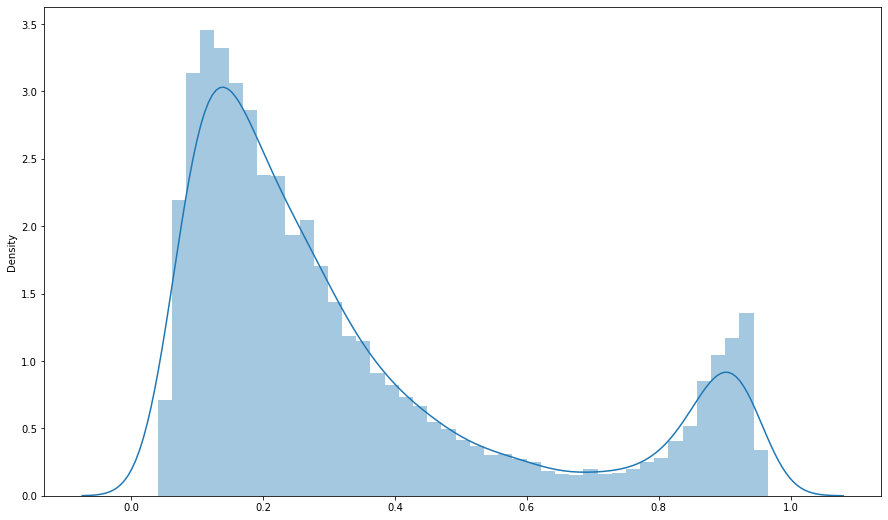

In [148]:
plt.figure(figsize=(15,9))
sns.distplot(pred_ensemble)

<AxesSubplot:ylabel='Density'>

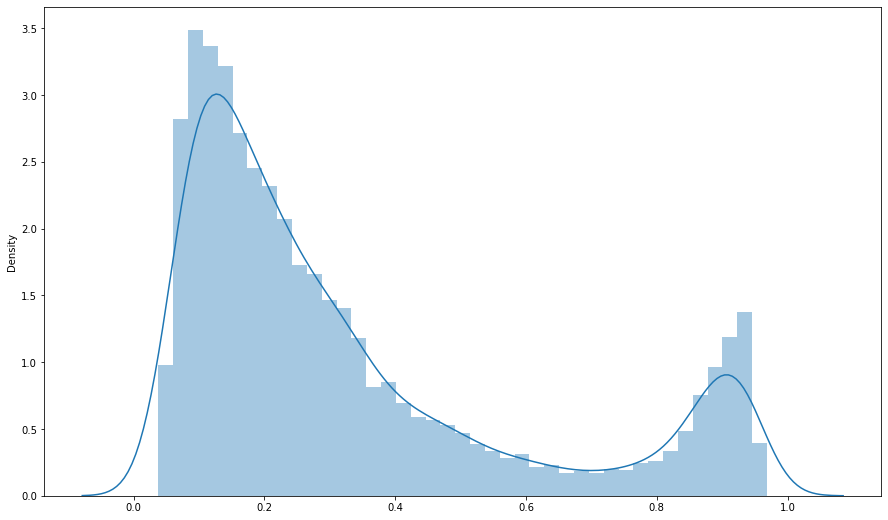

In [121]:
plt.figure(figsize=(15,9))
sns.distplot(pred_ensemble)

In [149]:
sample_sub = pd.read_csv(data_path+'/sample_submission.csv')
sample_sub = sample_sub.drop('problem', axis=1)

In [150]:
pred_y = pd.DataFrame({'user_id':test_data['user_id'], 'problem':pred_ensemble[:,0]})

In [151]:
sample_sub = pd.merge(sample_sub, pred_y, on='user_id', how='left')
sample_sub['problem'] = sample_sub['problem'].fillna(0)

In [152]:
sample_sub.to_csv("result_new17.csv", index = False)

In [81]:
sample_sub

,user_id,problem
0,30000,0.948919
1,30001,0.250333
2,30002,0.495005
3,30003,0.834989
4,30004,0.939052
...,...,...
14994,44994,0.297094
14995,44995,0.240567
14996,44996,0.637944
14997,44997,0.823894


In [217]:
sample_sub

,user_id,problem
0,30000,0.854289
1,30001,0.266415
2,30002,0.298109
3,30003,0.734431
4,30004,0.863827
...,...,...
14994,44994,0.263009
14995,44995,0.299339
14996,44996,0.437528
14997,44997,0.846632


<AxesSubplot:ylabel='Density'>

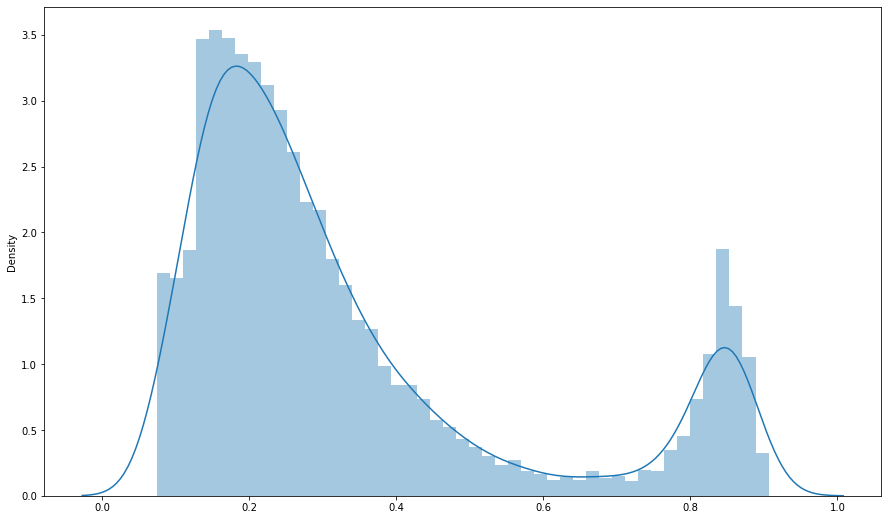

In [218]:
plt.figure(figsize=(15,9))
sns.distplot(pred_ensemble)

,fwver
0,04.33.1185
379,04.33.1261


In [26]:
a['fwver'].tolist()

['04.33.1185', '04.33.1261']

In [27]:
a = [1,2,3]

In [28]:
a[:1] + [5] + a[1:]

[1, 5, 2, 3]